# Preps

## Importing Independencieisausius

In [1]:
import pandas as pd
import numpy as np

# !pip install -q darts
# !pip install -q sklearn

import darts
from darts.metrics import mape, mae, rmse
from darts import TimeSeries, concatenate
from darts.models import TFTModel, RNNModel, TCNModel
from darts.dataprocessing.transformers import Scaler
from darts.utils.timeseries_generation import datetime_attribute_timeseries
from darts.utils.statistics import check_seasonality, plot_acf, extract_trend_and_seasonality
import torch

%matplotlib inline
import matplotlib.pyplot as plt
from datetime import datetime
import shutil
import tables
from statsmodels.tsa.stattools import adfuller

from tqdm import tqdm_notebook as tqdm

import warnings
warnings.filterwarnings("ignore")
import logging
logging.disable(logging.CRITICAL)

!pip install git+https://github.com/PyTorchLightning/pytorch-lightning -q
!pip install optuna -q
import pytorch_lightning as pl
print(pl.__version__)
# !pip install pytorch-lightning -q

import optuna
from optuna.integration import PyTorchLightningPruningCallback
from pytorch_lightning.callbacks import EarlyStopping
from sklearn.preprocessing import MaxAbsScaler, MinMaxScaler
from sklearn.ensemble import IsolationForest
from torchmetrics import MeanAbsolutePercentageError, MeanSquaredError
import time

2.1.3


In [2]:
# !git clone https://github.com/AfterRain007/Skripsi
# !git clone https://github.com/katemurraay/tsa_crt

## Importing Function

In [3]:
#Evaluate Model
def eval_model(n, series, pred_series, x):
    ## plot time series, limited to forecast horizon
    plt.figure(figsize=(9, 6))

    series.plot(label="actual")                                       # plot actual
    pred_series.plot(central_quantile="mean", label="expected")              # plot "mean" or median=0.5

    plt.title("TFT: test set (MAPE: {:.2f}%)".format(mape_))
    plt.legend()
    plt.savefig(f'/content/drive/MyDrive/Plot Images/Experiment/imageTFT-{x}.png')
    plt.close()

In [4]:
#Do Differencing Transformation to All Data
def differT(df):
    columns_to_diff = ['price', 'volume']
    
    for column in columns_to_diff:
        print(f"Transforming {column}")
        df[column] = df[column].diff()
    
    df = df.iloc[1:].copy()
    
    return df

#Inversing Back Differenced Data

def inverse_differenced_dataset(df, diff_vals, l = 0, df_start = 0):
  """
  Inverses the Difference on a Dataset
  :param  pd.DataFrame df: the orginial DataFrame from csv file
          list diff_vals:  List of Differenced Values
  :return np.array inverted_values: Array of values with Difference removed
  """
  invert = list()
  target = 'price'
  if df_start == 0:
      if l == 0: df_start = len(df) - len(diff_vals) -1
      else: df_start = len(df) - l -1

  for i in range(len(diff_vals)):
      value =  diff_vals[i] + df[target][df_start + i]
      invert.append(value)
  inverted_values = np.array(invert)
  return inverted_values

def testingDiff(model):
  global predict
  pred = model.predict(len(ts_ttest))
  pred = scalerP.inverse_transform(pred)
  done = inverse_differenced_dataset(dfPure.pd_dataframe(), pred.pd_dataframe()['price'].tolist())
  predict = pd.DataFrame(done)[1:]

  predict.index = test[:len(test)-1].time_index
  predict = TimeSeries.from_dataframe(predict)
  smape_ = smape(predict, test, n_jobs=-1, verbose=True)
  mape_ = mape(predict, test, n_jobs=-1, verbose=True)
  return smape_, mape_

In [5]:
def anomaly_search(df):
  anomaly_inputs = ['price', 'volume']
  model_IF = IsolationForest(contamination=float(0.1),random_state=42069)
  model_IF.fit(df[anomaly_inputs])
  df['anomaly_scores'] = model_IF.decision_function(df[anomaly_inputs])
  df['anomaly'] = model_IF.predict(df[anomaly_inputs])
  return df

def replaceOutlierMA(df, i):
    lenWin = i
    df = anomaly_search(df)
    df['anomaly'] = df['anomaly'].map({1:0, -1:1})
    dfAnomaly  = df[df['anomaly'] == 1]
    
    df['repVolume'] = df['volume'].rolling(window=lenWin).mean()
    df['repPrice'] = df['price'].rolling(window=lenWin).mean()
    
    dfAnomaly = dfAnomaly[dfAnomaly.index < df.iloc[int(len(df)*.8)].name].sort_values(by = 'anomaly_scores', ascending = True)
    dfAnomaly = dfAnomaly.iloc[:int(len(dfAnomaly)*.1)]
    
    df2 = df.copy()
    df2.loc[dfAnomaly.index, 'price']  =  df2['repPrice'].loc[dfAnomaly.index].values
    df2.loc[dfAnomaly.index, 'volume'] = df2['repVolume'].loc[dfAnomaly.index].values
    df2.drop(['anomaly_scores', 'anomaly', 'repPrice', 'repVolume'], axis = 1, inplace = True)

    df2 = differT(df2)
    return df2

def replaceOutlierBP(df):
    # Calculate the IQR (Interquartile Range)
    columns = ['price', 'volume']
    for column in columns:
        
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1
    
        # Define the lower and upper bounds for outlier detection
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
    
        # Identify outliers
        outliers_upper = (df[column] > upper_bound)
        outliers_under = (df[column] < lower_bound)
    
        # Handle outliers by replacing them with the bound value
        df.loc[outliers_upper, column] = upper_bound
        df.loc[outliers_under, column] = lower_bound

    df = differT(df)
    return df

# Optuna Griddy

## Function for Griddy

In [14]:
def createTimeseries(df):
    global ts_t
    ts_P = TimeSeries.from_dataframe(df[['price']])
    ts_covF = TimeSeries.from_dataframe(df[['sen', 'volume', 'trend']])
    
    SPLIT = .8
    # train/test split and scaling of target variable
    ts_train, ts_test = ts_P.split_after(SPLIT)
    
    scalerP = Scaler()
    scalerP.fit_transform(ts_train)
    ts_ttrain = scalerP.transform(ts_train)
    ts_ttest = scalerP.transform(ts_test)
    ts_t = scalerP.transform(ts_P)
    
    # make sure data are of type float
    ts_t = ts_t.astype(np.float32)
    ts_ttrain = ts_ttrain.astype(np.float32)
    ts_ttest = ts_ttest.astype(np.float32)
    
    # train/test split and scaling of feature covariates
    covF_train, covF_test = ts_covF.split_after(SPLIT)
    
    scalerF = Scaler()
    scalerF.fit_transform(covF_train)
    covF_ttrain = scalerF.transform(covF_train)
    covF_ttest = scalerF.transform(covF_test)
    covF_t = scalerF.transform(ts_covF)
    
    # make sure data are of type float
    covF_ttrain = covF_ttrain.astype(np.float32)
    covF_ttest = covF_ttest.astype(np.float32)
    
    # feature engineering - create time covariates: hour, weekday, month, year, country-specific holidays
    covT = datetime_attribute_timeseries(ts_P.time_index, attribute="day", one_hot=False, add_length=len(covF_ttrain))
    covT = covT.stack(datetime_attribute_timeseries(covT.time_index, attribute="week"))
    covT = covT.stack(datetime_attribute_timeseries(covT.time_index, attribute="month"))
    covT = covT.stack(datetime_attribute_timeseries(covT.time_index, attribute="year"))
    covT = covT.stack(TimeSeries.from_times_and_values(times=covT.time_index, values=np.arange(len(ts_P) + len(covF_ttrain)), columns=["linear_increase"]))
    covT = covT.add_holidays(country_code="US")
    covT = covT.astype(np.float32)
    
    # train/test split
    covT_train, covT_test = covT.split_after(ts_train.end_time())
    
    # rescale the covariates: fitting on the training set
    scalerT = Scaler()
    scalerT.fit(covT_train)
    covT_ttrain = scalerT.transform(covT_train)
    covT_ttest = scalerT.transform(covT_test)
    covT_t = scalerT.transform(covT)
    
    covT_ttrain = covT_ttrain.astype(np.float32)
    covT_ttest  = covT_ttest.astype(np.float32)
    covT_t      = covT_t.astype(np.float32)
    
    # combine feature and time covariates along component dimension: axis=1
    ts_cov = ts_covF.concatenate( covT.slice_intersect(ts_covF), axis=1 )                      # unscaled F+T
    cov_t = covF_t.concatenate( covT_t.slice_intersect(covF_t), axis=1 )                       # scaled F+T
    cov_ttrain = covF_ttrain.concatenate( covT_ttrain.slice_intersect(covF_ttrain), axis=1 )   # scaled F+T training set
    cov_ttest = covF_ttest.concatenate( covT_ttest.slice_intersect(covF_ttest), axis=1 )       # scaled F+T test set
    
    return ts_ttrain, ts_ttest, cov_t

In [15]:
# throughout training we'll monitor the validation loss for both pruning and early stopping
my_stopper = EarlyStopping(monitor="val_loss",
                           patience=10,
                           min_delta=0.01,
                           mode='min',)

callbacks = [my_stopper]

pl_trainer_kwargs = {
    "accelerator": "auto",
    "callbacks": callbacks,
    }

# reproducibility
np.random.seed(42069)
torch.manual_seed(42069)

# define objective function
def objectiveLSTM(trial):
    # select input and output chunk lengths
    input_chunk_length = trial.suggest_int("input_chunk_length", 1, 31)
    training_length = trial.suggest_int("training_length", input_chunk_length + 1, 62)

    # Other hyperparameters
    hidden_dim = trial.suggest_int("hidden_dim", 8, 32)
    n_rnn_layers = trial.suggest_categorical("n_rnn_layers", [1, 2, 3])
    dropout = trial.suggest_float("dropout", 0, 0.3)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])
    lr = trial.suggest_float("lr", 1e-3, 5e-3)

    # build the LSTM model
    model = RNNModel(
        model = "LSTM",
        hidden_dim = hidden_dim,
        n_rnn_layers = n_rnn_layers,
        dropout = dropout,
        batch_size = batch_size,
        training_length = training_length,
        input_chunk_length = input_chunk_length,
        optimizer_kwargs = {"lr": lr},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        torch_metrics = MeanAbsolutePercentageError(),
        log_tensorboard = True,
        random_state = 42069,
        force_reset = True,
        save_checkpoints = False,
        pl_trainer_kwargs = pl_trainer_kwargs
    )

    # when validating during training, we can use a slightly longer validation
    # set which also contains the first input_chunk_length time steps
    # model_val_set = scaler.transform(series[-(VAL_LEN + in_len) :])

    # train the model
    model.fit(ts_ttrain,                  # Train Price
            val_series=ts_ttest,          # Val Price
            future_covariates=cov_t,      # Val Covariate
            val_future_covariates=cov_t,  # Val Covariate
            verbose=True)

    return rmse_ if rmse_ != np.nan else float("inf")


# Evaluate how good it is on the validation set
pred = model.predict(len(ts_ttest))

# Calculate Metrics
mape_ = mape(ts_ttest, pred)
mae_ = mae(ts_ttest, pred)
rmse_ = rmse(ts_ttest, pred)

In [16]:
# define objective function
def objectiveGRU(trial):
    global mape_, mae_
    # select input and output chunk lengths
    input_chunk_length = trial.suggest_int("input_chunk_length", 1, 31)
    training_length = trial.suggest_int("training_length", input_chunk_length + 1, 62)

    # Other hyperparameters
    hidden_dim = trial.suggest_int("hidden_dim", 8, 32)
    n_rnn_layers = trial.suggest_categorical("n_rnn_layers", [1, 2, 3])
    dropout = trial.suggest_float("dropout", 0, 0.3)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])
    lr = trial.suggest_float("lr", 1e-3, 5e-3)
    
    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]

    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }

    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)

    # build the GRU model
    model = RNNModel(
        model = "GRU",
        hidden_dim = hidden_dim,
        n_rnn_layers = n_rnn_layers,
        dropout = dropout,
        batch_size = batch_size,
        training_length = training_length,
        input_chunk_length = input_chunk_length,
        optimizer_kwargs = {"lr": lr},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        torch_metrics = MeanAbsolutePercentageError(),
        log_tensorboard = True,
        random_state = 42069,
        force_reset = True,
        save_checkpoints = False,
        pl_trainer_kwargs = pl_trainer_kwargs
    )

    # when validating during training, we can use a slightly longer validation
    # set which also contains the first input_chunk_length time steps
    # model_val_set = scaler.transform(series[-(VAL_LEN + in_len) :])

    # train the model
    model.fit(ts_ttrain,                    # Train Price
              val_series=ts_ttest,          # Val Price
              future_covariates=cov_t,      # Val Covariate
              val_future_covariates=cov_t,  # Val Covariate
              verbose=True)

    # Evaluate how good it is on the validation set
    pred = model.predict(len(ts_ttest))
    
    # Calculate Metrics
    mape_ = mape(ts_ttest, pred)
    mae_ = mae(ts_ttest, pred)
    rmse_ = rmse(ts_ttest, pred)

    return rmse_ if rmse_ != np.nan else float("inf")

In [17]:
# define objective function
def objectiveTFT(trial):
    global mape_, mae_
    # select input and output chunk lengths
    in_len = trial.suggest_int("in_len", 1, 31)
    out_len = trial.suggest_int("out_len", 1, 31)

    # Other hyperparameters
    hidden_size = trial.suggest_int("hidden_size", 8, 32)
    lstm_layers = trial.suggest_categorical("lstm_layers", [1, 2, 3])
    num_attention_heads = trial.suggest_int("num_attention_heads", 2, 8)
    dropout = trial.suggest_float("dropout", 0, 0.3)
    hidden_continuous_size = trial.suggest_int("hidden_continuous_size", 6, 10)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])
    full_attention = trial.suggest_categorical("full_attention", [True, False])
    lr = trial.suggest_float("lr", 1e-3, 5e-3)
    
    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]

    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }

    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)

    # build the TFT model
    model = TFTModel(
        input_chunk_length = in_len,
        output_chunk_length = out_len,
        hidden_size = hidden_size,
        lstm_layers = lstm_layers,
        num_attention_heads = num_attention_heads,
        dropout = dropout,
        hidden_continuous_size = hidden_continuous_size,
        use_static_covariates = True,
        batch_size = batch_size,
        optimizer_kwargs = {'lr': lr},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        likelihood = None, 
        loss_fn = torch.nn.MSELoss(),
        full_attention = full_attention,
        torch_metrics = MeanAbsolutePercentageError(),
        random_state = 42069,
        force_reset= True,
        pl_trainer_kwargs = pl_trainer_kwargs,
        add_relative_index= False,
        # add_encoders = None,
        # likelihood=QuantileRegression(quantiles=QUANTILES)
    )

    # train the model
    model.fit(ts_ttrain,             # Train Price
              val_series=ts_ttest,          # Val Price
              future_covariates=cov_t,      # Val Covariate
              val_future_covariates=cov_t,  # Val Covariate
              verbose=True)
    
    # Evaluate how good it is on the validation set
    pred = model.predict(len(ts_ttest))
    
    # Calculate Metrics
    mape_ = mape(ts_ttest, pred)
    mae_ = mae(ts_ttest, pred)
    rmse_ = rmse(ts_ttest, pred)

    return rmse_ if rmse_ != np.nan else float("inf")

In [18]:
# define objective function
def objectiveTCN(trial):
    global mape_, mae_
    # select input and output chunk lengths
    in_len = trial.suggest_int("in_len", 2, 31)
    out_len = trial.suggest_int("out_len", 1, in_len - 1)

    # Other hyperparameters
    kernel_size = trial.suggest_int("kernel_size", 1, in_len - 1)
    num_filters = trial.suggest_int("num_filters", 2, 8)
    weight_norm = trial.suggest_categorical("weight_norm", [True, False])
    dilation_base = trial.suggest_int("dilation_base", 1, 5)
    num_layers = trial.suggest_int("num_layers", 1, 5)
    dropout = trial.suggest_float("dropout", 0, 0.3)
    lr = trial.suggest_float("lr", 1e-3, 5e-3)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])
    
    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]

    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }

    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)

    # print(f"{in_len} - {out_len} - {kernel_size} - {num_filters} - {weight_norm} - {dilation_base} - {num_layers} - {dropout} - {lr}")
    # build the TCN model
    model = TCNModel(
        input_chunk_length = in_len,
        output_chunk_length = out_len,
        kernel_size = kernel_size,
        num_filters = num_filters,
        weight_norm = weight_norm,
        dilation_base = dilation_base,
        num_layers = num_layers,
        dropout = dropout,
        batch_size = batch_size,
        optimizer_kwargs = {'lr': lr},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        likelihood = None, 
        loss_fn = torch.nn.MSELoss(),
        torch_metrics = MeanAbsolutePercentageError(),
        random_state = 42069,
        force_reset= True,
        pl_trainer_kwargs = pl_trainer_kwargs,
    )

    # train the model
    model.fit(
        series=ts_ttrain,
        val_series=ts_ttest,
        past_covariates=cov_t,
        val_past_covariates=cov_t,
    )
    
    # Evaluate how good it is on the validation set
    pred = model.predict(len(ts_ttest))
    
    # Calculate Metrics
    mape_ = mape(ts_ttest, pred)
    mae_ = mae(ts_ttest, pred)
    rmse_ = rmse(ts_ttest, pred)

    return rmse_ if rmse_ != np.nan else float("inf")

In [19]:
# for convenience, print some optimization trials information
def print_callback(study, trial):
    global dfResult
    print(f"Current value: {trial.value}, Current params: {trial.params}")
    print(f"Best value: {study.best_value}, Best params: {study.best_trial.params}")

    temp = trial.params
    temp.update({"RMSE" : trial.value, "MAE" : mae_, "MAPE" : mape_})
    results_list.append(temp)
    dfResult = pd.DataFrame(results_list)

## OMG GWIDDY

### TFT

In [61]:
timeTFT = []
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_30.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03276437520980835, Current params: {'in_len': 6, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.03743460420135488, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.002447612897668208}
Best value: 0.03276437520980835, Best params: {'in_len': 6, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.03743460420135488, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.002447612897668208}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02683720923960209, Current params: {'in_len': 30, 'out_len': 4, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2862541820182172, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002896659884711755}
Best value: 0.02683720923960209, Best params: {'in_len': 30, 'out_len': 4, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2862541820182172, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002896659884711755}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027160940691828728, Current params: {'in_len': 15, 'out_len': 26, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.21312248912206277, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.001561124106998068}
Best value: 0.02683720923960209, Best params: {'in_len': 30, 'out_len': 4, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2862541820182172, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002896659884711755}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02744913101196289, Current params: {'in_len': 26, 'out_len': 4, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.15827529968963705, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.002714434854577914}
Best value: 0.02683720923960209, Best params: {'in_len': 30, 'out_len': 4, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2862541820182172, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002896659884711755}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645762637257576, Current params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027033040300011635, Current params: {'in_len': 21, 'out_len': 19, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2814461885813702, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0034242642535570428}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027070654556155205, Current params: {'in_len': 16, 'out_len': 6, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.24712131852648722, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': False, 'lr': 0.002134731113603054}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026899447664618492, Current params: {'in_len': 10, 'out_len': 18, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.0967097482467726, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0032391861948033247}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02656739018857479, Current params: {'in_len': 19, 'out_len': 29, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.06879915246382737, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0046028427516745084}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02815568819642067, Current params: {'in_len': 5, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.23170747149152968, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0026642117304704906}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0315912663936615, Current params: {'in_len': 25, 'out_len': 11, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.017671419794731795, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.0011729629608852158}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026554984971880913, Current params: {'in_len': 20, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.09460091563344797, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004778611087463772}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026890331879258156, Current params: {'in_len': 13, 'out_len': 24, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.12522922162909234, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004951748311752904}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02709539607167244, Current params: {'in_len': 21, 'out_len': 31, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.14681431873779152, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.004142350754667542}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026516428217291832, Current params: {'in_len': 26, 'out_len': 23, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.06573994221922887, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.003863394706580035}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02759586274623871, Current params: {'in_len': 31, 'out_len': 22, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.04639013401532832, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003844847928023847}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026843490079045296, Current params: {'in_len': 26, 'out_len': 10, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.18561856572007807, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.0017651193366851371}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027542725205421448, Current params: {'in_len': 24, 'out_len': 21, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.013942395557309452, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.003703822020565272}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027401093393564224, Current params: {'in_len': 11, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.08033125596232352, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.002121874013380148}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02681160904467106, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.11733162323882122, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0043488665871438984}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0266095120459795, Current params: {'in_len': 28, 'out_len': 21, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.05598258875486304, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0010173994338257848}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027114640921354294, Current params: {'in_len': 22, 'out_len': 29, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.1044390801700419, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004892111856154547}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0265109334141016, Current params: {'in_len': 18, 'out_len': 25, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.08287427579536147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004165686218578556}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026731479912996292, Current params: {'in_len': 17, 'out_len': 25, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.03806413256814459, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003984005087230543}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028030872344970703, Current params: {'in_len': 1, 'out_len': 22, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.0033056124347161167, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003421267667087196}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02784085087478161, Current params: {'in_len': 23, 'out_len': 18, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.07428607695861608, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0042121523941311325}
Best value: 0.02645762637257576, Best params: {'in_len': 20, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06207299105309263, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002179092935443437}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0260156337171793, Current params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028022564947605133, Current params: {'in_len': 14, 'out_len': 28, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1563717121546933, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0044956528937013214}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0271469559520483, Current params: {'in_len': 28, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.1884534740586219, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.003123480842762664}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027324862778186798, Current params: {'in_len': 8, 'out_len': 15, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.13237348825430117, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0021381937770072385}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0326351523399353, Current params: {'in_len': 12, 'out_len': 20, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.17455892011265187, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0024360242186148174}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03242793306708336, Current params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.029103513673422593, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.0037404647251877005}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028345728293061256, Current params: {'in_len': 30, 'out_len': 23, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.05902511862525579, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004487492589149912}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026861092075705528, Current params: {'in_len': 23, 'out_len': 17, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.10865487433719614, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035231145851654464}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026826009154319763, Current params: {'in_len': 27, 'out_len': 25, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.08243877615844918, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.0040755713227032895}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02702588029205799, Current params: {'in_len': 19, 'out_len': 20, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.13827094122947892, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004646089778703521}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028208138421177864, Current params: {'in_len': 15, 'out_len': 23, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2073106791950525, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0029075931767316987}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0268537774682045, Current params: {'in_len': 25, 'out_len': 1, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.16598790850768236, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004347345807491733}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026489242911338806, Current params: {'in_len': 30, 'out_len': 27, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.05676636470219028, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015823616909078182}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026517871767282486, Current params: {'in_len': 30, 'out_len': 27, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.09196532502866472, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015368954404855243}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02630702033638954, Current params: {'in_len': 31, 'out_len': 29, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2654987561384119, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015572212521477074}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027741754427552223, Current params: {'in_len': 31, 'out_len': 29, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.28976333249062725, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0014519395777901698}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661246992647648, Current params: {'in_len': 29, 'out_len': 30, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.26470450134326656, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019937666449721747}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02902708575129509, Current params: {'in_len': 31, 'out_len': 27, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.047459232751927, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0018771990952381747}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0271647647023201, Current params: {'in_len': 29, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.25528273355075864, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.001286006838783304}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02826942317187786, Current params: {'in_len': 21, 'out_len': 28, 'hidden_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.22275383321128228, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002444118643641872}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026455972343683243, Current params: {'in_len': 17, 'out_len': 31, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2979963523164998, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026742314799953876}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02649769000709057, Current params: {'in_len': 16, 'out_len': 31, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2739601630981674, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025983540037821423}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028466422110795975, Current params: {'in_len': 27, 'out_len': 30, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.29967606352385817, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0016687979746376107}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666931413114071, Current params: {'in_len': 24, 'out_len': 28, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.23801350462973678, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0013838043807224332}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02647489123046398, Current params: {'in_len': 20, 'out_len': 30, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.21167376774627805, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0016893361187510071}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02689523994922638, Current params: {'in_len': 20, 'out_len': 30, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.20589449021772194, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0016655266965321953}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026492992416024208, Current params: {'in_len': 17, 'out_len': 31, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.247015156741837, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002359424288061159}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026920240372419357, Current params: {'in_len': 20, 'out_len': 26, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2785180550337406, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0021680681436339984}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02663547731935978, Current params: {'in_len': 25, 'out_len': 29, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.19668082965443498, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.002767611353816159}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027574077248573303, Current params: {'in_len': 29, 'out_len': 27, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.22955497281442117, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0018782765143087877}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02688339725136757, Current params: {'in_len': 22, 'out_len': 30, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2631362417904433, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022781108868785214}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026990868151187897, Current params: {'in_len': 27, 'out_len': 7, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.24763123753104, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0010555519976878799}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02671847492456436, Current params: {'in_len': 14, 'out_len': 29, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.29557135901023374, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0012929698532200993}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0340886116027832, Current params: {'in_len': 18, 'out_len': 26, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.17455234580164009, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0019605660117169984}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02738308347761631, Current params: {'in_len': 31, 'out_len': 13, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.274869684832131, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017505809088682683}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026541246101260185, Current params: {'in_len': 17, 'out_len': 31, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.24096202497086264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0023424658596962657}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02703183889389038, Current params: {'in_len': 16, 'out_len': 31, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.21643595586220077, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00264974938050208}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02655847929418087, Current params: {'in_len': 17, 'out_len': 28, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2892786567922221, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002787771038967716}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674774080514908, Current params: {'in_len': 19, 'out_len': 31, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2685728504442141, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003054597607624019}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028766609728336334, Current params: {'in_len': 13, 'out_len': 28, 'hidden_size': 32, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2614126398648051, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002029104232257671}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030371520668268204, Current params: {'in_len': 10, 'out_len': 24, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2559321367200825, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0022668185569270265}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026891108602285385, Current params: {'in_len': 22, 'out_len': 29, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.25014084765552724, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.003252532678195604}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027493342757225037, Current params: {'in_len': 14, 'out_len': 26, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.28417144885145784, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.0015202950847710299}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02687782235443592, Current params: {'in_len': 4, 'out_len': 19, 'hidden_size': 31, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.15056564517875703, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025382769294473744}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029079832136631012, Current params: {'in_len': 19, 'out_len': 30, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.23219505179567268, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0017917277434952449}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026483487337827682, Current params: {'in_len': 16, 'out_len': 31, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2684856295831585, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025525809456350495}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026471108198165894, Current params: {'in_len': 15, 'out_len': 31, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2713083135349631, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002901333563838359}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027177073061466217, Current params: {'in_len': 12, 'out_len': 29, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.28652831984345883, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029124224664413617}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026819679886102676, Current params: {'in_len': 15, 'out_len': 27, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.02763458916269684, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0032337231003557623}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02673996053636074, Current params: {'in_len': 30, 'out_len': 30, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2752227282990115, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': False, 'lr': 0.0028058738934189625}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.035881079733371735, Current params: {'in_len': 15, 'out_len': 15, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.12405388526344391, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.002515897362066515}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026691801846027374, Current params: {'in_len': 10, 'out_len': 22, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.06981216291766021, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0030288212478936207}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028416868299245834, Current params: {'in_len': 21, 'out_len': 28, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2960090653690964, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0016374569383833222}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026495778933167458, Current params: {'in_len': 26, 'out_len': 31, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.1965712129613565, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0012161040112462099}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02734142541885376, Current params: {'in_len': 18, 'out_len': 24, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.05762708065066892, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0035245238878764845}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026753783226013184, Current params: {'in_len': 17, 'out_len': 31, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.23975160716037658, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0023395593489839417}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659497782588005, Current params: {'in_len': 16, 'out_len': 30, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2700388338277133, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026698419610059333}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0272976141422987, Current params: {'in_len': 13, 'out_len': 29, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.25809356452892646, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002095777573650454}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026631679385900497, Current params: {'in_len': 20, 'out_len': 31, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2826398776629973, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0014194168898385667}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026998266577720642, Current params: {'in_len': 29, 'out_len': 30, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.22465265111376895, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002534664299966959}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028483519330620766, Current params: {'in_len': 18, 'out_len': 28, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.24398125367060153, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0024297450142694915}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06458966434001923, Current params: {'in_len': 16, 'out_len': 29, 'hidden_size': 24, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.04371880667671217, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.0031745916723078522}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026669826358556747, Current params: {'in_len': 23, 'out_len': 27, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.25187864271343846, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028593054895808627}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026843464002013206, Current params: {'in_len': 30, 'out_len': 21, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.10922638914785751, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.002191078251429892}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026934359222650528, Current params: {'in_len': 15, 'out_len': 17, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.14069813063377154, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.001877599721669653}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029532698914408684, Current params: {'in_len': 28, 'out_len': 31, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.1925399393190888, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0011847051836679275}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026914585381746292, Current params: {'in_len': 26, 'out_len': 30, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.1735329843731278, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.001106945002532335}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026919560506939888, Current params: {'in_len': 31, 'out_len': 31, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.20554621713795734, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0013388034451642101}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026765210554003716, Current params: {'in_len': 27, 'out_len': 29, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.19762353587945217, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0012317156127593914}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026632165536284447, Current params: {'in_len': 28, 'out_len': 30, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.18534673638977786, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0015152773942424256}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02647755667567253, Current params: {'in_len': 17, 'out_len': 31, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16156498381437973, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002677022427315094}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02690325677394867, Current params: {'in_len': 17, 'out_len': 25, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16197314463329482, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0027051514969271507}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029026521369814873, Current params: {'in_len': 14, 'out_len': 28, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.09038212585547485, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.002336375386674366}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028006311506032944, Current params: {'in_len': 18, 'out_len': 27, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.15459221767141887, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025977527927809447}
Best value: 0.0260156337171793, Best params: {'in_len': 28, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16417731658398205, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004473961864229739}


In [62]:
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_BP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04843991622328758, Current params: {'in_len': 26, 'out_len': 8, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.23019887475615763, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0032326443696917575}
Best value: 0.04843991622328758, Best params: {'in_len': 26, 'out_len': 8, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.23019887475615763, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0032326443696917575}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049134768545627594, Current params: {'in_len': 28, 'out_len': 1, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.03898187479188903, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.002105132298427432}
Best value: 0.04843991622328758, Best params: {'in_len': 26, 'out_len': 8, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.23019887475615763, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0032326443696917575}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04836518317461014, Current params: {'in_len': 9, 'out_len': 17, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2361290905807585, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.004843182791146576}
Best value: 0.04836518317461014, Best params: {'in_len': 9, 'out_len': 17, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2361290905807585, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.004843182791146576}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04809397831559181, Current params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0865824967622757, Current params: {'in_len': 19, 'out_len': 18, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.010117740159548015, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.004104593649181965}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05063223838806152, Current params: {'in_len': 30, 'out_len': 21, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.13193946572125387, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.0017887613884165216}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05933140590786934, Current params: {'in_len': 13, 'out_len': 30, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.15496255682060148, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0021736461181221774}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05001579597592354, Current params: {'in_len': 9, 'out_len': 7, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.16691035227654547, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004198295476656315}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04833953082561493, Current params: {'in_len': 9, 'out_len': 14, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.23348266394269, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.0014300231358422568}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812565818428993, Current params: {'in_len': 24, 'out_len': 10, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.24259052916451818, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004046732651889255}
Best value: 0.04809397831559181, Best params: {'in_len': 12, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24047497062340759, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003723765080060442}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047983232885599136, Current params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0486183762550354, Current params: {'in_len': 2, 'out_len': 26, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2983220908886958, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0030588789821968504}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048624202609062195, Current params: {'in_len': 1, 'out_len': 24, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29751972087415524, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0027348397633676974}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048016469925642014, Current params: {'in_len': 18, 'out_len': 29, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2745728051806732, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035906378444684572}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04834961146116257, Current params: {'in_len': 19, 'out_len': 31, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.10158697637993913, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': False, 'lr': 0.002611894448315322}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04866086691617966, Current params: {'in_len': 22, 'out_len': 26, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2771168531662979, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0033676019898234307}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803933948278427, Current params: {'in_len': 17, 'out_len': 23, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.19408303957264475, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0048928299907689985}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04912089928984642, Current params: {'in_len': 4, 'out_len': 28, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.26793984299946244, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.003737920813293899}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.1026054322719574, Current params: {'in_len': 13, 'out_len': 21, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.18771538405058405, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.002595135445468129}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048568595200777054, Current params: {'in_len': 6, 'out_len': 27, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.0739045037318274, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.004467819779164904}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04884948953986168, Current params: {'in_len': 21, 'out_len': 31, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.20058485566190642, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035455611290948702}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480521060526371, Current params: {'in_len': 17, 'out_len': 23, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2674268074181287, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.004933359695842097}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048728182911872864, Current params: {'in_len': 16, 'out_len': 22, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.21323092208882877, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0010304223059863257}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0486496202647686, Current params: {'in_len': 15, 'out_len': 19, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2662727220944596, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.00456555576421951}
Best value: 0.047983232885599136, Best params: {'in_len': 1, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29846841705342153, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031009176531241103}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04794158786535263, Current params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048332128673791885, Current params: {'in_len': 22, 'out_len': 28, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.1256468070986244, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002905233387973311}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04832328110933304, Current params: {'in_len': 19, 'out_len': 13, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.0888091383985859, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.0023808219527679444}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09337727725505829, Current params: {'in_len': 25, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.171977598250136, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.003147276798863616}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048090215772390366, Current params: {'in_len': 11, 'out_len': 29, 'hidden_size': 32, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.1365284062273306, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0034717059351505263}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07151123136281967, Current params: {'in_len': 6, 'out_len': 20, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.0560642994133682, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0029102641296879475}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04827782139182091, Current params: {'in_len': 15, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.10458375943471654, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.003907485600617432}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805978015065193, Current params: {'in_len': 17, 'out_len': 23, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.21023743150380453, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.003319819890342613}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812535643577576, Current params: {'in_len': 27, 'out_len': 28, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2544464191218587, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.00446880789487631}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04861465096473694, Current params: {'in_len': 20, 'out_len': 24, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.28366311556837875, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.0018797188164337516}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047943536192178726, Current params: {'in_len': 23, 'out_len': 26, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.18218017108036913, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002410497115238763}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04822605848312378, Current params: {'in_len': 29, 'out_len': 1, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.21597208102497062, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002272330020019281}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09644941240549088, Current params: {'in_len': 24, 'out_len': 29, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.004356176991284599, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.001905765497883395}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04844458028674126, Current params: {'in_len': 31, 'out_len': 17, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.11802559335108914, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.002477162567523703}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823172837495804, Current params: {'in_len': 22, 'out_len': 26, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.14169856865094738, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': True, 'lr': 0.00287639683204209}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799410700798035, Current params: {'in_len': 26, 'out_len': 30, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.03269045420143339, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003180232424542697}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08433261513710022, Current params: {'in_len': 27, 'out_len': 31, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.04161271814601965, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.003175042707485473}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048291999846696854, Current params: {'in_len': 24, 'out_len': 29, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.02230905153858939, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0036236513737142604}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04878341406583786, Current params: {'in_len': 26, 'out_len': 27, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.15615504225474264, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003823021374045052}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04827883094549179, Current params: {'in_len': 28, 'out_len': 30, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2487004589126846, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0027519227029105292}
Best value: 0.04794158786535263, Best params: {'in_len': 18, 'out_len': 25, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12861825261242626, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028952959532576946}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04788196086883545, Current params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04795003682374954, Current params: {'in_len': 23, 'out_len': 25, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.05767582206794476, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0016241983116004636}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05777309462428093, Current params: {'in_len': 21, 'out_len': 21, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.05673934674675207, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0014884312226424747}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05009903386235237, Current params: {'in_len': 24, 'out_len': 25, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.07193850957491495, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0022079268378521217}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816829785704613, Current params: {'in_len': 20, 'out_len': 19, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.08473826363885376, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015480296059248446}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049272093921899796, Current params: {'in_len': 23, 'out_len': 24, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.11636375362399459, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0020390327106126916}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04845883324742317, Current params: {'in_len': 14, 'out_len': 15, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.020141308604966157, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.001310331324740561}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480429045855999, Current params: {'in_len': 25, 'out_len': 27, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.04147667014980433, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.002037721232516077}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05061621963977814, Current params: {'in_len': 18, 'out_len': 26, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.02050295931772353, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0016425721309098278}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05248868465423584, Current params: {'in_len': 20, 'out_len': 22, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.05696708926824333, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0023771208405877296}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048594485968351364, Current params: {'in_len': 26, 'out_len': 30, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.0304859471994844, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0026623647535081673}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048098403960466385, Current params: {'in_len': 23, 'out_len': 27, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.17650138899632128, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0030722593527891793}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799020290374756, Current params: {'in_len': 10, 'out_len': 25, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.07582979289433525, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001236911742287792}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04848023131489754, Current params: {'in_len': 10, 'out_len': 24, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.06856585737777149, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0012383538488459232}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050377730280160904, Current params: {'in_len': 3, 'out_len': 22, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.09396573490275481, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017544538086276085}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048959989100694656, Current params: {'in_len': 6, 'out_len': 25, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1042590028450103, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0010454387032964758}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04840507358312607, Current params: {'in_len': 1, 'out_len': 11, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.15088448545200486, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.0013669612305081333}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0483890064060688, Current params: {'in_len': 4, 'out_len': 28, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.04816463529335764, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001184723327183374}
Best value: 0.04788196086883545, Best params: {'in_len': 20, 'out_len': 27, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06785210132297945, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0020595776408319244}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04784378036856651, Current params: {'in_len': 7, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06592003298081824, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0016687736369453724}
Best value: 0.04784378036856651, Best params: {'in_len': 7, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06592003298081824, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0016687736369453724}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047600749880075455, Current params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481024906039238, Current params: {'in_len': 7, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.061101158197006275, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.001678544593143753}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047937728464603424, Current params: {'in_len': 8, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.08040996785762702, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0019144027459464578}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04897812753915787, Current params: {'in_len': 7, 'out_len': 26, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.08063907729848797, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0018879722756459968}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04827691987156868, Current params: {'in_len': 9, 'out_len': 20, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.183055167992367, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002108245598826537}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048859987407922745, Current params: {'in_len': 13, 'out_len': 27, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.09679902134453927, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.001605921645770537}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049665916711091995, Current params: {'in_len': 18, 'out_len': 24, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.04702238901988982, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0017874464728212455}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04822416603565216, Current params: {'in_len': 7, 'out_len': 28, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06419182510625734, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019943591925131784}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047701481729745865, Current params: {'in_len': 2, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.08569278275095538, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002482989402513497}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04786044359207153, Current params: {'in_len': 8, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.08468459347727902, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002346973174561725}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04781288653612137, Current params: {'in_len': 8, 'out_len': 26, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.11705167487933976, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002430187411877249}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812319576740265, Current params: {'in_len': 8, 'out_len': 22, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.1107919861533328, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025073946390684106}
Best value: 0.047600749880075455, Best params: {'in_len': 8, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06475505161156034, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001725359893094368}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047583065927028656, Current params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04811248555779457, Current params: {'in_len': 4, 'out_len': 8, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.08440151796960844, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002267352662579528}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05022002384066582, Current params: {'in_len': 3, 'out_len': 3, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.09183977717351872, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.0021639297156127073}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048313841223716736, Current params: {'in_len': 5, 'out_len': 5, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.12686732409835652, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.0023306272630467745}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04866361618041992, Current params: {'in_len': 8, 'out_len': 29, 'hidden_size': 32, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.1130834672513579, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025055344903568066}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04837947338819504, Current params: {'in_len': 2, 'out_len': 13, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.1381600065139778, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0027558800249464915}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04780898243188858, Current params: {'in_len': 11, 'out_len': 26, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.16051618075172414, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002201369888948794}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04774942249059677, Current params: {'in_len': 11, 'out_len': 27, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.07507791464394377, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0019293077768031176}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0482008270919323, Current params: {'in_len': 11, 'out_len': 27, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.06869394410634265, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0021661093340368696}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0483892560005188, Current params: {'in_len': 12, 'out_len': 28, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.14523489276389098, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0026096966714494294}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05330552160739899, Current params: {'in_len': 5, 'out_len': 24, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.16263299862381075, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.002013918900310621}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04857533425092697, Current params: {'in_len': 10, 'out_len': 23, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.0982319175577217, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.002252731680469154}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047819554805755615, Current params: {'in_len': 9, 'out_len': 29, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.04975605821857113, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0017272154927651777}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807165637612343, Current params: {'in_len': 9, 'out_len': 31, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.05094273242910268, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0017268075278586465}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04910081624984741, Current params: {'in_len': 11, 'out_len': 29, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12295591407794484, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.0014703473248710297}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812213405966759, Current params: {'in_len': 5, 'out_len': 30, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.10664030184306862, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001831080113878269}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04897478595376015, Current params: {'in_len': 8, 'out_len': 28, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.07568761795750432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001974511543446624}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806724935770035, Current params: {'in_len': 6, 'out_len': 27, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.0889319759827958, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002057814776547135}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047956712543964386, Current params: {'in_len': 12, 'out_len': 26, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.0650704776165836, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002135807846792734}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04934924095869064, Current params: {'in_len': 9, 'out_len': 25, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.037348505791914025, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.00236382793065851}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481913760304451, Current params: {'in_len': 7, 'out_len': 29, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.13176503117637067, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0018484249440041643}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04887016862630844, Current params: {'in_len': 10, 'out_len': 27, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.05040766989643264, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0015463022653506848}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06812270730733871, Current params: {'in_len': 2, 'out_len': 17, 'hidden_size': 26, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.16270439010990545, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.002445596778021795}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04859212785959244, Current params: {'in_len': 6, 'out_len': 26, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.07749056562549593, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002316433304410254}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04794488847255707, Current params: {'in_len': 9, 'out_len': 28, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.07109087768490413, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0017276515271359167}
Best value: 0.047583065927028656, Best params: {'in_len': 5, 'out_len': 4, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.12957565796155432, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022946001710372707}


In [63]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_MAnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02657826989889145, Current params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029842033982276917, Current params: {'in_len': 2, 'out_len': 9, 'hidden_size': 31, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.036146104045562885, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.004534321736651619}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028486579656600952, Current params: {'in_len': 5, 'out_len': 27, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.0559821552436228, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.00246393991816211}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026765383780002594, Current params: {'in_len': 28, 'out_len': 16, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.2021135914573011, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.004915579159350794}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02768421545624733, Current params: {'in_len': 26, 'out_len': 9, 'hidden_size': 24, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.14447262262805602, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.002201557679880471}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026990169659256935, Current params: {'in_len': 28, 'out_len': 14, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.10938272431654662, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.0031806939938287646}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02695012465119362, Current params: {'in_len': 3, 'out_len': 3, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.10097523601738413, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.0016513617662431868}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02747342921793461, Current params: {'in_len': 21, 'out_len': 7, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.020140666175675368, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.004780174112798307}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027654148638248444, Current params: {'in_len': 31, 'out_len': 25, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.022849701558067512, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002838668356125963}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02728687785565853, Current params: {'in_len': 6, 'out_len': 20, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2024086681862933, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0014390248620787323}
Best value: 0.02657826989889145, Best params: {'in_len': 24, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.0591284487662816, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002294427270254423}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026556428521871567, Current params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2559079273419795, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037661783558643183}
Best value: 0.026556428521871567, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2559079273419795, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037661783558643183}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026524340733885765, Current params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02692948281764984, Current params: {'in_len': 13, 'out_len': 31, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29928952210697535, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003799994052404817}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027091270312666893, Current params: {'in_len': 14, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2720632961332527, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.003892424335991872}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027071429416537285, Current params: {'in_len': 10, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.24371792387009755, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003793688409513186}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02698497846722603, Current params: {'in_len': 19, 'out_len': 23, 'hidden_size': 28, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.2267541449785056, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0033869406738735526}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02668215148150921, Current params: {'in_len': 10, 'out_len': 29, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.29900167372926273, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004444885628974637}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026619911193847656, Current params: {'in_len': 18, 'out_len': 19, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.24709225185763228, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.004142200327774788}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026654677465558052, Current params: {'in_len': 10, 'out_len': 17, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.17938755642542653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003280652865373745}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027092859148979187, Current params: {'in_len': 16, 'out_len': 25, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.2584602299452534, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0027779641087852637}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02669481746852398, Current params: {'in_len': 7, 'out_len': 13, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.15572898877615798, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0010219693920357382}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666042372584343, Current params: {'in_len': 23, 'out_len': 14, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.07191925646111082, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0022339869151393917}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674051932990551, Current params: {'in_len': 15, 'out_len': 11, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2771962126355469, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0035972620295563335}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026797069236636162, Current params: {'in_len': 23, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.21534635965212928, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.004190608193043693}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02898726426064968, Current params: {'in_len': 12, 'out_len': 24, 'hidden_size': 27, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.1200104248135333, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025363141949503636}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026655111461877823, Current params: {'in_len': 18, 'out_len': 22, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.18000961630176185, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00300292746706515}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027452578768134117, Current params: {'in_len': 21, 'out_len': 4, 'hidden_size': 18, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.08344220348474415, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0019103704546825718}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02671889401972294, Current params: {'in_len': 8, 'out_len': 16, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.13516608492044038, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0035759927218141606}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026951095089316368, Current params: {'in_len': 12, 'out_len': 12, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2792490409105268, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.004023234379926172}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02832200564444065, Current params: {'in_len': 17, 'out_len': 6, 'hidden_size': 32, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.059591984237685025, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.004412955744082699}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026808608323335648, Current params: {'in_len': 2, 'out_len': 27, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.006502383999255901, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003590173699368292}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027059946209192276, Current params: {'in_len': 24, 'out_len': 19, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2442856924108922, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.00450201686635097}
Best value: 0.026524340733885765, Best params: {'in_len': 13, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28768853076167983, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037341264969504846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026478318497538567, Current params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027184495702385902, Current params: {'in_len': 20, 'out_len': 15, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.22546354171925725, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.004805503838199976}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02688748575747013, Current params: {'in_len': 16, 'out_len': 17, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.26338279086797006, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025271556742761676}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028682537376880646, Current params: {'in_len': 26, 'out_len': 9, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.17577049996171226, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.004165390296258997}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0267642829567194, Current params: {'in_len': 25, 'out_len': 11, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.2927936036750568, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003091625656962481}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026579778641462326, Current params: {'in_len': 28, 'out_len': 1, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.03773837544845515, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.003398584471443704}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026750514283776283, Current params: {'in_len': 30, 'out_len': 22, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.19810225049688274, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0021808726770762526}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026566313579678535, Current params: {'in_len': 21, 'out_len': 26, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.23243258351339335, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0027980491809806813}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026542823761701584, Current params: {'in_len': 21, 'out_len': 27, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2516422914997494, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0027832378171594075}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026515746489167213, Current params: {'in_len': 22, 'out_len': 28, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.23066958046046565, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028260726872527814}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026479702442884445, Current params: {'in_len': 23, 'out_len': 29, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.25621598371072535, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026836500084436075}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02663690410554409, Current params: {'in_len': 22, 'out_len': 29, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2857915445085282, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026145555896681305}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0271799024194479, Current params: {'in_len': 27, 'out_len': 30, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26576154703025734, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002352995862187043}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026495561003684998, Current params: {'in_len': 19, 'out_len': 28, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.20545974421362567, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002895572043517179}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02718811295926571, Current params: {'in_len': 19, 'out_len': 28, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2080226941778754, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.003218511850257931}
Best value: 0.026478318497538567, Best params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.24417315500577105, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041904267099807085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026386907324194908, Current params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2340069834802624, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019389119022929027}
Best value: 0.026386907324194908, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2340069834802624, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019389119022929027}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026539601385593414, Current params: {'in_len': 24, 'out_len': 31, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.1945826462560709, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0020313134916288265}
Best value: 0.026386907324194908, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2340069834802624, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019389119022929027}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02704373374581337, Current params: {'in_len': 25, 'out_len': 29, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2359863210915447, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0017627587484578705}
Best value: 0.026386907324194908, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2340069834802624, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019389119022929027}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027076834812760353, Current params: {'in_len': 23, 'out_len': 31, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.21638424966755282, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0011986124896271298}
Best value: 0.026386907324194908, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2340069834802624, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019389119022929027}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026360992342233658, Current params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026563921943306923, Current params: {'in_len': 19, 'out_len': 25, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.22111882220154985, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002940406731370867}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026385372504591942, Current params: {'in_len': 22, 'out_len': 28, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2369200576528339, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026295233447477615}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026774248108267784, Current params: {'in_len': 20, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2393057926738263, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0014852469358317016}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02664322778582573, Current params: {'in_len': 18, 'out_len': 28, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.1861353000926282, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0023823381299208843}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02694367803633213, Current params: {'in_len': 29, 'out_len': 30, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.16076578816480253, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0026813436080693554}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651660144329071, Current params: {'in_len': 26, 'out_len': 24, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.20843517662636343, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0020987211160261843}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027090605348348618, Current params: {'in_len': 22, 'out_len': 30, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2555534923366588, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002981983272147684}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02657775580883026, Current params: {'in_len': 20, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2692559438485048, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.003100253087857515}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026850707828998566, Current params: {'in_len': 17, 'out_len': 24, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2477351947284123, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0033465191334349246}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026929939165711403, Current params: {'in_len': 24, 'out_len': 28, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.23169995624403625, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026671113070416046}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026518801227211952, Current params: {'in_len': 22, 'out_len': 28, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.22348063279741068, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002420472317173929}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026387140154838562, Current params: {'in_len': 23, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.237444369278622, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028863365065453224}
Best value: 0.026360992342233658, Best params: {'in_len': 19, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23702051001426505, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002929604125435031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02635137364268303, Current params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0266586784273386, Current params: {'in_len': 25, 'out_len': 30, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.27745571437683303, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0018092423821905452}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026581784710288048, Current params: {'in_len': 27, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2582835933502855, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0014528667563059787}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0266497191041708, Current params: {'in_len': 26, 'out_len': 31, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.24101631367639306, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.001996909090254749}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026399623602628708, Current params: {'in_len': 4, 'out_len': 30, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.26727375168708584, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022918428911828793}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026579122990369797, Current params: {'in_len': 1, 'out_len': 30, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.27304541197095733, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0016232546364075193}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027559570968151093, Current params: {'in_len': 3, 'out_len': 29, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.28625211291269087, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002300101670846501}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650163695216179, Current params: {'in_len': 23, 'out_len': 29, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2550911618049657, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025373369974049736}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026637917384505272, Current params: {'in_len': 24, 'out_len': 27, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.24848483583937075, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022380019841898788}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666284330189228, Current params: {'in_len': 21, 'out_len': 31, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2656458760093256, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019657228901834535}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651338465511799, Current params: {'in_len': 23, 'out_len': 29, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.21624745574741833, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0021359726220222955}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026609526947140694, Current params: {'in_len': 25, 'out_len': 26, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.24040355438960437, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0024685025099602325}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027178622782230377, Current params: {'in_len': 20, 'out_len': 30, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29435010718344484, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.001886852583747768}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026528673246502876, Current params: {'in_len': 15, 'out_len': 31, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.28245100682530994, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0016066114769767471}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026903904974460602, Current params: {'in_len': 27, 'out_len': 27, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2610687322473739, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.004962751828829692}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026590736582875252, Current params: {'in_len': 4, 'out_len': 25, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2709261018936281, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0027094223015853686}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.032855939120054245, Current params: {'in_len': 21, 'out_len': 23, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.25106717711016663, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.003118099828919243}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026510942727327347, Current params: {'in_len': 18, 'out_len': 29, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.20872360836061846, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002897051157579131}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026577357202768326, Current params: {'in_len': 19, 'out_len': 28, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.23084326186408094, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002568553428377683}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026945389807224274, Current params: {'in_len': 22, 'out_len': 30, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2448965709214482, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002865147777079423}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026421014219522476, Current params: {'in_len': 24, 'out_len': 27, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2211331746206261, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0030308293565711993}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026614345610141754, Current params: {'in_len': 8, 'out_len': 27, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.22402521610013723, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00348401342017084}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026391757652163506, Current params: {'in_len': 24, 'out_len': 20, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.23636457546237225, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017478486836024253}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026541193947196007, Current params: {'in_len': 24, 'out_len': 20, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.23520542643328562, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0017940750554852336}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646806463599205, Current params: {'in_len': 25, 'out_len': 18, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.21507406276891858, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.004636400549179446}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026584066450595856, Current params: {'in_len': 28, 'out_len': 17, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.19347960522461055, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0012753047622912318}
Best value: 0.02635137364268303, Best params: {'in_len': 25, 'out_len': 31, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.26001889562520325, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00184850884568206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026346122846007347, Current params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026682352647185326, Current params: {'in_len': 27, 'out_len': 20, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.10593691432204921, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017303634888818876}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02656908519566059, Current params: {'in_len': 25, 'out_len': 16, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.2194009521155258, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004314685028986052}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026655049994587898, Current params: {'in_len': 25, 'out_len': 19, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.1401588731451883, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.001576756108761311}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026514776051044464, Current params: {'in_len': 26, 'out_len': 22, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.17187271980407942, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.00205955121196161}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02675287052989006, Current params: {'in_len': 28, 'out_len': 18, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.20128646660821176, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004646121208886062}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666831761598587, Current params: {'in_len': 23, 'out_len': 15, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.21417562869463236, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.001687495599323291}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026510734111070633, Current params: {'in_len': 31, 'out_len': 19, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16332772196044487, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0018839777567009122}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027731968089938164, Current params: {'in_len': 29, 'out_len': 18, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.22780098770493193, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0013780307806156322}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030018847435712814, Current params: {'in_len': 26, 'out_len': 21, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.12126988001484679, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.0015403047891601167}
Best value: 0.026346122846007347, Best params: {'in_len': 26, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.16716232336573653, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017064537571215102}


In [64]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_BPnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06540878862142563, Current params: {'in_len': 25, 'out_len': 12, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.23542191438504245, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0017176568680107068}
Best value: 0.06540878862142563, Best params: {'in_len': 25, 'out_len': 12, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.23542191438504245, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0017176568680107068}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05002100393176079, Current params: {'in_len': 28, 'out_len': 28, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.08756837066356024, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.004174310337879971}
Best value: 0.05002100393176079, Best params: {'in_len': 28, 'out_len': 28, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.08756837066356024, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.004174310337879971}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04821779578924179, Current params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.057865697890520096, Current params: {'in_len': 18, 'out_len': 1, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.1657942770443113, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0032079673449863584}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05333756282925606, Current params: {'in_len': 16, 'out_len': 12, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.23179926343126248, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.003946355497431034}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05284760147333145, Current params: {'in_len': 9, 'out_len': 13, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2850720616422085, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.004893481190687677}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04985533654689789, Current params: {'in_len': 29, 'out_len': 13, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2610036525200312, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.00423407422757867}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.053380999714136124, Current params: {'in_len': 13, 'out_len': 6, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.020897645812557507, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.003915004793156149}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.056817878037691116, Current params: {'in_len': 7, 'out_len': 7, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.08713389502888695, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.0038953925870814704}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07527685910463333, Current params: {'in_len': 18, 'out_len': 20, 'hidden_size': 32, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.010050717591941826, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.0038062048582660777}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0483422726392746, Current params: {'in_len': 1, 'out_len': 21, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.17719728970040827, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0014506366195328828}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04891073703765869, Current params: {'in_len': 1, 'out_len': 21, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.17796259574841414, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0011839754326361386}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04899223521351814, Current params: {'in_len': 23, 'out_len': 27, 'hidden_size': 23, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20142458736369828, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002314549103444469}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048944566398859024, Current params: {'in_len': 1, 'out_len': 21, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.12117845273507766, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0021328205767123117}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04835174232721329, Current params: {'in_len': 22, 'out_len': 1, 'hidden_size': 27, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.29728241655487453, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0010524135581157907}
Best value: 0.04821779578924179, Best params: {'in_len': 25, 'out_len': 3, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.29382481724629195, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017880533532679457}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047918230295181274, Current params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05064666271209717, Current params: {'in_len': 31, 'out_len': 30, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.13456075946851745, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002720871844835274}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0508754663169384, Current params: {'in_len': 26, 'out_len': 25, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.08755867497160386, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003126819035672494}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04847906157374382, Current params: {'in_len': 31, 'out_len': 7, 'hidden_size': 18, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.042831081044074265, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0020012900195733657}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05152018740773201, Current params: {'in_len': 22, 'out_len': 17, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.22032534553451527, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0027103304752155635}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048181891441345215, Current params: {'in_len': 27, 'out_len': 24, 'hidden_size': 26, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.1278212608631969, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025016431970385665}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04850140959024429, Current params: {'in_len': 27, 'out_len': 31, 'hidden_size': 27, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12012931007282913, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025385568989874947}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048600729554891586, Current params: {'in_len': 24, 'out_len': 24, 'hidden_size': 24, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.14154183372998808, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017950150948324688}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04879507049918175, Current params: {'in_len': 29, 'out_len': 24, 'hidden_size': 30, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.10697679869181151, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0034346801740069606}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04898392781615257, Current params: {'in_len': 19, 'out_len': 18, 'hidden_size': 22, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.04767318700518218, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002379553907061264}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0493437685072422, Current params: {'in_len': 31, 'out_len': 28, 'hidden_size': 24, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.15054676928183044, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029020816284998636}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04817286506295204, Current params: {'in_len': 21, 'out_len': 31, 'hidden_size': 26, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.19694082655020262, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015842113952274496}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04870234429836273, Current params: {'in_len': 20, 'out_len': 31, 'hidden_size': 29, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.19530260314431222, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0013719111930042256}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09048624336719513, Current params: {'in_len': 13, 'out_len': 27, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.06958004456523567, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.003474514443074819}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04853574186563492, Current params: {'in_len': 26, 'out_len': 29, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.16134523916054833, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.001565238058008398}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0484733022749424, Current params: {'in_len': 28, 'out_len': 25, 'hidden_size': 26, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.20761408537011888, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002007584397304725}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04876744747161865, Current params: {'in_len': 25, 'out_len': 26, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.2653661418300348, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017330801825846394}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048888370394706726, Current params: {'in_len': 24, 'out_len': 4, 'hidden_size': 22, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.260440948399616, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002190556322022648}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818371310830116, Current params: {'in_len': 21, 'out_len': 15, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.10503329260095948, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017952454737862973}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04817549139261246, Current params: {'in_len': 21, 'out_len': 15, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.0980391879084715, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0025609699873323814}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05149460956454277, Current params: {'in_len': 14, 'out_len': 9, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.12777031042055534, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0026008007755874414}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0533892959356308, Current params: {'in_len': 16, 'out_len': 23, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.06655564066393538, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0030004227525662723}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.053800784051418304, Current params: {'in_len': 28, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.10551809507870409, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0024593336955255}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06575897336006165, Current params: {'in_len': 18, 'out_len': 29, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.17805358868552845, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.002803910227110082}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.053059570491313934, Current params: {'in_len': 29, 'out_len': 10, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.14622458981739928, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.0034195628676569534}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04871705174446106, Current params: {'in_len': 10, 'out_len': 19, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.1553023400518218, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0031558236054556885}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481749065220356, Current params: {'in_len': 21, 'out_len': 15, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.10489777005954759, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0018392422687023692}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810187220573425, Current params: {'in_len': 20, 'out_len': 14, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.07879661273673055, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.001988230973919995}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048090461641550064, Current params: {'in_len': 15, 'out_len': 12, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.07200122352782362, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002021654612041467}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049144040793180466, Current params: {'in_len': 15, 'out_len': 12, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.07048509460618134, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019223620078993434}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818844050168991, Current params: {'in_len': 10, 'out_len': 13, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.03401122484387696, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0012829479018491865}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04820290952920914, Current params: {'in_len': 17, 'out_len': 10, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.05946109833348719, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.001594629537425242}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05458490923047066, Current params: {'in_len': 19, 'out_len': 16, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.0800646421385961, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0022390296153658334}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06360798329114914, Current params: {'in_len': 12, 'out_len': 11, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.09565561643097734, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.0015423470886797557}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04840044677257538, Current params: {'in_len': 7, 'out_len': 14, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.023979653099635456, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.001050062059684363}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05091104283928871, Current params: {'in_len': 16, 'out_len': 18, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.0801144257701134, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.002080969295076314}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04842999204993248, Current params: {'in_len': 21, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.09766158056507526, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.004758983833869714}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04846822842955589, Current params: {'in_len': 20, 'out_len': 14, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.1138589976565812, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022712484014151308}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0489874966442585, Current params: {'in_len': 23, 'out_len': 8, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.058099972160467965, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019887911783675258}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.052249811589717865, Current params: {'in_len': 17, 'out_len': 12, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.08051052894313143, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019077899411970765}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048265840858221054, Current params: {'in_len': 22, 'out_len': 17, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.0941530783111998, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.001696020358803489}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048191048204898834, Current params: {'in_len': 4, 'out_len': 14, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.1365534493747649, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0026574807573296294}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04847213998436928, Current params: {'in_len': 20, 'out_len': 12, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.11630883430412443, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0023828737735636547}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050592243671417236, Current params: {'in_len': 23, 'out_len': 22, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.18663407436187146, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0012249567089086893}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048637714236974716, Current params: {'in_len': 15, 'out_len': 15, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.04485726103856118, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.002135579304918613}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06144406273961067, Current params: {'in_len': 18, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.004455541341334468, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0014367259547011897}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04802064970135689, Current params: {'in_len': 30, 'out_len': 30, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.1654652681860036, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0024514352606978033}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048006441444158554, Current params: {'in_len': 30, 'out_len': 30, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.16874193853906647, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002342988157547471}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803071916103363, Current params: {'in_len': 30, 'out_len': 30, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.16980411317724697, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002348073406713634}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048094235360622406, Current params: {'in_len': 31, 'out_len': 30, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.1700801837367107, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.00231818123018674}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048228517174720764, Current params: {'in_len': 30, 'out_len': 29, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.17316421776265145, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.00279288968669605}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814046248793602, Current params: {'in_len': 30, 'out_len': 30, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.1663695353816122, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0023170713927390704}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04932290315628052, Current params: {'in_len': 30, 'out_len': 30, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.15788829172790916, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002428108073647964}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05807701125741005, Current params: {'in_len': 27, 'out_len': 27, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.20590600486650976, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': True, 'lr': 0.0029931752671886786}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04795033112168312, Current params: {'in_len': 31, 'out_len': 28, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.22549181726268788, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0020899759587455695}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04830734059214592, Current params: {'in_len': 31, 'out_len': 28, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.22256802328992292, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002182584004173245}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048978209495544434, Current params: {'in_len': 29, 'out_len': 31, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.1832073231966421, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002492282316855533}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806648567318916, Current params: {'in_len': 31, 'out_len': 29, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.23901501791057264, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0020991868302175257}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04855393245816231, Current params: {'in_len': 31, 'out_len': 28, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.24086619101899118, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0021010886851617542}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04879910871386528, Current params: {'in_len': 29, 'out_len': 30, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.24352672479419335, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0023684517189640807}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04846109822392464, Current params: {'in_len': 30, 'out_len': 26, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.28424486828897155, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0027201488138040722}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481426976621151, Current params: {'in_len': 28, 'out_len': 29, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.21794376272633217, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.0025664791729572978}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04859007149934769, Current params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.18879413768946132, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002292627409211097}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048014961183071136, Current params: {'in_len': 26, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.25102681719678177, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028510967597494725}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04800460487604141, Current params: {'in_len': 26, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2700693338329351, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029910408303576957}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048178780823946, Current params: {'in_len': 26, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.27421935123166447, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0028612267624854443}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04981549456715584, Current params: {'in_len': 28, 'out_len': 28, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.24494712977492786, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003270702981598085}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048020828515291214, Current params: {'in_len': 27, 'out_len': 25, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.25387414220484356, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026611789405686353}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048076387494802475, Current params: {'in_len': 27, 'out_len': 27, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.25466942574090146, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029494532490064096}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818045347929001, Current params: {'in_len': 25, 'out_len': 25, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.23361950380261987, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0030776882587655032}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048683468252420425, Current params: {'in_len': 29, 'out_len': 27, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2535086983776711, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0027034800877683875}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04944805055856705, Current params: {'in_len': 26, 'out_len': 29, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2915738202175833, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002642252101495231}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04834318161010742, Current params: {'in_len': 30, 'out_len': 23, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.27480050304097275, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0033118105183760614}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807852953672409, Current params: {'in_len': 28, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2210325527654781, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0036998062810054575}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049192871898412704, Current params: {'in_len': 24, 'out_len': 28, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.22756608843595683, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0030552675617378207}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05128275230526924, Current params: {'in_len': 27, 'out_len': 24, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2632559233152845, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0024862930932252423}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04800916463136673, Current params: {'in_len': 27, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.25592016464639794, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028804933434932707}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804955795407295, Current params: {'in_len': 29, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.27363299926222884, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0026052149436467777}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804852604866028, Current params: {'in_len': 29, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2747838063422653, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028606452195929833}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799007624387741, Current params: {'in_len': 26, 'out_len': 25, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2817068256563931, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028274746985453374}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807471111416817, Current params: {'in_len': 26, 'out_len': 25, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2518010268623081, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.002796587802545297}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04832598567008972, Current params: {'in_len': 25, 'out_len': 23, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2839141743666926, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029352660055978726}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04836193844676018, Current params: {'in_len': 27, 'out_len': 27, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.26888389448277045, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003137825518354408}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05282337963581085, Current params: {'in_len': 24, 'out_len': 24, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.29604262330071623, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0028000811552215885}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050918057560920715, Current params: {'in_len': 28, 'out_len': 25, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.14215572440706709, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0032168882820918596}
Best value: 0.047918230295181274, Best params: {'in_len': 31, 'out_len': 31, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12977934362600724, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025562878266100746}


In [65]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['trend', 'day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_MAonlyTrend.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02905590459704399, Current params: {'in_len': 4, 'out_len': 28, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.18503462255461506, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0031121320182586846}
Best value: 0.02905590459704399, Best params: {'in_len': 4, 'out_len': 28, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.18503462255461506, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0031121320182586846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03044256754219532, Current params: {'in_len': 22, 'out_len': 1, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.08312387850005333, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.004996413886501604}
Best value: 0.02905590459704399, Best params: {'in_len': 4, 'out_len': 28, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.18503462255461506, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0031121320182586846}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028112666681408882, Current params: {'in_len': 18, 'out_len': 24, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.08244009160524657, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.004020008835555772}
Best value: 0.028112666681408882, Best params: {'in_len': 18, 'out_len': 24, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.08244009160524657, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.004020008835555772}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02964678779244423, Current params: {'in_len': 5, 'out_len': 7, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.14028911289785995, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.004625313569357203}
Best value: 0.028112666681408882, Best params: {'in_len': 18, 'out_len': 24, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.08244009160524657, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.004020008835555772}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026538262143731117, Current params: {'in_len': 9, 'out_len': 23, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2337782507355196, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004694201103138886}
Best value: 0.026538262143731117, Best params: {'in_len': 9, 'out_len': 23, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2337782507355196, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004694201103138886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02623709850013256, Current params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030497608706355095, Current params: {'in_len': 28, 'out_len': 2, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.1673620221548089, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.004116731715808056}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026607029139995575, Current params: {'in_len': 20, 'out_len': 18, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.16104832395860244, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017765089221242225}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026733802631497383, Current params: {'in_len': 20, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2603979233305614, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0044315323996973995}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026694774627685547, Current params: {'in_len': 1, 'out_len': 12, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.19883275018185412, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0035074833183276178}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.034916605800390244, Current params: {'in_len': 11, 'out_len': 30, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.02274230133634919, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.0020482729177761635}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661324478685856, Current params: {'in_len': 10, 'out_len': 21, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2988402809811588, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.002726952929344239}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030023425817489624, Current params: {'in_len': 11, 'out_len': 31, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.24097543829858112, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.0011298509681232328}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029643986374139786, Current params: {'in_len': 8, 'out_len': 22, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.23082946497088314, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.00253698990899972}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03322210535407066, Current params: {'in_len': 14, 'out_len': 15, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.291909579856653, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.003532444326329073}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026691673323512077, Current params: {'in_len': 1, 'out_len': 19, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12213815194145694, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.003450838527253106}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03149266913533211, Current params: {'in_len': 8, 'out_len': 26, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2089739226100452, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.0021796490412451935}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028364958241581917, Current params: {'in_len': 14, 'out_len': 13, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.263412414167115, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.00112386315574165}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026836803182959557, Current params: {'in_len': 5, 'out_len': 25, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.21809626541177443, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0038470160682119057}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0263616144657135, Current params: {'in_len': 30, 'out_len': 21, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.11505146081299056, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030265518203093067}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027371766045689583, Current params: {'in_len': 30, 'out_len': 10, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.10164530707570188, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0031055602460782015}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027271362021565437, Current params: {'in_len': 25, 'out_len': 22, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.011612388053395178, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0027488562144480947}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03825294226408005, Current params: {'in_len': 16, 'out_len': 18, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.04894625851000854, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.004957793136372365}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02734045498073101, Current params: {'in_len': 26, 'out_len': 28, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.1380152927798879, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.002349541516421103}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0378202348947525, Current params: {'in_len': 31, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.18440235410493008, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.0016598774057901477}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026883801445364952, Current params: {'in_len': 8, 'out_len': 20, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.2521560355703764, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0031867327696098718}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026648476719856262, Current params: {'in_len': 3, 'out_len': 28, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.10847732175063418, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.0044025423963832185}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026746949180960655, Current params: {'in_len': 14, 'out_len': 16, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.1772229746086603, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.0038264343729883556}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02955789305269718, Current params: {'in_len': 9, 'out_len': 24, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.06038464374245771, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.002847926960548256}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02732454612851143, Current params: {'in_len': 6, 'out_len': 28, 'hidden_size': 29, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.15269229497420464, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.003302723991550239}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02663447894155979, Current params: {'in_len': 3, 'out_len': 30, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.19981571569744905, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0015275678354255804}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027259649708867073, Current params: {'in_len': 22, 'out_len': 18, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.16995596323128553, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019229694635427706}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026906879618763924, Current params: {'in_len': 24, 'out_len': 20, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.15431277792860837, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.002489437871112785}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02741275355219841, Current params: {'in_len': 20, 'out_len': 17, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.12614184482364713, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0030165550532523814}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02734200470149517, Current params: {'in_len': 16, 'out_len': 26, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.22008687606779984, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015267620825497891}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0298685971647501, Current params: {'in_len': 12, 'out_len': 15, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.08307848066798497, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.0018185821580486744}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028417805209755898, Current params: {'in_len': 27, 'out_len': 23, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.19444477081075132, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.00373376368927633}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030481824651360512, Current params: {'in_len': 29, 'out_len': 5, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.15845747718856323, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.004211780235304081}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02662769891321659, Current params: {'in_len': 18, 'out_len': 25, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.27807711732324003, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.004716082498696034}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026626234874129295, Current params: {'in_len': 22, 'out_len': 21, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.235876832923777, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.002212862869749456}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02775241807103157, Current params: {'in_len': 18, 'out_len': 14, 'hidden_size': 20, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.10370206568795191, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.0028806940488020297}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02850371040403843, Current params: {'in_len': 6, 'out_len': 21, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.29362703126784695, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0027361589870806484}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026561129838228226, Current params: {'in_len': 11, 'out_len': 19, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2770929785711269, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025820499282387882}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027260901406407356, Current params: {'in_len': 12, 'out_len': 10, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.27477501575566626, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0024732171991018086}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026601415127515793, Current params: {'in_len': 7, 'out_len': 19, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.24999356152635324, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.001350516654267982}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02658374235033989, Current params: {'in_len': 7, 'out_len': 19, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.24818076969506603, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0033782213702651517}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026686858385801315, Current params: {'in_len': 4, 'out_len': 17, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.2716225914693541, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003309886638251668}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026985187083482742, Current params: {'in_len': 10, 'out_len': 23, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.24632228898373032, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0036258561126480526}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026687394827604294, Current params: {'in_len': 10, 'out_len': 27, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.22290554595390544, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025955604140878987}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02864549495279789, Current params: {'in_len': 12, 'out_len': 30, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2615277260443549, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004031761328431599}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026913749054074287, Current params: {'in_len': 7, 'out_len': 20, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.23186459778755383, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003355921201325419}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026602568104863167, Current params: {'in_len': 7, 'out_len': 19, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.24902976071575386, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0010198773916239162}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027533547952771187, Current params: {'in_len': 5, 'out_len': 19, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.20886794443831827, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0029263435371881057}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02742915228009224, Current params: {'in_len': 2, 'out_len': 22, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.2860819191026229, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.003116813265522789}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0265054851770401, Current params: {'in_len': 9, 'out_len': 17, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.2590978904240087, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004199307967281529}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029750902205705643, Current params: {'in_len': 9, 'out_len': 24, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.26645388787518165, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.004723818203551741}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029838744550943375, Current params: {'in_len': 11, 'out_len': 16, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.2803791779119165, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0044853366806487166}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03252516686916351, Current params: {'in_len': 13, 'out_len': 12, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.23755108730817856, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.004847998065482138}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026748156175017357, Current params: {'in_len': 9, 'out_len': 17, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.25531277100921806, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.004316946180341751}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030730200931429863, Current params: {'in_len': 6, 'out_len': 14, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.1393162089198739, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004574723955905662}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027291391044855118, Current params: {'in_len': 4, 'out_len': 21, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2099358837589218, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004183627573971605}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02767183817923069, Current params: {'in_len': 7, 'out_len': 19, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.24328536809943835, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.00396153843388276}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026673031970858574, Current params: {'in_len': 8, 'out_len': 18, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.25787971385691405, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0012592795264817292}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02653866820037365, Current params: {'in_len': 9, 'out_len': 20, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2271586369301725, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003550821043668529}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026933982968330383, Current params: {'in_len': 9, 'out_len': 22, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.2276376130570598, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035934190671908506}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.032839126884937286, Current params: {'in_len': 10, 'out_len': 25, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.18639792019215895, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.003442068784271062}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027146920561790466, Current params: {'in_len': 13, 'out_len': 20, 'hidden_size': 22, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.06882971995019703, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.003155382530934155}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0277144405990839, Current params: {'in_len': 15, 'out_len': 31, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.1216283171506224, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': False, 'lr': 0.0026114694704099904}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030890224501490593, Current params: {'in_len': 5, 'out_len': 24, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2987680288701726, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.0037600846570670417}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026611121371388435, Current params: {'in_len': 6, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.0936626729072664, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004993748894391237}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02735862508416176, Current params: {'in_len': 11, 'out_len': 1, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.21426617584079394, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0029913157688862277}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028539735823869705, Current params: {'in_len': 8, 'out_len': 18, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.24075647575810932, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003224783252353298}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677123062312603, Current params: {'in_len': 7, 'out_len': 19, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.2687167588689329, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003463046190321068}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027223782613873482, Current params: {'in_len': 8, 'out_len': 17, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.20104094596505384, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003929768175889372}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02712414413690567, Current params: {'in_len': 3, 'out_len': 21, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2544931572515597, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.00368450089893264}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029033515602350235, Current params: {'in_len': 10, 'out_len': 22, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.22897404472447153, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.0022950388713509394}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026722021400928497, Current params: {'in_len': 9, 'out_len': 20, 'hidden_size': 24, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.2238293694135605, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0030393481050875306}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028005458414554596, Current params: {'in_len': 7, 'out_len': 27, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.17038268926325167, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.0020394130413946077}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027573196217417717, Current params: {'in_len': 5, 'out_len': 16, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2828102303169725, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': False, 'lr': 0.0028206394646613634}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02657341957092285, Current params: {'in_len': 11, 'out_len': 23, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.24873145210536118, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004360591100412697}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02678201161324978, Current params: {'in_len': 13, 'out_len': 23, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.26312325110074686, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004314720030161309}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026755617931485176, Current params: {'in_len': 11, 'out_len': 18, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.24568813392901392, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004560101681569937}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026461461558938026, Current params: {'in_len': 10, 'out_len': 20, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2536600801064284, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004090518672512535}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650699019432068, Current params: {'in_len': 12, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.23332892992062113, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.00405607252489102}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026677479967474937, Current params: {'in_len': 12, 'out_len': 25, 'hidden_size': 32, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.23566868010932804, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004042629242939507}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027267852798104286, Current params: {'in_len': 15, 'out_len': 29, 'hidden_size': 29, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2878941072130523, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004189843346883554}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027126435190439224, Current params: {'in_len': 10, 'out_len': 26, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.21584342443559168, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0043845606720405075}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029087044298648834, Current params: {'in_len': 11, 'out_len': 24, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2724654493184301, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004700337681506268}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028801923617720604, Current params: {'in_len': 17, 'out_len': 27, 'hidden_size': 31, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20605156549755543, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.00426549145928035}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0264905858784914, Current params: {'in_len': 12, 'out_len': 23, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19054566382118485, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0038668710936956723}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027465248480439186, Current params: {'in_len': 14, 'out_len': 22, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.1826308001747602, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0038534995916864223}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026758095249533653, Current params: {'in_len': 12, 'out_len': 23, 'hidden_size': 32, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.13018165902723838, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0041068217869557055}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027434226125478745, Current params: {'in_len': 13, 'out_len': 21, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19187055501178546, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004497369028703343}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026610514149069786, Current params: {'in_len': 15, 'out_len': 23, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.23269045608799913, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004106385833715001}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027019642293453217, Current params: {'in_len': 9, 'out_len': 24, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.11593644891649714, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003906725496581761}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02704346738755703, Current params: {'in_len': 11, 'out_len': 26, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2624535478306928, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004846785672314422}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030068809166550636, Current params: {'in_len': 21, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.21950912275163778, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.0037772261519275806}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027370529249310493, Current params: {'in_len': 12, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.24110491066152256, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.0044031756021782045}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661963924765587, Current params: {'in_len': 9, 'out_len': 21, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.1451658550201516, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.003551980329720138}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026541780680418015, Current params: {'in_len': 14, 'out_len': 29, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.17489176735012502, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004044572542802761}
Best value: 0.02623709850013256, Best params: {'in_len': 6, 'out_len': 28, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.19584862342297563, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': False, 'lr': 0.0030559297515596164}


In [66]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataExperiment2.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['sen', 'trend', 'day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_MAexperiment.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027523642405867577, Current params: {'in_len': 10, 'out_len': 23, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.05640894512171066, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.004405080253134267}
Best value: 0.027523642405867577, Best params: {'in_len': 10, 'out_len': 23, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.05640894512171066, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.004405080253134267}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026364358142018318, Current params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02705502323806286, Current params: {'in_len': 25, 'out_len': 14, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.22175846942330144, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.004873970554006226}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026458805426955223, Current params: {'in_len': 7, 'out_len': 1, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.13301918343478591, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002599433581008623}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026511944830417633, Current params: {'in_len': 21, 'out_len': 30, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.29714895704355, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004327293799937069}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02706831321120262, Current params: {'in_len': 6, 'out_len': 8, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.0051863291203522064, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.00282860707118267}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026475245133042336, Current params: {'in_len': 4, 'out_len': 28, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.11694749679756047, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0016530096980539896}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027550077065825462, Current params: {'in_len': 31, 'out_len': 2, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.28798915766991023, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0049322167808698225}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026870185509324074, Current params: {'in_len': 13, 'out_len': 6, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.22310812315678163, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002372483525422895}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029001154005527496, Current params: {'in_len': 14, 'out_len': 31, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.28155807419162787, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.004847449310107884}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02668074704706669, Current params: {'in_len': 30, 'out_len': 17, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.08017440199486886, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035930878036761846}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027570649981498718, Current params: {'in_len': 19, 'out_len': 14, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.17102100659864986, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0035020095851619835}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027187347412109375, Current params: {'in_len': 1, 'out_len': 1, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.16805736684454772, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0019946571656326148}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026912366971373558, Current params: {'in_len': 25, 'out_len': 20, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.11419165830661561, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0011690413729968042}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026626357808709145, Current params: {'in_len': 9, 'out_len': 8, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.1325754806991375, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.003117308328772098}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027215193957090378, Current params: {'in_len': 18, 'out_len': 11, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.06414254465753108, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003840915659438485}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02827608771622181, Current params: {'in_len': 23, 'out_len': 25, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.1965360165408244, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0027138628906870268}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026960084214806557, Current params: {'in_len': 10, 'out_len': 19, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.020240288505178977, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.00227336941373165}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027191326022148132, Current params: {'in_len': 28, 'out_len': 4, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.08999231542956582, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.004089740490649075}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02660176530480385, Current params: {'in_len': 16, 'out_len': 11, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.14395301088263623, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0032282201775435744}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027241287752985954, Current params: {'in_len': 2, 'out_len': 22, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.10132526030876035, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.00155589784484337}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027276378124952316, Current params: {'in_len': 5, 'out_len': 27, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.12548101446175197, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0017917928964762977}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026892488822340965, Current params: {'in_len': 6, 'out_len': 28, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.16093575935869597, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.0010370936107658233}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02667834796011448, Current params: {'in_len': 4, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.03949742575857726, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.002503116291883904}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02681617997586727, Current params: {'in_len': 8, 'out_len': 12, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.10751591075993211, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': False, 'lr': 0.0015589246428261727}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027062945067882538, Current params: {'in_len': 12, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.19273296960150677, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': False, 'lr': 0.0020873172696165374}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027163973078131676, Current params: {'in_len': 2, 'out_len': 20, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.0706842737388712, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0013300644069554383}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02776741050183773, Current params: {'in_len': 16, 'out_len': 8, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.14347075978660528, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.002622746286685466}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026509234681725502, Current params: {'in_len': 7, 'out_len': 4, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.12039845935488833, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0029469775071782815}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027947265654802322, Current params: {'in_len': 11, 'out_len': 22, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.04427428496731191, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.004418639904731563}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026543667539954185, Current params: {'in_len': 3, 'out_len': 26, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.09536631984559235, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0033654138326330483}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02814418077468872, Current params: {'in_len': 6, 'out_len': 4, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.11546455864858979, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.002993806933812802}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02672554925084114, Current params: {'in_len': 8, 'out_len': 3, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.13463012234896937, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.00368656403143729}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02860991284251213, Current params: {'in_len': 8, 'out_len': 5, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.1925607615012107, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': False, 'lr': 0.0020744495849177105}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028069382533431053, Current params: {'in_len': 21, 'out_len': 1, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.08656882309558309, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.002833086626601997}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02728036418557167, Current params: {'in_len': 4, 'out_len': 6, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.15155355777293095, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004045430653495646}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027401885017752647, Current params: {'in_len': 14, 'out_len': 14, 'hidden_size': 22, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.11926235135638354, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.004534290303219061}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02738497406244278, Current params: {'in_len': 27, 'out_len': 9, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.17590333707491843, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029961971090573}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026468699797987938, Current params: {'in_len': 7, 'out_len': 29, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2395637802030815, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.00229214860065841}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027003351598978043, Current params: {'in_len': 11, 'out_len': 29, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.24678478354430952, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002293514345100731}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666866034269333, Current params: {'in_len': 1, 'out_len': 31, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.22511862184274795, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.001714474483189056}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026392055675387383, Current params: {'in_len': 7, 'out_len': 30, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2685230581777089, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.002466679579038003}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644839696586132, Current params: {'in_len': 4, 'out_len': 29, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.26825199332399163, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0024445504203347785}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02658947929739952, Current params: {'in_len': 5, 'out_len': 29, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.27125081869439255, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.002514443690532252}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026499561965465546, Current params: {'in_len': 10, 'out_len': 31, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2626084451932303, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0023831151283939664}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027072038501501083, Current params: {'in_len': 6, 'out_len': 27, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2982931477085814, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': False, 'lr': 0.0027434917263667734}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026449616998434067, Current params: {'in_len': 13, 'out_len': 29, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2426966681425407, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0018767882292781324}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026461385190486908, Current params: {'in_len': 14, 'out_len': 24, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2562502217261834, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0018885847578977548}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027188824489712715, Current params: {'in_len': 16, 'out_len': 26, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2125948510748643, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0021591373432057652}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026395175606012344, Current params: {'in_len': 20, 'out_len': 16, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2783387264045051, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0046563520181776025}
Best value: 0.026364358142018318, Best params: {'in_len': 27, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.11273207501710147, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0045690311947275235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02629154920578003, Current params: {'in_len': 23, 'out_len': 16, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.27372616017486817, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004607342852947834}
Best value: 0.02629154920578003, Best params: {'in_len': 23, 'out_len': 16, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.27372616017486817, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004607342852947834}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026282943785190582, Current params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026608694344758987, Current params: {'in_len': 23, 'out_len': 16, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28307440607358336, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.00474795012518229}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026980256661772728, Current params: {'in_len': 21, 'out_len': 15, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.277216621701125, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.0046810777038316055}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026318460702896118, Current params: {'in_len': 19, 'out_len': 17, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.29173418511434673, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004239205121630268}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026309048756957054, Current params: {'in_len': 18, 'out_len': 18, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2909656000459222, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004159009833771946}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02685522846877575, Current params: {'in_len': 24, 'out_len': 18, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28868806057008556, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004970899767715299}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026317281648516655, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2930624661223798, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004293528301766638}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02631556987762451, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2924197576691539, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004261428237788746}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02631065621972084, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2926498929835134, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004222263175108977}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02629849500954151, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2984872420813504, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003998500745055669}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026297077536582947, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2978725914408531, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003957674873127515}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027113670483231544, Current params: {'in_len': 17, 'out_len': 10, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.25472841191375234, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003988014779172137}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02632821723818779, Current params: {'in_len': 22, 'out_len': 12, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2962060291971612, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003830867507382289}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02667573280632496, Current params: {'in_len': 19, 'out_len': 14, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28164395972981643, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0044572518557909144}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02630038559436798, Current params: {'in_len': 17, 'out_len': 15, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2586214364544108, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0042030996396318085}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026391780003905296, Current params: {'in_len': 15, 'out_len': 19, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.25451084080302355, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004137184450072077}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026356317102909088, Current params: {'in_len': 25, 'out_len': 15, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.23353409297699707, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0039065809782466345}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02767537347972393, Current params: {'in_len': 20, 'out_len': 11, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.27712271997580606, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.004827585008403254}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026445776224136353, Current params: {'in_len': 17, 'out_len': 15, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.26255987261384023, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0035466110621436937}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02723231166601181, Current params: {'in_len': 20, 'out_len': 18, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2982677598704178, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0037400594457936208}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02678254060447216, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2861057827588428, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004212220372958385}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026917729526758194, Current params: {'in_len': 22, 'out_len': 13, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2992547219517231, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004349155608076812}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026745231822133064, Current params: {'in_len': 17, 'out_len': 12, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2725960485886867, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004571615294626312}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026787303388118744, Current params: {'in_len': 15, 'out_len': 10, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2837888310124769, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0041246935186807915}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027592511847615242, Current params: {'in_len': 19, 'out_len': 17, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2610476512616918, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004468110564647556}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03343633934855461, Current params: {'in_len': 18, 'out_len': 20, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.29035651164115694, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.00394267404716261}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026387056335806847, Current params: {'in_len': 23, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.27409201634254005, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.004348172087138021}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02631969563663006, Current params: {'in_len': 26, 'out_len': 14, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28741659588587154, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004563490611147055}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674105204641819, Current params: {'in_len': 22, 'out_len': 16, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.24939159761081658, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0033580166410801535}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026555828750133514, Current params: {'in_len': 15, 'out_len': 12, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2643663798713303, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004863112890113703}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02631460316479206, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.29123010031688185, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004211566480545734}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026435619220137596, Current params: {'in_len': 17, 'out_len': 13, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2796784203181677, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004175547091146088}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0263146311044693, Current params: {'in_len': 21, 'out_len': 11, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.29174784803860165, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004039003464937754}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027019131928682327, Current params: {'in_len': 21, 'out_len': 10, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2733270823832953, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0040576216381553775}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02707425132393837, Current params: {'in_len': 20, 'out_len': 9, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28686545655899226, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004402131844023472}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028599340468645096, Current params: {'in_len': 19, 'out_len': 11, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.29814925918976337, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.0037307441092819995}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026844408363103867, Current params: {'in_len': 16, 'out_len': 18, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2590347365193876, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003848381680789146}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02789517119526863, Current params: {'in_len': 22, 'out_len': 16, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.23385188963133546, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': True, 'lr': 0.0036355693802697935}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026698166504502296, Current params: {'in_len': 21, 'out_len': 7, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.26789369932888113, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004030570385723754}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661506086587906, Current params: {'in_len': 19, 'out_len': 14, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28122020006840737, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.004751031793619283}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026321938261389732, Current params: {'in_len': 18, 'out_len': 14, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2921845312316473, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004245735672575556}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02654266729950905, Current params: {'in_len': 24, 'out_len': 12, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2921566069191441, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004631627730191648}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026456760242581367, Current params: {'in_len': 16, 'out_len': 13, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2697042527134089, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004310962916551287}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645464614033699, Current params: {'in_len': 18, 'out_len': 17, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2995022399021836, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.00411193413795218}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02696114405989647, Current params: {'in_len': 20, 'out_len': 15, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2851108302140644, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.004454597679789953}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026322972029447556, Current params: {'in_len': 17, 'out_len': 11, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.27710416264798904, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003831813213268665}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026319334283471107, Current params: {'in_len': 19, 'out_len': 19, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2902924533262202, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003948119013994622}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03156430646777153, Current params: {'in_len': 21, 'out_len': 21, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2493084245389991, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.004533654285506401}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02796502225100994, Current params: {'in_len': 24, 'out_len': 9, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28224127160706364, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': True, 'lr': 0.004251412587691529}
Best value: 0.026282943785190582, Best params: {'in_len': 21, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28168209169226854, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004731587459420282}


In [133]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['sen', 'trend', 'day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTemp = time.time() - start

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_MAdelVol.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026557128876447678, Current params: {'in_len': 14, 'out_len': 4, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.23125011234380954, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0025182550189390687}
Best value: 0.026557128876447678, Best params: {'in_len': 14, 'out_len': 4, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.23125011234380954, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0025182550189390687}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026473166421055794, Current params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027669774368405342, Current params: {'in_len': 6, 'out_len': 7, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.08020533762990452, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0021423301933457145}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027258751913905144, Current params: {'in_len': 30, 'out_len': 28, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.2591621636444493, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.0049699680688656865}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02944203093647957, Current params: {'in_len': 25, 'out_len': 29, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2319350133235849, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0021554942948019996}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02901010774075985, Current params: {'in_len': 14, 'out_len': 20, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.26649048926628305, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.0015848531954299752}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027478929609060287, Current params: {'in_len': 1, 'out_len': 11, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.21965137232459467, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.003262778455720213}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027298258617520332, Current params: {'in_len': 15, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2211127722313952, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': False, 'lr': 0.004936835979043026}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0279182530939579, Current params: {'in_len': 1, 'out_len': 12, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.11544118377973671, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.0018732220683140687}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03208635747432709, Current params: {'in_len': 3, 'out_len': 25, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.24542136919932742, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.0030145659560810475}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027072668075561523, Current params: {'in_len': 8, 'out_len': 21, 'hidden_size': 32, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.0023016708780894124, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.0011882692098094951}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029273271560668945, Current params: {'in_len': 21, 'out_len': 3, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.171635090709576, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': False, 'lr': 0.003729709458494695}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026794739067554474, Current params: {'in_len': 9, 'out_len': 1, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.1635515805232135, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': False, 'lr': 0.002501508463772965}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026899363845586777, Current params: {'in_len': 12, 'out_len': 18, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.1890920529208897, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003770498959481959}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02947898581624031, Current params: {'in_len': 19, 'out_len': 7, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.29962885557331553, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0026679481796970405}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02963445521891117, Current params: {'in_len': 11, 'out_len': 14, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.09978760383170653, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0010706995105716987}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026634810492396355, Current params: {'in_len': 18, 'out_len': 23, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.19804940957717085, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.001572708260789689}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0302120428532362, Current params: {'in_len': 5, 'out_len': 8, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.13143378898864144, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.0026501638359400243}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030646955594420433, Current params: {'in_len': 23, 'out_len': 4, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.2908727390086372, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0034588844858338018}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027067430317401886, Current params: {'in_len': 27, 'out_len': 17, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.056071448205611676, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.004263975737652224}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027426837012171745, Current params: {'in_len': 12, 'out_len': 10, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.14552245604011074, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': False, 'lr': 0.0023512868976911182}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027809642255306244, Current params: {'in_len': 18, 'out_len': 24, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.19410075434090518, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0016654345717609228}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027122287079691887, Current params: {'in_len': 17, 'out_len': 22, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.19620600830612459, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0015077666222486831}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026809120550751686, Current params: {'in_len': 20, 'out_len': 26, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.20900438486598594, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0019364694967520615}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026510093361139297, Current params: {'in_len': 15, 'out_len': 19, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.1761798948087993, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.002881946577320577}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027555204927921295, Current params: {'in_len': 8, 'out_len': 19, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.16631855773314286, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029313040203849013}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026723390445113182, Current params: {'in_len': 15, 'out_len': 15, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.24644831522261315, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.003112327895353321}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.032428182661533356, Current params: {'in_len': 10, 'out_len': 13, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.17838648281760758, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.0026944009723841875}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027493402361869812, Current params: {'in_len': 5, 'out_len': 16, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.14362012743417638, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': False, 'lr': 0.002196078139119059}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027836095541715622, Current params: {'in_len': 13, 'out_len': 9, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.27553905035897835, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.0019114197635004904}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026893092319369316, Current params: {'in_len': 7, 'out_len': 4, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.23916476661817848, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0035013673145763667}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027272086590528488, Current params: {'in_len': 22, 'out_len': 23, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20849243179977978, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00122142937748989}
Best value: 0.026473166421055794, Best params: {'in_len': 5, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2015769905869079, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001954487049668886}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026445036754012108, Current params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}
Best value: 0.026445036754012108, Best params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02703903242945671, Current params: {'in_len': 16, 'out_len': 27, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.23043579115645862, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022783544401578574}
Best value: 0.026445036754012108, Best params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026514755561947823, Current params: {'in_len': 24, 'out_len': 30, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.26463753969536136, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.00282541849317173}
Best value: 0.026445036754012108, Best params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026541640982031822, Current params: {'in_len': 31, 'out_len': 20, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.2749581163285886, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.0028447499720828527}
Best value: 0.026445036754012108, Best params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026771103963255882, Current params: {'in_len': 28, 'out_len': 29, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.25577161672048415, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.002402712198638369}
Best value: 0.026445036754012108, Best params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026857556775212288, Current params: {'in_len': 26, 'out_len': 31, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.2148657501705999, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.0020784379760273447}
Best value: 0.026445036754012108, Best params: {'in_len': 17, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20169407015047913, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002362528247258642}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026281528174877167, Current params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027300138026475906, Current params: {'in_len': 24, 'out_len': 19, 'hidden_size': 23, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.08280605091302158, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.003319169135274155}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026907021179795265, Current params: {'in_len': 21, 'out_len': 21, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.12464166979644194, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0038532378324908625}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659015543758869, Current params: {'in_len': 29, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.15760992891204567, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.00315713084115418}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026864539831876755, Current params: {'in_len': 24, 'out_len': 28, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.18163527748817748, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.0028566987455329595}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02731262519955635, Current params: {'in_len': 26, 'out_len': 29, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.10480531472367406, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025834512546167284}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026938151568174362, Current params: {'in_len': 3, 'out_len': 17, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.14617426637117206, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.002784806516431086}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027197139337658882, Current params: {'in_len': 20, 'out_len': 25, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.036653792645259003, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0024585481536930145}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02692406065762043, Current params: {'in_len': 23, 'out_len': 31, 'hidden_size': 30, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.1260201368307015, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.0042579580194786835}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027196982875466347, Current params: {'in_len': 14, 'out_len': 26, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2252667098130033, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0029816523293689236}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028938449919223785, Current params: {'in_len': 25, 'out_len': 13, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.18048310932820194, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0017376652866880507}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02696109749376774, Current params: {'in_len': 29, 'out_len': 29, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.1550552440283459, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.003349799568898566}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027385737746953964, Current params: {'in_len': 3, 'out_len': 21, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.09624736022637409, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0020201081470121434}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02684605121612549, Current params: {'in_len': 31, 'out_len': 19, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.27228972237308197, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.003146857561227144}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026598893105983734, Current params: {'in_len': 31, 'out_len': 20, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.26021156234911175, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.0028326115654610444}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026615934446454048, Current params: {'in_len': 29, 'out_len': 17, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.28153546403886714, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.00350719169856536}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026582734659314156, Current params: {'in_len': 17, 'out_len': 23, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.24953637320806568, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.002525648667033628}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026418033987283707, Current params: {'in_len': 27, 'out_len': 18, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.2994073424579286, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002221443936839534}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027301238849759102, Current params: {'in_len': 27, 'out_len': 15, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.13647488489383053, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0017477055848200847}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026454105973243713, Current params: {'in_len': 23, 'out_len': 18, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2975610710635725, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002229143781519353}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028026549145579338, Current params: {'in_len': 22, 'out_len': 18, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2998528738378946, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.001464306769230662}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643054537475109, Current params: {'in_len': 19, 'out_len': 11, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.285915364364008, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002183761748200974}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027298996224999428, Current params: {'in_len': 20, 'out_len': 11, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.288679892812565, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022145446892810343}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02635778672993183, Current params: {'in_len': 18, 'out_len': 16, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.28701053749912414, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002051641111369867}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026552371680736542, Current params: {'in_len': 18, 'out_len': 6, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.28863836073659577, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002066366308962674}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027629340067505836, Current params: {'in_len': 19, 'out_len': 14, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.28567720153151854, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0018505536518081721}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02658269554376602, Current params: {'in_len': 17, 'out_len': 16, 'hidden_size': 26, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.29328967076963625, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0023127060571482894}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02694273740053177, Current params: {'in_len': 22, 'out_len': 12, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.23988639074387202, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0021614486230364057}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0265768114477396, Current params: {'in_len': 19, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.26780024816675135, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0018330746710783776}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02709394320845604, Current params: {'in_len': 26, 'out_len': 14, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27879328256417146, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.0013668487188749673}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02727486938238144, Current params: {'in_len': 16, 'out_len': 10, 'hidden_size': 21, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2559163041139462, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0019565179748355322}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028385665267705917, Current params: {'in_len': 21, 'out_len': 6, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.2991119806472574, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0016279069944295042}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02820255607366562, Current params: {'in_len': 14, 'out_len': 15, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.11335598307685346, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0022822375541385414}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026978474110364914, Current params: {'in_len': 10, 'out_len': 16, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.20155567474211875, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.002461732562181075}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02655208110809326, Current params: {'in_len': 25, 'out_len': 20, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.16855607273979456, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.002621920780555921}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026647020131349564, Current params: {'in_len': 13, 'out_len': 22, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.21718742963773646, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.0023523820545230025}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02657296694815159, Current params: {'in_len': 18, 'out_len': 18, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.1878470223330471, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0021111490083488248}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02730809524655342, Current params: {'in_len': 15, 'out_len': 17, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.26717159745542135, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0027017384559893582}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027471104636788368, Current params: {'in_len': 23, 'out_len': 19, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.28079557635411007, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.002193751028104763}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02879600040614605, Current params: {'in_len': 2, 'out_len': 22, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.20129559461637667, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.0036494479221441155}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026955239474773407, Current params: {'in_len': 17, 'out_len': 13, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2942382051699403, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.001784890825759408}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02656632661819458, Current params: {'in_len': 27, 'out_len': 16, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.1739244395735293, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0019607551967881142}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0263935849070549, Current params: {'in_len': 21, 'out_len': 18, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.23491998287374072, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002995726999028926}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027354756370186806, Current params: {'in_len': 20, 'out_len': 18, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.23193005887660345, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003190583491559512}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026587462052702904, Current params: {'in_len': 19, 'out_len': 20, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.1888433185485475, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.00304677097726484}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026345089077949524, Current params: {'in_len': 21, 'out_len': 15, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.20805119668014008, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025434048912927774}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026553001254796982, Current params: {'in_len': 21, 'out_len': 17, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2113996480686644, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002512945065109182}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026558127254247665, Current params: {'in_len': 23, 'out_len': 14, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.24046361625842086, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002403992383609402}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027155335992574692, Current params: {'in_len': 22, 'out_len': 8, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.22470506819513578, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0027096215057994663}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026552507653832436, Current params: {'in_len': 21, 'out_len': 12, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.24982482154944324, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002002111768310766}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026503972709178925, Current params: {'in_len': 25, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.27350807033184754, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.00221436107239278}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027456944808363914, Current params: {'in_len': 24, 'out_len': 15, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.28579871442473553, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002552000724729872}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027117330580949783, Current params: {'in_len': 20, 'out_len': 21, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.26135830406488497, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0023787195917329648}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026480497792363167, Current params: {'in_len': 25, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2727565486547561, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0022695404345491293}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026463454589247704, Current params: {'in_len': 25, 'out_len': 17, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2061469270185664, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.00481210795872556}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026703471317887306, Current params: {'in_len': 23, 'out_len': 19, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2063472796148124, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.004806177224394081}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026948587968945503, Current params: {'in_len': 28, 'out_len': 2, 'hidden_size': 10, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.19347972601606067, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002080291823503583}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026682637631893158, Current params: {'in_len': 19, 'out_len': 18, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2199446977174636, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.004193959919331534}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026523903012275696, Current params: {'in_len': 18, 'out_len': 17, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.15909898450869558, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.004979388544392517}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026826972141861916, Current params: {'in_len': 22, 'out_len': 15, 'hidden_size': 11, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.235245162191446, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.004641266886968273}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026678143069148064, Current params: {'in_len': 24, 'out_len': 24, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.22509998257935712, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002133829210424648}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027647243812680244, Current params: {'in_len': 16, 'out_len': 20, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.203277046359486, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.004143217644201498}
Best value: 0.026281528174877167, Best params: {'in_len': 24, 'out_len': 31, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.12227404664845956, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003169795080978775}


In [134]:
print(timeTemp)

18907.627112865448


In [136]:
resultFinale.sort_values(by = "RMSE")

,in_len,out_len,hidden_size,lstm_layers,num_attention_heads,dropout,hidden_continuous_size,batch_size,full_attention,lr,RMSE,MAE,MAPE
38,24,31,9,1,3,0.122274,9,256,True,0.003170,0.026282,0.017554,3.071363
83,21,15,12,2,4,0.208051,9,256,True,0.002543,0.026345,0.017437,3.041081
61,18,16,10,1,5,0.287011,9,256,False,0.002052,0.026358,0.017610,3.073975
80,21,18,12,2,4,0.234920,9,256,True,0.002996,0.026394,0.017436,3.041603
55,27,18,9,1,2,0.299407,9,256,True,0.002221,0.026418,0.017459,3.054789
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,11,14,19,2,6,0.099788,9,64,False,0.001071,0.029634,0.020947,3.699268
17,5,8,8,2,5,0.131434,6,32,False,0.002650,0.030212,0.020656,3.570452
18,23,4,16,2,2,0.290873,9,256,True,0.003459,0.030647,0.022328,3.832021
9,3,25,27,3,7,0.245421,7,64,True,0.003015,0.032086,0.020529,3.613076


In [72]:
pd.DataFrame(timeTFT).to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/timeTFT.xlsx")

### LSTM

In [67]:
timeLSTM = []
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveLSTM, n_trials=100, callbacks=[print_callback])
timeLSTM.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultLSTM_30.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02713250368833542, Current params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02819063328206539, Current params: {'input_chunk_length': 17, 'training_length': 21, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.12617868339390287, 'batch_size': 128, 'lr': 0.004282283869683496}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030901528894901276, Current params: {'input_chunk_length': 7, 'training_length': 18, 'hidden_dim': 27, 'n_rnn_layers': 2, 'dropout': 0.2761882034107199, 'batch_size': 32, 'lr': 0.0012746421948790143}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.051993146538734436, Current params: {'input_chunk_length': 10, 'training_length': 11, 'hidden_dim': 31, 'n_rnn_layers': 2, 'dropout': 0.1336822852694677, 'batch_size': 32, 'lr': 0.003897510953037909}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.041563887149095535, Current params: {'input_chunk_length': 31, 'training_length': 56, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.17048657397813666, 'batch_size': 32, 'lr': 0.002386601145627224}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02732650376856327, Current params: {'input_chunk_length': 23, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.034144638016905635, 'batch_size': 256, 'lr': 0.0013306714203167279}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.042046889662742615, Current params: {'input_chunk_length': 11, 'training_length': 60, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.1456336635452082, 'batch_size': 128, 'lr': 0.004127281428411799}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027133004739880562, Current params: {'input_chunk_length': 22, 'training_length': 56, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.2855992613653976, 'batch_size': 256, 'lr': 0.0029164996447778643}
Best value: 0.02713250368833542, Best params: {'input_chunk_length': 19, 'training_length': 30, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.04897756676017071, 'batch_size': 256, 'lr': 0.0030074061389867186}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644886076450348, Current params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.036679498851299286, Current params: {'input_chunk_length': 10, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 1, 'dropout': 0.17373872908375776, 'batch_size': 32, 'lr': 0.0029346095947680208}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02673630602657795, Current params: {'input_chunk_length': 1, 'training_length': 41, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.22146293888381566, 'batch_size': 64, 'lr': 0.001995971462833983}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026684915646910667, Current params: {'input_chunk_length': 2, 'training_length': 39, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.2303898554059281, 'batch_size': 64, 'lr': 0.001976761037739085}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026984313502907753, Current params: {'input_chunk_length': 1, 'training_length': 38, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.24396695209212352, 'batch_size': 64, 'lr': 0.001909242413240519}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028457390144467354, Current params: {'input_chunk_length': 5, 'training_length': 30, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.21836905163636072, 'batch_size': 64, 'lr': 0.002231939378143967}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026627780869603157, Current params: {'input_chunk_length': 5, 'training_length': 40, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.29812704373166404, 'batch_size': 128, 'lr': 0.0015788814571808779}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027449479326605797, Current params: {'input_chunk_length': 13, 'training_length': 46, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.29884488905230133, 'batch_size': 128, 'lr': 0.0011538202066024913}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026622429490089417, Current params: {'input_chunk_length': 6, 'training_length': 31, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.08899833638196397, 'batch_size': 128, 'lr': 0.003455605363514691}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028827449306845665, Current params: {'input_chunk_length': 14, 'training_length': 31, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.07910025300543153, 'batch_size': 128, 'lr': 0.004919892604839124}
Best value: 0.02644886076450348, Best params: {'input_chunk_length': 7, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27903317713295445, 'batch_size': 128, 'lr': 0.0020668553073752653}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026387425139546394, Current params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02690894715487957, Current params: {'input_chunk_length': 8, 'training_length': 22, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.011295751995518577, 'batch_size': 128, 'lr': 0.0034278803326940293}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02699257619678974, Current params: {'input_chunk_length': 13, 'training_length': 25, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.10370417247977981, 'batch_size': 128, 'lr': 0.0025294671903646174}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651495672762394, Current params: {'input_chunk_length': 5, 'training_length': 13, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07704188991302863, 'batch_size': 128, 'lr': 0.0035130738364515914}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028842328116297722, Current params: {'input_chunk_length': 3, 'training_length': 4, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.06237228670580695, 'batch_size': 128, 'lr': 0.003483560431068355}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027331385761499405, Current params: {'input_chunk_length': 8, 'training_length': 15, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.11068953762194036, 'batch_size': 128, 'lr': 0.003858072800233397}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02700692042708397, Current params: {'input_chunk_length': 4, 'training_length': 11, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.00676357716866538, 'batch_size': 128, 'lr': 0.004720220722766826}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644130401313305, Current params: {'input_chunk_length': 8, 'training_length': 25, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.1858423407009534, 'batch_size': 128, 'lr': 0.003076972945361131}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0264440905302763, Current params: {'input_chunk_length': 16, 'training_length': 26, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.19099391475392993, 'batch_size': 128, 'lr': 0.0026640779192719085}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026394061744213104, Current params: {'input_chunk_length': 29, 'training_length': 35, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.19194559900867988, 'batch_size': 128, 'lr': 0.00270972947194071}
Best value: 0.026387425139546394, Best params: {'input_chunk_length': 7, 'training_length': 22, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07710725371520458, 'batch_size': 128, 'lr': 0.003461530992419038}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02636765129864216, Current params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026755735278129578, Current params: {'input_chunk_length': 31, 'training_length': 43, 'hidden_dim': 8, 'n_rnn_layers': 1, 'dropout': 0.19738932997008402, 'batch_size': 256, 'lr': 0.00319197913335793}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02648739144206047, Current params: {'input_chunk_length': 28, 'training_length': 36, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.16192046354120132, 'batch_size': 256, 'lr': 0.0027176265559236525}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026414278894662857, Current params: {'input_chunk_length': 28, 'training_length': 35, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.19235316315015824, 'batch_size': 256, 'lr': 0.0031904282812564213}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643398940563202, Current params: {'input_chunk_length': 28, 'training_length': 36, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.24659393046399336, 'batch_size': 256, 'lr': 0.0032464583500642855}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026392756029963493, Current params: {'input_chunk_length': 28, 'training_length': 35, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.20939913300524385, 'batch_size': 256, 'lr': 0.0038082282079705105}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026372596621513367, Current params: {'input_chunk_length': 25, 'training_length': 34, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.1508109310465416, 'batch_size': 256, 'lr': 0.003815017467248383}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02636841870844364, Current params: {'input_chunk_length': 25, 'training_length': 46, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.12670051388843198, 'batch_size': 256, 'lr': 0.004409316878824115}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027191339060664177, Current params: {'input_chunk_length': 24, 'training_length': 45, 'hidden_dim': 29, 'n_rnn_layers': 3, 'dropout': 0.13376533586878012, 'batch_size': 256, 'lr': 0.004248457526935887}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02684316411614418, Current params: {'input_chunk_length': 25, 'training_length': 47, 'hidden_dim': 9, 'n_rnn_layers': 1, 'dropout': 0.11870025455181593, 'batch_size': 256, 'lr': 0.004607313880012791}
Best value: 0.02636765129864216, Best params: {'input_chunk_length': 31, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19614412027680783, 'batch_size': 256, 'lr': 0.003148638052111831}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026342518627643585, Current params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027197187766432762, Current params: {'input_chunk_length': 19, 'training_length': 49, 'hidden_dim': 29, 'n_rnn_layers': 3, 'dropout': 0.15156199373808454, 'batch_size': 256, 'lr': 0.00436951834232848}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026527227833867073, Current params: {'input_chunk_length': 21, 'training_length': 53, 'hidden_dim': 31, 'n_rnn_layers': 3, 'dropout': 0.14056988816469093, 'batch_size': 256, 'lr': 0.0040860631850034995}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026373829692602158, Current params: {'input_chunk_length': 20, 'training_length': 43, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.16797067002429117, 'batch_size': 256, 'lr': 0.003682974920706086}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02637610398232937, Current params: {'input_chunk_length': 20, 'training_length': 43, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.16505306795593294, 'batch_size': 256, 'lr': 0.004424770933837164}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659047208726406, Current params: {'input_chunk_length': 26, 'training_length': 52, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.15670651777805358, 'batch_size': 256, 'lr': 0.0037204747251503474}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05798244848847389, Current params: {'input_chunk_length': 18, 'training_length': 61, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.1757090439702826, 'batch_size': 32, 'lr': 0.004015851970098896}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026354188099503517, Current params: {'input_chunk_length': 22, 'training_length': 49, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.133021290686096, 'batch_size': 256, 'lr': 0.0036532532776775975}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027051927521824837, Current params: {'input_chunk_length': 23, 'training_length': 50, 'hidden_dim': 31, 'n_rnn_layers': 1, 'dropout': 0.12403241959830673, 'batch_size': 256, 'lr': 0.004654371393136201}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02673245780169964, Current params: {'input_chunk_length': 26, 'training_length': 56, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.10201867495553035, 'batch_size': 256, 'lr': 0.004232490887873756}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02660931646823883, Current params: {'input_chunk_length': 22, 'training_length': 48, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.14057252684243587, 'batch_size': 256, 'lr': 0.004959809342762319}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047291744500398636, Current params: {'input_chunk_length': 16, 'training_length': 57, 'hidden_dim': 25, 'n_rnn_layers': 3, 'dropout': 0.12710528842817878, 'batch_size': 32, 'lr': 0.004506147207872589}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027416378259658813, Current params: {'input_chunk_length': 30, 'training_length': 58, 'hidden_dim': 32, 'n_rnn_layers': 1, 'dropout': 0.1493620604981537, 'batch_size': 256, 'lr': 0.004000987344838182}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02638847380876541, Current params: {'input_chunk_length': 20, 'training_length': 44, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.20761609587408955, 'batch_size': 256, 'lr': 0.0035710758554189496}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02648690715432167, Current params: {'input_chunk_length': 23, 'training_length': 51, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.17761203201898054, 'batch_size': 256, 'lr': 0.003741502255183259}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026368489488959312, Current params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.16675430231357405, 'batch_size': 256, 'lr': 0.00416820996886776}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02636674977838993, Current params: {'input_chunk_length': 26, 'training_length': 41, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.11251426366626308, 'batch_size': 64, 'lr': 0.004813872742527254}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026368295773863792, Current params: {'input_chunk_length': 17, 'training_length': 41, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.1138141523307083, 'batch_size': 64, 'lr': 0.004711202356142783}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0540742501616478, Current params: {'input_chunk_length': 26, 'training_length': 38, 'hidden_dim': 30, 'n_rnn_layers': 3, 'dropout': 0.11279558009448534, 'batch_size': 64, 'lr': 0.004869139730990132}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026615673676133156, Current params: {'input_chunk_length': 17, 'training_length': 46, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.09412302055086111, 'batch_size': 64, 'lr': 0.0045848668901777015}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05721017345786095, Current params: {'input_chunk_length': 15, 'training_length': 39, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.04295579374725046, 'batch_size': 64, 'lr': 0.004814505713825011}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.039934828877449036, Current params: {'input_chunk_length': 22, 'training_length': 41, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.08813486272932038, 'batch_size': 32, 'lr': 0.004754473365051118}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04644802585244179, Current params: {'input_chunk_length': 24, 'training_length': 48, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.059680292990826875, 'batch_size': 64, 'lr': 0.004393441952097642}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026484722271561623, Current params: {'input_chunk_length': 18, 'training_length': 42, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.13185287979894975, 'batch_size': 64, 'lr': 0.004218595274038457}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03178762272000313, Current params: {'input_chunk_length': 19, 'training_length': 40, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.11854238813191383, 'batch_size': 64, 'lr': 0.004992862827272776}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02640056423842907, Current params: {'input_chunk_length': 21, 'training_length': 45, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.13807622254345067, 'batch_size': 64, 'lr': 0.004565606800362458}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026392724364995956, Current params: {'input_chunk_length': 12, 'training_length': 41, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.10243283745744922, 'batch_size': 64, 'lr': 0.003967236765551712}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026374243199825287, Current params: {'input_chunk_length': 17, 'training_length': 38, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.15967359790244848, 'batch_size': 256, 'lr': 0.004138781930877412}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02654203027486801, Current params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.23327610263371346, 'batch_size': 64, 'lr': 0.004443944106700968}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026511430740356445, Current params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.10908493491931126, 'batch_size': 256, 'lr': 0.0047541195248123475}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02653876133263111, Current params: {'input_chunk_length': 18, 'training_length': 46, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.1293934805537021, 'batch_size': 256, 'lr': 0.003290627719917738}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027823975309729576, Current params: {'input_chunk_length': 21, 'training_length': 32, 'hidden_dim': 10, 'n_rnn_layers': 1, 'dropout': 0.17934346183168398, 'batch_size': 64, 'lr': 0.003001436505550451}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643125131726265, Current params: {'input_chunk_length': 27, 'training_length': 44, 'hidden_dim': 30, 'n_rnn_layers': 3, 'dropout': 0.2597959444201717, 'batch_size': 256, 'lr': 0.004275252504071849}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026372641324996948, Current params: {'input_chunk_length': 25, 'training_length': 40, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.15105200004661942, 'batch_size': 256, 'lr': 0.0038523848084162453}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026376523077487946, Current params: {'input_chunk_length': 24, 'training_length': 32, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.20469155933924893, 'batch_size': 256, 'lr': 0.004345848063131877}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026372898370027542, Current params: {'input_chunk_length': 29, 'training_length': 48, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.14353057954823614, 'batch_size': 256, 'lr': 0.0036240307176364944}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026364337652921677, Current params: {'input_chunk_length': 23, 'training_length': 34, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.12313870647951912, 'batch_size': 256, 'lr': 0.004132572104296673}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026369933038949966, Current params: {'input_chunk_length': 22, 'training_length': 28, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.09403280002679666, 'batch_size': 256, 'lr': 0.00413860756210742}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.043009817600250244, Current params: {'input_chunk_length': 23, 'training_length': 37, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.1180693711706502, 'batch_size': 32, 'lr': 0.0028533878155262656}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02653602510690689, Current params: {'input_chunk_length': 27, 'training_length': 33, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.12336871117118486, 'batch_size': 256, 'lr': 0.004678905312194459}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026634158566594124, Current params: {'input_chunk_length': 19, 'training_length': 42, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.06975902365246496, 'batch_size': 256, 'lr': 0.004508068411641983}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026516463607549667, Current params: {'input_chunk_length': 15, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.1678749478283265, 'batch_size': 64, 'lr': 0.004860313923798943}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026438485831022263, Current params: {'input_chunk_length': 17, 'training_length': 39, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.18254511355630976, 'batch_size': 256, 'lr': 0.004115887288266213}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026368888095021248, Current params: {'input_chunk_length': 22, 'training_length': 28, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.09428066554537126, 'batch_size': 256, 'lr': 0.003927129450648654}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026365019381046295, Current params: {'input_chunk_length': 21, 'training_length': 29, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.10968856574800848, 'batch_size': 256, 'lr': 0.0039116488083629055}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02637823298573494, Current params: {'input_chunk_length': 20, 'training_length': 28, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.10780917814731861, 'batch_size': 256, 'lr': 0.0034002436513688276}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02636408433318138, Current params: {'input_chunk_length': 21, 'training_length': 47, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.11695936613374475, 'batch_size': 256, 'lr': 0.004317196167285158}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02647380158305168, Current params: {'input_chunk_length': 21, 'training_length': 52, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.08362104944118137, 'batch_size': 256, 'lr': 0.0040262422423175135}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026833539828658104, Current params: {'input_chunk_length': 24, 'training_length': 47, 'hidden_dim': 32, 'n_rnn_layers': 1, 'dropout': 0.1342295775200921, 'batch_size': 256, 'lr': 0.004497081001513946}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026377080008387566, Current params: {'input_chunk_length': 27, 'training_length': 47, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.11636631876133464, 'batch_size': 256, 'lr': 0.0014670438980454318}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026413461193442345, Current params: {'input_chunk_length': 23, 'training_length': 49, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.10026690385803118, 'batch_size': 256, 'lr': 0.004328158536806755}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0266792643815279, Current params: {'input_chunk_length': 25, 'training_length': 34, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.12697281740877794, 'batch_size': 64, 'lr': 0.0024902265510456786}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03136766329407692, Current params: {'input_chunk_length': 19, 'training_length': 45, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.10959101223397089, 'batch_size': 32, 'lr': 0.004637282258502523}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02636115252971649, Current params: {'input_chunk_length': 16, 'training_length': 54, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.142452358893665, 'batch_size': 256, 'lr': 0.004175182723959323}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026377806439995766, Current params: {'input_chunk_length': 21, 'training_length': 30, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.14395562310750995, 'batch_size': 256, 'lr': 0.004440675725901212}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026542164385318756, Current params: {'input_chunk_length': 16, 'training_length': 54, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.12226889558465674, 'batch_size': 256, 'lr': 0.0038961535407856843}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02638700045645237, Current params: {'input_chunk_length': 20, 'training_length': 51, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.13596143742450734, 'batch_size': 256, 'lr': 0.004053654094781618}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026520641520619392, Current params: {'input_chunk_length': 30, 'training_length': 36, 'hidden_dim': 31, 'n_rnn_layers': 3, 'dropout': 0.11293091465002345, 'batch_size': 256, 'lr': 0.004290918172234006}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02640407159924507, Current params: {'input_chunk_length': 23, 'training_length': 55, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.15672147349831803, 'batch_size': 256, 'lr': 0.003755190575975767}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026399945840239525, Current params: {'input_chunk_length': 13, 'training_length': 58, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.09906158172500201, 'batch_size': 256, 'lr': 0.00479118687228606}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026383891701698303, Current params: {'input_chunk_length': 22, 'training_length': 49, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.14615133435744745, 'batch_size': 64, 'lr': 0.0030951240897677604}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02665404975414276, Current params: {'input_chunk_length': 25, 'training_length': 44, 'hidden_dim': 30, 'n_rnn_layers': 2, 'dropout': 0.12943040704807793, 'batch_size': 256, 'lr': 0.004543380127337531}
Best value: 0.026342518627643585, Best params: {'input_chunk_length': 19, 'training_length': 50, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.15027001891804453, 'batch_size': 256, 'lr': 0.004456044852043951}


In [68]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveLSTM, n_trials=100, callbacks=[print_callback])
timeLSTM.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultLSTM_BP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07329366356134415, Current params: {'input_chunk_length': 6, 'training_length': 18, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.10816420859284406, 'batch_size': 128, 'lr': 0.0041550222554466}
Best value: 0.07329366356134415, Best params: {'input_chunk_length': 6, 'training_length': 18, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.10816420859284406, 'batch_size': 128, 'lr': 0.0041550222554466}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07513893395662308, Current params: {'input_chunk_length': 5, 'training_length': 22, 'hidden_dim': 24, 'n_rnn_layers': 1, 'dropout': 0.09991726931374396, 'batch_size': 128, 'lr': 0.003910213470261072}
Best value: 0.07329366356134415, Best params: {'input_chunk_length': 6, 'training_length': 18, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.10816420859284406, 'batch_size': 128, 'lr': 0.0041550222554466}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08527476340532303, Current params: {'input_chunk_length': 30, 'training_length': 62, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.21133646832890565, 'batch_size': 32, 'lr': 0.0017129414991360454}
Best value: 0.07329366356134415, Best params: {'input_chunk_length': 6, 'training_length': 18, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.10816420859284406, 'batch_size': 128, 'lr': 0.0041550222554466}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04839024320244789, Current params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07757694274187088, Current params: {'input_chunk_length': 22, 'training_length': 23, 'hidden_dim': 28, 'n_rnn_layers': 1, 'dropout': 0.08023520260227048, 'batch_size': 64, 'lr': 0.0025546178724356774}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09041471034288406, Current params: {'input_chunk_length': 25, 'training_length': 36, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.197734568109345, 'batch_size': 32, 'lr': 0.002869224554984254}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07043053209781647, Current params: {'input_chunk_length': 22, 'training_length': 24, 'hidden_dim': 19, 'n_rnn_layers': 1, 'dropout': 0.2414873076426528, 'batch_size': 128, 'lr': 0.0047580610377124894}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08265641331672668, Current params: {'input_chunk_length': 21, 'training_length': 36, 'hidden_dim': 27, 'n_rnn_layers': 2, 'dropout': 0.12534984591837237, 'batch_size': 32, 'lr': 0.0038660530561295267}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09034780412912369, Current params: {'input_chunk_length': 17, 'training_length': 50, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.05855469333746834, 'batch_size': 32, 'lr': 0.004651199099121652}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09052126854658127, Current params: {'input_chunk_length': 11, 'training_length': 40, 'hidden_dim': 29, 'n_rnn_layers': 3, 'dropout': 0.022821606430270692, 'batch_size': 128, 'lr': 0.0023617879975275434}
Best value: 0.04839024320244789, Best params: {'input_chunk_length': 26, 'training_length': 31, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.08363217421799173, 'batch_size': 128, 'lr': 0.004763853974303801}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048194222152233124, Current params: {'input_chunk_length': 31, 'training_length': 53, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.007356648704240035, 'batch_size': 256, 'lr': 0.0010421532878468792}
Best value: 0.048194222152233124, Best params: {'input_chunk_length': 31, 'training_length': 53, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.007356648704240035, 'batch_size': 256, 'lr': 0.0010421532878468792}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04791944473981857, Current params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04849596694111824, Current params: {'input_chunk_length': 30, 'training_length': 54, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.0016831218481182676, 'batch_size': 256, 'lr': 0.0010201543043191173}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799298197031021, Current params: {'input_chunk_length': 31, 'training_length': 57, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.29246084957570156, 'batch_size': 256, 'lr': 0.0012532296042953046}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807628318667412, Current params: {'input_chunk_length': 14, 'training_length': 62, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.2975132142381521, 'batch_size': 256, 'lr': 0.0015860427576215121}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04850849136710167, Current params: {'input_chunk_length': 27, 'training_length': 57, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.1702507280715677, 'batch_size': 256, 'lr': 0.002062114590684095}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805846884846687, Current params: {'input_chunk_length': 18, 'training_length': 48, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.27667104517293106, 'batch_size': 256, 'lr': 0.001547446948336976}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09046896547079086, Current params: {'input_chunk_length': 1, 'training_length': 8, 'hidden_dim': 32, 'n_rnn_layers': 2, 'dropout': 0.14690616924933148, 'batch_size': 64, 'lr': 0.003281080703249633}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04833460971713066, Current params: {'input_chunk_length': 27, 'training_length': 58, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.24425505478716686, 'batch_size': 256, 'lr': 0.001872748105707428}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804956540465355, Current params: {'input_chunk_length': 13, 'training_length': 45, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.03942404162023966, 'batch_size': 256, 'lr': 0.0013060025411810695}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04848509281873703, Current params: {'input_chunk_length': 24, 'training_length': 57, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.16948286497439108, 'batch_size': 256, 'lr': 0.0021455266892829545}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048308078199625015, Current params: {'input_chunk_length': 12, 'training_length': 45, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.040153072137136994, 'batch_size': 256, 'lr': 0.0013180839424823006}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048274654895067215, Current params: {'input_chunk_length': 8, 'training_length': 43, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.046057599959307395, 'batch_size': 256, 'lr': 0.0013282646426411198}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814981669187546, Current params: {'input_chunk_length': 14, 'training_length': 50, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.06265391012009387, 'batch_size': 256, 'lr': 0.0013069234757010707}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11307463049888611, Current params: {'input_chunk_length': 19, 'training_length': 47, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.032813972049011965, 'batch_size': 64, 'lr': 0.0027564641065768395}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050332386046648026, Current params: {'input_chunk_length': 29, 'training_length': 53, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.13785932984483362, 'batch_size': 256, 'lr': 0.003244352741807802}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823775961995125, Current params: {'input_chunk_length': 9, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.017235322790699902, 'batch_size': 256, 'lr': 0.0019462231519118082}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805581644177437, Current params: {'input_chunk_length': 15, 'training_length': 60, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.2517786573787568, 'batch_size': 256, 'lr': 0.0023991502480395148}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04889674484729767, Current params: {'input_chunk_length': 29, 'training_length': 55, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.21260021980289034, 'batch_size': 256, 'lr': 0.001462079729392917}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049862176179885864, Current params: {'input_chunk_length': 4, 'training_length': 31, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.11412690292558994, 'batch_size': 64, 'lr': 0.0010619679488981537}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048020899295806885, Current params: {'input_chunk_length': 20, 'training_length': 48, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.08323524465991396, 'batch_size': 256, 'lr': 0.0018011998143068503}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480344220995903, Current params: {'input_chunk_length': 12, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.07158130302701488, 'batch_size': 256, 'lr': 0.0017743428789936554}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814476892352104, Current params: {'input_chunk_length': 10, 'training_length': 52, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.09375396481137739, 'batch_size': 256, 'lr': 0.0017440089864503518}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823334887623787, Current params: {'input_chunk_length': 7, 'training_length': 49, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.07365530596067822, 'batch_size': 256, 'lr': 0.0022009154493456123}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0486002042889595, Current params: {'input_chunk_length': 28, 'training_length': 51, 'hidden_dim': 21, 'n_rnn_layers': 2, 'dropout': 0.10901796537622421, 'batch_size': 128, 'lr': 0.0017857422997786566}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04899481311440468, Current params: {'input_chunk_length': 24, 'training_length': 55, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.05634373779633295, 'batch_size': 256, 'lr': 0.001615058125579728}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11610584706068039, Current params: {'input_chunk_length': 31, 'training_length': 59, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.09009959884158171, 'batch_size': 32, 'lr': 0.0025922306597686235}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04858201742172241, Current params: {'input_chunk_length': 21, 'training_length': 47, 'hidden_dim': 14, 'n_rnn_layers': 1, 'dropout': 0.17427252487660735, 'batch_size': 256, 'lr': 0.0019601090272077116}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04797719419002533, Current params: {'input_chunk_length': 25, 'training_length': 56, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.07169793255790627, 'batch_size': 128, 'lr': 0.0036139264250134996}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05778612568974495, Current params: {'input_chunk_length': 26, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.20161861194965763, 'batch_size': 128, 'lr': 0.0038107655485539642}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08212927728891373, Current params: {'input_chunk_length': 23, 'training_length': 56, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.13539504242119155, 'batch_size': 128, 'lr': 0.0036270275319695393}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04811612889170647, Current params: {'input_chunk_length': 20, 'training_length': 52, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.10308559137506043, 'batch_size': 128, 'lr': 0.0031538508146057415}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05757438391447067, Current params: {'input_chunk_length': 25, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 3, 'dropout': 0.07854631205625467, 'batch_size': 128, 'lr': 0.0035608260221368466}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.1259019672870636, Current params: {'input_chunk_length': 16, 'training_length': 37, 'hidden_dim': 20, 'n_rnn_layers': 1, 'dropout': 0.12039039628608818, 'batch_size': 32, 'lr': 0.0040769500088337005}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04802019149065018, Current params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.06849771893898036, 'batch_size': 128, 'lr': 0.0029257040139040753}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04841456562280655, Current params: {'input_chunk_length': 31, 'training_length': 58, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.05150766539244112, 'batch_size': 128, 'lr': 0.004366926799600164}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803761839866638, Current params: {'input_chunk_length': 28, 'training_length': 56, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.014914654887611595, 'batch_size': 128, 'lr': 0.004419852390854103}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812685027718544, Current params: {'input_chunk_length': 29, 'training_length': 53, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.0281404011173604, 'batch_size': 128, 'lr': 0.002994179577842808}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09766007214784622, Current params: {'input_chunk_length': 26, 'training_length': 47, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.06354342170246216, 'batch_size': 128, 'lr': 0.003558173022273027}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801372438669205, Current params: {'input_chunk_length': 30, 'training_length': 45, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.0011646903321747516, 'batch_size': 64, 'lr': 0.0011323764643108975}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812571778893471, Current params: {'input_chunk_length': 30, 'training_length': 42, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.0004231922639082403, 'batch_size': 64, 'lr': 0.0011178561173109012}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047991957515478134, Current params: {'input_chunk_length': 31, 'training_length': 44, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.01659383160564827, 'batch_size': 64, 'lr': 0.0014564335454711071}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04800047725439072, Current params: {'input_chunk_length': 31, 'training_length': 45, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.011464309810992189, 'batch_size': 64, 'lr': 0.001440639795454358}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047992050647735596, Current params: {'input_chunk_length': 28, 'training_length': 44, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.01585827803131837, 'batch_size': 64, 'lr': 0.0014564349735679016}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07878270745277405, Current params: {'input_chunk_length': 28, 'training_length': 43, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.016201829905017145, 'batch_size': 64, 'lr': 0.004986328052977147}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801712557673454, Current params: {'input_chunk_length': 27, 'training_length': 39, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.02820192197939937, 'batch_size': 64, 'lr': 0.0015013120900269424}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804913327097893, Current params: {'input_chunk_length': 29, 'training_length': 44, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.011579447409687454, 'batch_size': 64, 'lr': 0.0012026782897510875}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048096686601638794, Current params: {'input_chunk_length': 31, 'training_length': 46, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.037559371730724087, 'batch_size': 64, 'lr': 0.0013805403017477754}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04950510710477829, Current params: {'input_chunk_length': 25, 'training_length': 38, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.29935147720025246, 'batch_size': 64, 'lr': 0.0015812632048873409}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816971719264984, Current params: {'input_chunk_length': 28, 'training_length': 41, 'hidden_dim': 12, 'n_rnn_layers': 1, 'dropout': 0.021845480274657023, 'batch_size': 64, 'lr': 0.0012573395171874726}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0479905866086483, Current params: {'input_chunk_length': 30, 'training_length': 43, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.047299335828444755, 'batch_size': 64, 'lr': 0.0014549218251303719}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047990843653678894, Current params: {'input_chunk_length': 30, 'training_length': 43, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.04780565097784938, 'batch_size': 64, 'lr': 0.0014255523843997836}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04854031652212143, Current params: {'input_chunk_length': 30, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.04815431358502323, 'batch_size': 64, 'lr': 0.0010043455101839888}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04809429123997688, Current params: {'input_chunk_length': 27, 'training_length': 40, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.0429037459492277, 'batch_size': 64, 'lr': 0.0016389090098066664}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812811315059662, Current params: {'input_chunk_length': 29, 'training_length': 42, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.026627211718059707, 'batch_size': 64, 'lr': 0.002047855542697062}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04831477254629135, Current params: {'input_chunk_length': 26, 'training_length': 44, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2661125579774815, 'batch_size': 64, 'lr': 0.0014311461772664295}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09387831389904022, Current params: {'input_chunk_length': 30, 'training_length': 58, 'hidden_dim': 30, 'n_rnn_layers': 3, 'dropout': 0.05526315942707379, 'batch_size': 32, 'lr': 0.0011986171014037774}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048362597823143005, Current params: {'input_chunk_length': 28, 'training_length': 62, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.22400088298940418, 'batch_size': 64, 'lr': 0.002267183060922266}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048121433705091476, Current params: {'input_chunk_length': 27, 'training_length': 40, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.034302449669465, 'batch_size': 64, 'lr': 0.0013467710395346662}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048975903540849686, Current params: {'input_chunk_length': 29, 'training_length': 60, 'hidden_dim': 11, 'n_rnn_layers': 1, 'dropout': 0.282318434900679, 'batch_size': 64, 'lr': 0.0017005931129951738}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08325162529945374, Current params: {'input_chunk_length': 30, 'training_length': 44, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.009116588764992425, 'batch_size': 64, 'lr': 0.0019228611507290053}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799953103065491, Current params: {'input_chunk_length': 31, 'training_length': 46, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.01855370376266787, 'batch_size': 64, 'lr': 0.0014767803999410326}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05112467333674431, Current params: {'input_chunk_length': 31, 'training_length': 46, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.0221354673291875, 'batch_size': 64, 'lr': 0.001520275709996084}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814605414867401, Current params: {'input_chunk_length': 30, 'training_length': 48, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.03543214990490931, 'batch_size': 64, 'lr': 0.0016691981843354057}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04825069382786751, Current params: {'input_chunk_length': 29, 'training_length': 42, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.18541756551462293, 'batch_size': 64, 'lr': 0.001224575965888051}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05884868651628494, Current params: {'input_chunk_length': 28, 'training_length': 57, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.005147198809032986, 'batch_size': 32, 'lr': 0.0018099415304932464}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814921319484711, Current params: {'input_chunk_length': 24, 'training_length': 36, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.154886660670372, 'batch_size': 64, 'lr': 0.0015094102847048934}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048064377158880234, Current params: {'input_chunk_length': 31, 'training_length': 46, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.04551645979919496, 'batch_size': 256, 'lr': 0.002069480412780579}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810035601258278, Current params: {'input_chunk_length': 27, 'training_length': 34, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.01779172873144803, 'batch_size': 64, 'lr': 0.0013605068306582712}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806142672896385, Current params: {'input_chunk_length': 30, 'training_length': 44, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.02999430131605294, 'batch_size': 256, 'lr': 0.0011341627531368497}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047992683947086334, Current params: {'input_chunk_length': 25, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.05917062135020073, 'batch_size': 64, 'lr': 0.002586977355550661}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814455285668373, Current params: {'input_chunk_length': 22, 'training_length': 55, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.06023562854495374, 'batch_size': 64, 'lr': 0.0025097165786816906}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06855148822069168, Current params: {'input_chunk_length': 25, 'training_length': 54, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.0676996782285012, 'batch_size': 64, 'lr': 0.0027981962856014654}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04836463928222656, Current params: {'input_chunk_length': 29, 'training_length': 56, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.05178973806267169, 'batch_size': 64, 'lr': 0.0034340376844428163}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799454286694527, Current params: {'input_chunk_length': 31, 'training_length': 52, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.07919550930229566, 'batch_size': 64, 'lr': 0.004042122591748128}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048060160130262375, Current params: {'input_chunk_length': 23, 'training_length': 52, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.09500618167164769, 'batch_size': 256, 'lr': 0.0038374703745762207}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04892957955598831, Current params: {'input_chunk_length': 26, 'training_length': 51, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.08392622413157094, 'batch_size': 64, 'lr': 0.004161524558543055}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07562357187271118, Current params: {'input_chunk_length': 28, 'training_length': 54, 'hidden_dim': 8, 'n_rnn_layers': 1, 'dropout': 0.07375657941836516, 'batch_size': 32, 'lr': 0.004008289126060719}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047992043197155, Current params: {'input_chunk_length': 30, 'training_length': 57, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.039981115721039344, 'batch_size': 256, 'lr': 0.004542703627771673}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04826527461409569, Current params: {'input_chunk_length': 30, 'training_length': 59, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.04100281135153598, 'batch_size': 256, 'lr': 0.004611020630528768}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048004020005464554, Current params: {'input_chunk_length': 18, 'training_length': 29, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.06270012091483193, 'batch_size': 256, 'lr': 0.004946177072984495}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799637943506241, Current params: {'input_chunk_length': 30, 'training_length': 57, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.0876754261562453, 'batch_size': 256, 'lr': 0.00421125446830904}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806811735033989, Current params: {'input_chunk_length': 31, 'training_length': 55, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.049516350104247146, 'batch_size': 256, 'lr': 0.004488244095540705}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04922265559434891, Current params: {'input_chunk_length': 29, 'training_length': 53, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.07545990711762673, 'batch_size': 128, 'lr': 0.0037336845197958202}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803278669714928, Current params: {'input_chunk_length': 31, 'training_length': 56, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.056501825717820794, 'batch_size': 256, 'lr': 0.004678365739587524}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048602547496557236, Current params: {'input_chunk_length': 1, 'training_length': 11, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.02531110006437101, 'batch_size': 64, 'lr': 0.003130544049700385}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04902801662683487, Current params: {'input_chunk_length': 27, 'training_length': 58, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.03836186187432053, 'batch_size': 64, 'lr': 0.004259385085391537}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806637018918991, Current params: {'input_chunk_length': 28, 'training_length': 43, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.105348596101295, 'batch_size': 256, 'lr': 0.003917917805457831}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0553210973739624, Current params: {'input_chunk_length': 29, 'training_length': 57, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.008533107254605791, 'batch_size': 128, 'lr': 0.004835113221238741}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06472932547330856, Current params: {'input_chunk_length': 30, 'training_length': 54, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.03197317667208062, 'batch_size': 64, 'lr': 0.004324369148463228}
Best value: 0.04791944473981857, Best params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.005683954115931584, 'batch_size': 256, 'lr': 0.0015039947255281085}


In [69]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveLSTM, n_trials=100, callbacks=[print_callback])
timeLSTM.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultLSTM_MAnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026853984221816063, Current params: {'input_chunk_length': 4, 'training_length': 41, 'hidden_dim': 30, 'n_rnn_layers': 1, 'dropout': 0.13841347256849973, 'batch_size': 128, 'lr': 0.0014085206110097484}
Best value: 0.026853984221816063, Best params: {'input_chunk_length': 4, 'training_length': 41, 'hidden_dim': 30, 'n_rnn_layers': 1, 'dropout': 0.13841347256849973, 'batch_size': 128, 'lr': 0.0014085206110097484}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:03<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026445874944329262, Current params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028035582974553108, Current params: {'input_chunk_length': 17, 'training_length': 18, 'hidden_dim': 21, 'n_rnn_layers': 2, 'dropout': 0.04856853240253343, 'batch_size': 32, 'lr': 0.0011823899183689508}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.035701852291822433, Current params: {'input_chunk_length': 4, 'training_length': 53, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.06517081304494352, 'batch_size': 32, 'lr': 0.0031084715616978248}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030856722965836525, Current params: {'input_chunk_length': 20, 'training_length': 27, 'hidden_dim': 29, 'n_rnn_layers': 1, 'dropout': 0.0337208093270831, 'batch_size': 64, 'lr': 0.0036728190231414054}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666257508099079, Current params: {'input_chunk_length': 4, 'training_length': 25, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.21849330386514534, 'batch_size': 128, 'lr': 0.0032781574345055547}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05056104063987732, Current params: {'input_chunk_length': 28, 'training_length': 62, 'hidden_dim': 31, 'n_rnn_layers': 1, 'dropout': 0.0029032215458051347, 'batch_size': 32, 'lr': 0.004205337987783947}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02829754166305065, Current params: {'input_chunk_length': 11, 'training_length': 58, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.01298364425687184, 'batch_size': 128, 'lr': 0.004900957220055244}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03628772497177124, Current params: {'input_chunk_length': 4, 'training_length': 60, 'hidden_dim': 31, 'n_rnn_layers': 1, 'dropout': 0.15260000551396452, 'batch_size': 64, 'lr': 0.003570606315082605}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02665301412343979, Current params: {'input_chunk_length': 9, 'training_length': 52, 'hidden_dim': 22, 'n_rnn_layers': 2, 'dropout': 0.16366236449846022, 'batch_size': 64, 'lr': 0.0025952388379627024}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026726754382252693, Current params: {'input_chunk_length': 31, 'training_length': 44, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.29375617035009205, 'batch_size': 256, 'lr': 0.002203048473994309}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026464706286787987, Current params: {'input_chunk_length': 24, 'training_length': 49, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.13559614468680137, 'batch_size': 256, 'lr': 0.0022626146103087164}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026577161625027657, Current params: {'input_chunk_length': 24, 'training_length': 45, 'hidden_dim': 24, 'n_rnn_layers': 2, 'dropout': 0.09889438396421384, 'batch_size': 256, 'lr': 0.0020789901533742367}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026469098404049873, Current params: {'input_chunk_length': 25, 'training_length': 53, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.10061633330517833, 'batch_size': 256, 'lr': 0.002003566231344629}
Best value: 0.026445874944329262, Best params: {'input_chunk_length': 31, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.1063285258747267, 'batch_size': 256, 'lr': 0.0023262570533229276}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026433169841766357, Current params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026455508545041084, Current params: {'input_chunk_length': 31, 'training_length': 57, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.21632227585285693, 'batch_size': 256, 'lr': 0.002742357526454188}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661845088005066, Current params: {'input_chunk_length': 20, 'training_length': 36, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.2052860030987738, 'batch_size': 256, 'lr': 0.0017126587492080714}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026466485112905502, Current params: {'input_chunk_length': 27, 'training_length': 49, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.18616100450026107, 'batch_size': 256, 'lr': 0.0025920112320950775}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026451731100678444, Current params: {'input_chunk_length': 13, 'training_length': 37, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.2705614906813272, 'batch_size': 256, 'lr': 0.0016437592017264926}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026548275724053383, Current params: {'input_chunk_length': 21, 'training_length': 57, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.24908871001216515, 'batch_size': 256, 'lr': 0.0029006520665540445}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0266729649156332, Current params: {'input_chunk_length': 28, 'training_length': 55, 'hidden_dim': 26, 'n_rnn_layers': 2, 'dropout': 0.10225406003962906, 'batch_size': 256, 'lr': 0.004020210045661526}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650158666074276, Current params: {'input_chunk_length': 12, 'training_length': 31, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.26999949608164114, 'batch_size': 256, 'lr': 0.0017098785654457535}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02778903767466545, Current params: {'input_chunk_length': 15, 'training_length': 36, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.2866769276429783, 'batch_size': 256, 'lr': 0.0010115632200397157}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02682293765246868, Current params: {'input_chunk_length': 16, 'training_length': 36, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.24509115038976356, 'batch_size': 256, 'lr': 0.001649614866988722}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026892097666859627, Current params: {'input_chunk_length': 31, 'training_length': 40, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.24614358118283403, 'batch_size': 256, 'lr': 0.0024153423865322363}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026442527770996094, Current params: {'input_chunk_length': 8, 'training_length': 10, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.18440367430217397, 'batch_size': 256, 'lr': 0.0019220626124424912}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027043133974075317, Current params: {'input_chunk_length': 7, 'training_length': 10, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.18327870707183935, 'batch_size': 64, 'lr': 0.0019273326834566762}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026467088609933853, Current params: {'input_chunk_length': 22, 'training_length': 47, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.11610294982639698, 'batch_size': 128, 'lr': 0.003251435487755025}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028903048485517502, Current params: {'input_chunk_length': 1, 'training_length': 8, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.17098827703746844, 'batch_size': 32, 'lr': 0.0023867189060741397}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026444997638463974, Current params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.13604996843795467, 'batch_size': 128, 'lr': 0.0012888487195736559}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027457552030682564, Current params: {'input_chunk_length': 8, 'training_length': 15, 'hidden_dim': 12, 'n_rnn_layers': 1, 'dropout': 0.14407785714165894, 'batch_size': 128, 'lr': 0.0013662124675735338}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644307166337967, Current params: {'input_chunk_length': 18, 'training_length': 42, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12697441823997635, 'batch_size': 128, 'lr': 0.0013659741575282778}
Best value: 0.026433169841766357, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.20551603823085693, 'batch_size': 256, 'lr': 0.00258119352283235}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026430778205394745, Current params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12313419318205748, 'batch_size': 128, 'lr': 0.0013250110177296548}
Best value: 0.026430778205394745, Best params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12313419318205748, 'batch_size': 128, 'lr': 0.0013250110177296548}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659602276980877, Current params: {'input_chunk_length': 14, 'training_length': 32, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.07399367282271405, 'batch_size': 128, 'lr': 0.00150642365631915}
Best value: 0.026430778205394745, Best params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12313419318205748, 'batch_size': 128, 'lr': 0.0013250110177296548}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026733750477433205, Current params: {'input_chunk_length': 18, 'training_length': 43, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.12560031222047127, 'batch_size': 128, 'lr': 0.0019458777824405283}
Best value: 0.026430778205394745, Best params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12313419318205748, 'batch_size': 128, 'lr': 0.0013250110177296548}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026645708829164505, Current params: {'input_chunk_length': 10, 'training_length': 22, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.1965580256371308, 'batch_size': 128, 'lr': 0.0010165596167369504}
Best value: 0.026430778205394745, Best params: {'input_chunk_length': 18, 'training_length': 41, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12313419318205748, 'batch_size': 128, 'lr': 0.0013250110177296548}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026340531185269356, Current params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}
Best value: 0.026340531185269356, Best params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644880674779415, Current params: {'input_chunk_length': 7, 'training_length': 17, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07984008007073606, 'batch_size': 32, 'lr': 0.001184000683107443}
Best value: 0.026340531185269356, Best params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661008946597576, Current params: {'input_chunk_length': 1, 'training_length': 4, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.052552281181038454, 'batch_size': 128, 'lr': 0.0018405840063185032}
Best value: 0.026340531185269356, Best params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02712046541273594, Current params: {'input_chunk_length': 3, 'training_length': 21, 'hidden_dim': 12, 'n_rnn_layers': 1, 'dropout': 0.16774560181628778, 'batch_size': 128, 'lr': 0.0014488931632934752}
Best value: 0.026340531185269356, Best params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026960456743836403, Current params: {'input_chunk_length': 6, 'training_length': 28, 'hidden_dim': 21, 'n_rnn_layers': 2, 'dropout': 0.22960950548410036, 'batch_size': 64, 'lr': 0.002991196205921384}
Best value: 0.026340531185269356, Best params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643338218331337, Current params: {'input_chunk_length': 19, 'training_length': 39, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.08784717055595831, 'batch_size': 128, 'lr': 0.0012414225566750362}
Best value: 0.026340531185269356, Best params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07716836867369736, 'batch_size': 128, 'lr': 0.001290320613177702}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026315169408917427, Current params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026325494050979614, Current params: {'input_chunk_length': 11, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.024779059007204174, 'batch_size': 128, 'lr': 0.001143833070077752}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026349252089858055, Current params: {'input_chunk_length': 11, 'training_length': 33, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.024644279102170957, 'batch_size': 128, 'lr': 0.001033677189309818}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02670927904546261, Current params: {'input_chunk_length': 11, 'training_length': 33, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.026608144301214595, 'batch_size': 128, 'lr': 0.0010115080378456586}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026428861543536186, Current params: {'input_chunk_length': 13, 'training_length': 28, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.03856180275757254, 'batch_size': 128, 'lr': 0.0015056803189257414}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026405714452266693, Current params: {'input_chunk_length': 13, 'training_length': 29, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.037462495344140534, 'batch_size': 128, 'lr': 0.001535006574607131}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026375770568847656, Current params: {'input_chunk_length': 11, 'training_length': 25, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.005899495050556425, 'batch_size': 128, 'lr': 0.0011278531491996906}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026373710483312607, Current params: {'input_chunk_length': 10, 'training_length': 24, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.001419215889434479, 'batch_size': 128, 'lr': 0.004884519961863643}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05851435288786888, Current params: {'input_chunk_length': 5, 'training_length': 25, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.021536203451793745, 'batch_size': 128, 'lr': 0.004693473163170006}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02638048678636551, Current params: {'input_chunk_length': 10, 'training_length': 25, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.0023721965855480714, 'batch_size': 128, 'lr': 0.0011794903739634913}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027190785855054855, Current params: {'input_chunk_length': 10, 'training_length': 33, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.055889348187640873, 'batch_size': 128, 'lr': 0.004347593015222042}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02637350559234619, Current params: {'input_chunk_length': 9, 'training_length': 22, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.011101369849282956, 'batch_size': 128, 'lr': 0.0035116473085026086}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026375634595751762, Current params: {'input_chunk_length': 9, 'training_length': 22, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.017162232665337396, 'batch_size': 128, 'lr': 0.003731273564624065}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04644526168704033, Current params: {'input_chunk_length': 12, 'training_length': 30, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.04584564434602512, 'batch_size': 32, 'lr': 0.00461800267403438}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02849026955664158, Current params: {'input_chunk_length': 15, 'training_length': 33, 'hidden_dim': 15, 'n_rnn_layers': 1, 'dropout': 0.060416982059009215, 'batch_size': 128, 'lr': 0.003880292170165732}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026831451803445816, Current params: {'input_chunk_length': 8, 'training_length': 21, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.025900929896542423, 'batch_size': 128, 'lr': 0.003343867950652419}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030515866354107857, Current params: {'input_chunk_length': 6, 'training_length': 19, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.009890949868116408, 'batch_size': 64, 'lr': 0.004958230883548655}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02679566852748394, Current params: {'input_chunk_length': 3, 'training_length': 38, 'hidden_dim': 29, 'n_rnn_layers': 3, 'dropout': 0.06839684573500729, 'batch_size': 128, 'lr': 0.00214546890925364}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026594635099172592, Current params: {'input_chunk_length': 9, 'training_length': 34, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.04314896262156043, 'batch_size': 128, 'lr': 0.004606152202673255}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026390250772237778, Current params: {'input_chunk_length': 11, 'training_length': 23, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.01676600320866298, 'batch_size': 128, 'lr': 0.0036583060101531835}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027343345806002617, Current params: {'input_chunk_length': 12, 'training_length': 27, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.02943014184003334, 'batch_size': 128, 'lr': 0.003836343082752388}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026438508182764053, Current params: {'input_chunk_length': 9, 'training_length': 30, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 2.2596841055499278e-05, 'batch_size': 128, 'lr': 0.004262124230784349}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02657511457800865, Current params: {'input_chunk_length': 7, 'training_length': 17, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.009673175909538038, 'batch_size': 128, 'lr': 0.0031692786905462714}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02652028575539589, Current params: {'input_chunk_length': 9, 'training_length': 35, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.0185418774553514, 'batch_size': 128, 'lr': 0.00335569968869921}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03478369861841202, Current params: {'input_chunk_length': 5, 'training_length': 23, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.03410351161477898, 'batch_size': 32, 'lr': 0.003495090910829676}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02712971903383732, Current params: {'input_chunk_length': 15, 'training_length': 26, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.04856917544379011, 'batch_size': 128, 'lr': 0.0028153453333659515}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02698347344994545, Current params: {'input_chunk_length': 14, 'training_length': 31, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.014836768111867127, 'batch_size': 128, 'lr': 0.004422555036973563}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659575082361698, Current params: {'input_chunk_length': 10, 'training_length': 20, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.06605601855641452, 'batch_size': 64, 'lr': 0.003947726477039687}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02693326771259308, Current params: {'input_chunk_length': 8, 'training_length': 23, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.03311400215686633, 'batch_size': 128, 'lr': 0.003559791439247389}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026376917958259583, Current params: {'input_chunk_length': 11, 'training_length': 27, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.0050325713472274825, 'batch_size': 128, 'lr': 0.0011010902135921436}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026475416496396065, Current params: {'input_chunk_length': 12, 'training_length': 24, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.02223535589955269, 'batch_size': 128, 'lr': 0.0011464855949677834}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026379259303212166, Current params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.010790035670185633, 'batch_size': 128, 'lr': 0.0012917839306916794}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02637430652976036, Current params: {'input_chunk_length': 7, 'training_length': 29, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.041439597469728175, 'batch_size': 128, 'lr': 0.0016254055031555276}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02756078541278839, Current params: {'input_chunk_length': 6, 'training_length': 35, 'hidden_dim': 32, 'n_rnn_layers': 2, 'dropout': 0.03963007398323804, 'batch_size': 128, 'lr': 0.0017681243009527229}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026392066851258278, Current params: {'input_chunk_length': 7, 'training_length': 15, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.09104001270829526, 'batch_size': 128, 'lr': 0.001664474643982894}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643534541130066, Current params: {'input_chunk_length': 9, 'training_length': 28, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.055881528078364065, 'batch_size': 128, 'lr': 0.0014042837132231109}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026627270504832268, Current params: {'input_chunk_length': 5, 'training_length': 37, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.02765978545689413, 'batch_size': 128, 'lr': 0.0015567518061181491}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02647078037261963, Current params: {'input_chunk_length': 8, 'training_length': 29, 'hidden_dim': 13, 'n_rnn_layers': 1, 'dropout': 0.04689238158279015, 'batch_size': 128, 'lr': 0.0030770142072228655}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028797876089811325, Current params: {'input_chunk_length': 3, 'training_length': 15, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.07848045341204843, 'batch_size': 32, 'lr': 0.0025317557411182966}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02648710273206234, Current params: {'input_chunk_length': 10, 'training_length': 26, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.008308845140218388, 'batch_size': 128, 'lr': 0.001067441063080047}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026379365473985672, Current params: {'input_chunk_length': 14, 'training_length': 32, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.017702404521968126, 'batch_size': 128, 'lr': 0.0012367415785193843}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026398569345474243, Current params: {'input_chunk_length': 12, 'training_length': 24, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.03216347237610455, 'batch_size': 128, 'lr': 0.0011239722556432624}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02652338333427906, Current params: {'input_chunk_length': 11, 'training_length': 30, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.015450100171088384, 'batch_size': 128, 'lr': 0.0013989265320240953}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026959551498293877, Current params: {'input_chunk_length': 13, 'training_length': 26, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.00338581361155745, 'batch_size': 128, 'lr': 0.004085664193440535}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026490215212106705, Current params: {'input_chunk_length': 9, 'training_length': 19, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.02266374450642253, 'batch_size': 64, 'lr': 0.0012331140606184955}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026598665863275528, Current params: {'input_chunk_length': 8, 'training_length': 34, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.03855824478772164, 'batch_size': 128, 'lr': 0.0013369905740537279}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026691459119319916, Current params: {'input_chunk_length': 16, 'training_length': 22, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.06149830885135721, 'batch_size': 128, 'lr': 0.0010717911516827275}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02663854882121086, Current params: {'input_chunk_length': 10, 'training_length': 28, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.052433743576626196, 'batch_size': 128, 'lr': 0.0015850456526118816}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645270712673664, Current params: {'input_chunk_length': 7, 'training_length': 32, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.02769327643330159, 'batch_size': 128, 'lr': 0.003729385429928072}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026373164728283882, Current params: {'input_chunk_length': 11, 'training_length': 29, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.004391381113354641, 'batch_size': 128, 'lr': 0.0010878654200098612}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026425980031490326, Current params: {'input_chunk_length': 12, 'training_length': 29, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.0002312253491622094, 'batch_size': 128, 'lr': 0.0014614348374230122}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646191604435444, Current params: {'input_chunk_length': 9, 'training_length': 24, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.011734556252652425, 'batch_size': 128, 'lr': 0.0010163058202878486}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643304504454136, Current params: {'input_chunk_length': 13, 'training_length': 25, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.022024567344569552, 'batch_size': 128, 'lr': 0.001180046157166649}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026407746598124504, Current params: {'input_chunk_length': 11, 'training_length': 30, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.006832457526282544, 'batch_size': 128, 'lr': 0.00131256548002909}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026550639420747757, Current params: {'input_chunk_length': 6, 'training_length': 27, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.015136044170572911, 'batch_size': 128, 'lr': 0.0012259300982401047}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06136781722307205, Current params: {'input_chunk_length': 10, 'training_length': 34, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.03235950795499092, 'batch_size': 32, 'lr': 0.0041274384361883795}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027244918048381805, Current params: {'input_chunk_length': 8, 'training_length': 21, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.04636379539744055, 'batch_size': 128, 'lr': 0.001822157738222218}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02679654024541378, Current params: {'input_chunk_length': 9, 'training_length': 32, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.1088947566547228, 'batch_size': 128, 'lr': 0.004802697139012445}
Best value: 0.026315169408917427, Best params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.04536736796501275, 'batch_size': 128, 'lr': 0.0011638834522834233}


In [70]:
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveLSTM, n_trials=100, callbacks=[print_callback])
timeLSTM.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultLSTM_BPnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04979164898395538, Current params: {'input_chunk_length': 26, 'training_length': 43, 'hidden_dim': 30, 'n_rnn_layers': 1, 'dropout': 0.06204242480782759, 'batch_size': 128, 'lr': 0.00402139876008212}
Best value: 0.04979164898395538, Best params: {'input_chunk_length': 26, 'training_length': 43, 'hidden_dim': 30, 'n_rnn_layers': 1, 'dropout': 0.06204242480782759, 'batch_size': 128, 'lr': 0.00402139876008212}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048446524888277054, Current params: {'input_chunk_length': 15, 'training_length': 53, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.10229536925708047, 'batch_size': 128, 'lr': 0.004065127943553998}
Best value: 0.048446524888277054, Best params: {'input_chunk_length': 15, 'training_length': 53, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.10229536925708047, 'batch_size': 128, 'lr': 0.004065127943553998}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0796605795621872, Current params: {'input_chunk_length': 31, 'training_length': 51, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.1504473282045884, 'batch_size': 32, 'lr': 0.004753116996010153}
Best value: 0.048446524888277054, Best params: {'input_chunk_length': 15, 'training_length': 53, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.10229536925708047, 'batch_size': 128, 'lr': 0.004065127943553998}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048271194100379944, Current params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}
Best value: 0.048271194100379944, Best params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04840124398469925, Current params: {'input_chunk_length': 7, 'training_length': 33, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.280482517886308, 'batch_size': 256, 'lr': 0.0029844202512725767}
Best value: 0.048271194100379944, Best params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04996673762798309, Current params: {'input_chunk_length': 24, 'training_length': 59, 'hidden_dim': 22, 'n_rnn_layers': 2, 'dropout': 0.08431406746030927, 'batch_size': 128, 'lr': 0.002771587313729754}
Best value: 0.048271194100379944, Best params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06218695640563965, Current params: {'input_chunk_length': 29, 'training_length': 54, 'hidden_dim': 9, 'n_rnn_layers': 1, 'dropout': 0.269450629666812, 'batch_size': 64, 'lr': 0.00465919574658346}
Best value: 0.048271194100379944, Best params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10584455728530884, Current params: {'input_chunk_length': 22, 'training_length': 62, 'hidden_dim': 17, 'n_rnn_layers': 1, 'dropout': 0.16641015405351203, 'batch_size': 32, 'lr': 0.0024788749214900165}
Best value: 0.048271194100379944, Best params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11902041733264923, Current params: {'input_chunk_length': 17, 'training_length': 44, 'hidden_dim': 27, 'n_rnn_layers': 1, 'dropout': 0.15653521960565212, 'batch_size': 32, 'lr': 0.004680806645294543}
Best value: 0.048271194100379944, Best params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.036313102667779894, 'batch_size': 128, 'lr': 0.0042995635417386845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799431189894676, Current params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804772511124611, Current params: {'input_chunk_length': 2, 'training_length': 9, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.013580158833227496, 'batch_size': 256, 'lr': 0.0015567544158188542}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812048375606537, Current params: {'input_chunk_length': 1, 'training_length': 8, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.009272805062161191, 'batch_size': 256, 'lr': 0.0010895451760440668}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805774614214897, Current params: {'input_chunk_length': 6, 'training_length': 16, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.010830845712147808, 'batch_size': 256, 'lr': 0.0016645646566158668}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816869646310806, Current params: {'input_chunk_length': 6, 'training_length': 24, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11219009460923171, 'batch_size': 64, 'lr': 0.003572931595136046}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05473928153514862, Current params: {'input_chunk_length': 1, 'training_length': 2, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.22478063987679262, 'batch_size': 256, 'lr': 0.0022602959094645205}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480518564581871, Current params: {'input_chunk_length': 11, 'training_length': 29, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.05663566325639828, 'batch_size': 128, 'lr': 0.003416008141293754}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049319252371788025, Current params: {'input_chunk_length': 10, 'training_length': 22, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.0006182762086289206, 'batch_size': 256, 'lr': 0.0019684153973494028}
Best value: 0.04799431189894676, Best params: {'input_chunk_length': 8, 'training_length': 32, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08123984345108108, 'batch_size': 128, 'lr': 0.004411992517767346}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047991879284381866, Current params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05135922133922577, Current params: {'input_chunk_length': 11, 'training_length': 37, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.19183992768731004, 'batch_size': 64, 'lr': 0.003429019664662885}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806055501103401, Current params: {'input_chunk_length': 4, 'training_length': 18, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11362755090863487, 'batch_size': 64, 'lr': 0.0010063139326258797}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0484379306435585, Current params: {'input_chunk_length': 19, 'training_length': 37, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.20025132485645933, 'batch_size': 64, 'lr': 0.0037669118471102673}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799940437078476, Current params: {'input_chunk_length': 3, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.07627484841707566, 'batch_size': 64, 'lr': 0.0015521405352279687}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048067886382341385, Current params: {'input_chunk_length': 9, 'training_length': 27, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.08140700504774351, 'batch_size': 64, 'lr': 0.0016022754450417073}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807315394282341, Current params: {'input_chunk_length': 4, 'training_length': 14, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1182101227780018, 'batch_size': 64, 'lr': 0.001269497206974818}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806680977344513, Current params: {'input_chunk_length': 13, 'training_length': 21, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.13344239126570423, 'batch_size': 64, 'lr': 0.0020530539383363986}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05018794909119606, Current params: {'input_chunk_length': 4, 'training_length': 11, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.047806927907902946, 'batch_size': 128, 'lr': 0.0013388477004864156}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803156852722168, Current params: {'input_chunk_length': 8, 'training_length': 30, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.08091096345106126, 'batch_size': 64, 'lr': 0.0025765820319311574}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0486326590180397, Current params: {'input_chunk_length': 4, 'training_length': 7, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.1341768102503646, 'batch_size': 64, 'lr': 0.0019060631092699932}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814615845680237, Current params: {'input_chunk_length': 13, 'training_length': 19, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.035693648016559464, 'batch_size': 128, 'lr': 0.0031922050376119544}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.051750246435403824, Current params: {'input_chunk_length': 6, 'training_length': 42, 'hidden_dim': 31, 'n_rnn_layers': 3, 'dropout': 0.0727993004328997, 'batch_size': 128, 'lr': 0.004373141335823028}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050007425248622894, Current params: {'input_chunk_length': 3, 'training_length': 13, 'hidden_dim': 10, 'n_rnn_layers': 1, 'dropout': 0.09907217321598373, 'batch_size': 32, 'lr': 0.0022718740707482936}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04869655519723892, Current params: {'input_chunk_length': 8, 'training_length': 31, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.08778206892439033, 'batch_size': 64, 'lr': 0.002731065054585082}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048304326832294464, Current params: {'input_chunk_length': 8, 'training_length': 25, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.06808871407419026, 'batch_size': 64, 'lr': 0.001394454382541165}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10257849097251892, Current params: {'input_chunk_length': 13, 'training_length': 33, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.13327383008884944, 'batch_size': 64, 'lr': 0.0038976945975500773}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0681036114692688, Current params: {'input_chunk_length': 6, 'training_length': 42, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.033240586967248416, 'batch_size': 64, 'lr': 0.001772615488533848}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0581098236143589, Current params: {'input_chunk_length': 9, 'training_length': 47, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.09965442916545993, 'batch_size': 128, 'lr': 0.00416498794590213}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10204779356718063, Current params: {'input_chunk_length': 2, 'training_length': 37, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.05934175388867906, 'batch_size': 64, 'lr': 0.004977658465495697}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04955056682229042, Current params: {'input_chunk_length': 5, 'training_length': 27, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.09626737858909182, 'batch_size': 128, 'lr': 0.002671869230047664}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08028770238161087, Current params: {'input_chunk_length': 18, 'training_length': 23, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.17516762495003926, 'batch_size': 32, 'lr': 0.0029621034036923346}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05828072130680084, Current params: {'input_chunk_length': 15, 'training_length': 33, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.12278135232105125, 'batch_size': 64, 'lr': 0.0022111668544199034}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048471786081790924, Current params: {'input_chunk_length': 27, 'training_length': 47, 'hidden_dim': 23, 'n_rnn_layers': 1, 'dropout': 0.1473710839772679, 'batch_size': 128, 'lr': 0.0012143687024141793}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806879535317421, Current params: {'input_chunk_length': 2, 'training_length': 4, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.028224107965247117, 'batch_size': 256, 'lr': 0.0016147841503526411}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048090819269418716, Current params: {'input_chunk_length': 1, 'training_length': 9, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.04919059680929683, 'batch_size': 256, 'lr': 0.0014644618563726263}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048079974949359894, Current params: {'input_chunk_length': 7, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.018735968218754673, 'batch_size': 256, 'lr': 0.0017796568096279492}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810064285993576, Current params: {'input_chunk_length': 3, 'training_length': 12, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.07450616047490424, 'batch_size': 256, 'lr': 0.0011866779298059747}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04901411756873131, Current params: {'input_chunk_length': 7, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.0835280886864883, 'batch_size': 32, 'lr': 0.004409509750300646}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05750942975282669, Current params: {'input_chunk_length': 2, 'training_length': 7, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.049983898045441136, 'batch_size': 64, 'lr': 0.0025543889401004444}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048087216913700104, Current params: {'input_chunk_length': 5, 'training_length': 10, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.02239664375220702, 'batch_size': 256, 'lr': 0.0014850211893545702}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048453301191329956, Current params: {'input_chunk_length': 11, 'training_length': 19, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.10978156537771866, 'batch_size': 64, 'lr': 0.002122662734190877}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048086877912282944, Current params: {'input_chunk_length': 20, 'training_length': 25, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1489201156424501, 'batch_size': 128, 'lr': 0.0024104759375144945}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801328107714653, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.299456744542176, 'batch_size': 256, 'lr': 0.0031248963243775164}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799818620085716, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.251326086310371, 'batch_size': 256, 'lr': 0.0030825232218939422}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048011038452386856, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2529520785585488, 'batch_size': 256, 'lr': 0.0031760194526499474}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048007361590862274, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.29563265856541815, 'batch_size': 256, 'lr': 0.003158771437297398}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805302992463112, Current params: {'input_chunk_length': 1, 'training_length': 3, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.25175387825700396, 'batch_size': 256, 'lr': 0.0029394384309487285}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04830222949385643, Current params: {'input_chunk_length': 5, 'training_length': 8, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.25185800288383514, 'batch_size': 256, 'lr': 0.0036367384844511077}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04800877347588539, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2732193489933705, 'batch_size': 256, 'lr': 0.003352772431868475}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0483643002808094, Current params: {'input_chunk_length': 5, 'training_length': 14, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.27818314261268234, 'batch_size': 256, 'lr': 0.003454255808938179}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05050591379404068, Current params: {'input_chunk_length': 1, 'training_length': 2, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2998098069895748, 'batch_size': 256, 'lr': 0.0032633361399469424}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048097576946020126, Current params: {'input_chunk_length': 4, 'training_length': 11, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2639969822474977, 'batch_size': 256, 'lr': 0.0038840115831396318}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04825662076473236, Current params: {'input_chunk_length': 6, 'training_length': 9, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.2289657113739574, 'batch_size': 256, 'lr': 0.0037020215432556312}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04802314564585686, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2868935061407415, 'batch_size': 256, 'lr': 0.002876137563261518}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481010265648365, Current params: {'input_chunk_length': 2, 'training_length': 6, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.23761885049298875, 'batch_size': 256, 'lr': 0.0033375453306316465}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04815094918012619, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.20527687876211786, 'batch_size': 256, 'lr': 0.0030957197817081386}
Best value: 0.047991879284381866, Best params: {'input_chunk_length': 4, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.12332013832088043, 'batch_size': 64, 'lr': 0.0012106103330973667}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04798661917448044, Current params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04966646060347557, Current params: {'input_chunk_length': 31, 'training_length': 62, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.2866528296497378, 'batch_size': 32, 'lr': 0.004505959923651571}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819343611598015, Current params: {'input_chunk_length': 7, 'training_length': 14, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.2668344327729239, 'batch_size': 128, 'lr': 0.0035338051141811746}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048192717134952545, Current params: {'input_chunk_length': 4, 'training_length': 53, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.27392296379864434, 'batch_size': 256, 'lr': 0.004007184370437256}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04822748526930809, Current params: {'input_chunk_length': 5, 'training_length': 56, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.23837677863100956, 'batch_size': 256, 'lr': 0.004839464911860406}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04859928786754608, Current params: {'input_chunk_length': 9, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 1, 'dropout': 0.2892088489144593, 'batch_size': 128, 'lr': 0.001061253237023728}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05680224671959877, Current params: {'input_chunk_length': 2, 'training_length': 60, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.2196862471139911, 'batch_size': 256, 'lr': 0.004233602594907756}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481647253036499, Current params: {'input_chunk_length': 3, 'training_length': 8, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2606773113804621, 'batch_size': 256, 'lr': 0.0030325258299666894}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816064238548279, Current params: {'input_chunk_length': 6, 'training_length': 10, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.24921365207559248, 'batch_size': 256, 'lr': 0.002800583692213653}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480976477265358, Current params: {'input_chunk_length': 4, 'training_length': 40, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.16936494697101503, 'batch_size': 256, 'lr': 0.003300629909301855}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804735258221626, Current params: {'input_chunk_length': 1, 'training_length': 4, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.21465342701827778, 'batch_size': 64, 'lr': 0.0033812345335607606}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805072024464607, Current params: {'input_chunk_length': 24, 'training_length': 26, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.25854670515486267, 'batch_size': 256, 'lr': 0.003193244384295288}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04826005548238754, Current params: {'input_chunk_length': 5, 'training_length': 16, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.23665884932884568, 'batch_size': 256, 'lr': 0.0035158939536472887}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06434362381696701, Current params: {'input_chunk_length': 2, 'training_length': 35, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2736812750612715, 'batch_size': 32, 'lr': 0.003771916348080818}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823260381817818, Current params: {'input_chunk_length': 7, 'training_length': 11, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.18878832207704932, 'batch_size': 64, 'lr': 0.003103547107099716}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480581670999527, Current params: {'input_chunk_length': 4, 'training_length': 47, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.09089896058933443, 'batch_size': 128, 'lr': 0.0027965186823847026}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0530431792140007, Current params: {'input_chunk_length': 8, 'training_length': 13, 'hidden_dim': 17, 'n_rnn_layers': 1, 'dropout': 0.2810309095304271, 'batch_size': 64, 'lr': 0.003239831488971476}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812827333807945, Current params: {'input_chunk_length': 2, 'training_length': 4, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2453984009267215, 'batch_size': 256, 'lr': 0.003061904706567742}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048023585230112076, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2999822200463818, 'batch_size': 256, 'lr': 0.003148210281461346}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04851922392845154, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.29099452212916194, 'batch_size': 256, 'lr': 0.002864793616089128}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048722147941589355, Current params: {'input_chunk_length': 1, 'training_length': 3, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.27181666314277064, 'batch_size': 256, 'lr': 0.0036231414707620247}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805819317698479, Current params: {'input_chunk_length': 6, 'training_length': 9, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2924590263903455, 'batch_size': 256, 'lr': 0.0026722955399551968}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801666736602783, Current params: {'input_chunk_length': 4, 'training_length': 8, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.12588209070883638, 'batch_size': 256, 'lr': 0.0029718179586322602}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07369350641965866, Current params: {'input_chunk_length': 3, 'training_length': 49, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.10691298298458586, 'batch_size': 128, 'lr': 0.0034363422563344855}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07148228585720062, Current params: {'input_chunk_length': 5, 'training_length': 21, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.06532032103313043, 'batch_size': 64, 'lr': 0.004538997876089952}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801209270954132, Current params: {'input_chunk_length': 2, 'training_length': 7, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.25592206777247345, 'batch_size': 256, 'lr': 0.002365346500454935}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04839833080768585, Current params: {'input_chunk_length': 10, 'training_length': 13, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.25678601920988875, 'batch_size': 256, 'lr': 0.0019267173492910263}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810026288032532, Current params: {'input_chunk_length': 2, 'training_length': 5, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2814401374916939, 'batch_size': 256, 'lr': 0.002492620021265254}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0483037531375885, Current params: {'input_chunk_length': 1, 'training_length': 3, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.2647357132297758, 'batch_size': 256, 'lr': 0.0012724746494924548}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04828202351927757, Current params: {'input_chunk_length': 3, 'training_length': 7, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2789018257667397, 'batch_size': 256, 'lr': 0.002370457725145147}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04850544035434723, Current params: {'input_chunk_length': 4, 'training_length': 10, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.29529348340403155, 'batch_size': 256, 'lr': 0.0017338861371360315}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04845014587044716, Current params: {'input_chunk_length': 2, 'training_length': 5, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.15899081027805612, 'batch_size': 64, 'lr': 0.0033543759037116903}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048025019466876984, Current params: {'input_chunk_length': 5, 'training_length': 8, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.07415480380940917, 'batch_size': 256, 'lr': 0.002898950952092761}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04962923750281334, Current params: {'input_chunk_length': 4, 'training_length': 10, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.24513016427346163, 'batch_size': 32, 'lr': 0.0031972287457188698}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04869174212217331, Current params: {'input_chunk_length': 15, 'training_length': 17, 'hidden_dim': 11, 'n_rnn_layers': 1, 'dropout': 0.27077143423057687, 'batch_size': 128, 'lr': 0.003027096064342081}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048759739845991135, Current params: {'input_chunk_length': 6, 'training_length': 12, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.23116975392105285, 'batch_size': 256, 'lr': 0.0013806366236298474}
Best value: 0.04798661917448044, Best params: {'input_chunk_length': 4, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.25745980521692435, 'batch_size': 256, 'lr': 0.003517601996662811}


In [73]:
pd.DataFrame(timeLSTM).to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/timeLSTM.xlsx")

### GRU

In [75]:
timeGRU = []
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveGRU, n_trials=100, callbacks=[print_callback])
timeGRU.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultGRU_30.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10425600409507751, Current params: {'input_chunk_length': 5, 'training_length': 55, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.11774238105712378, 'batch_size': 64, 'lr': 0.003208165761327366}
Best value: 0.10425600409507751, Best params: {'input_chunk_length': 5, 'training_length': 55, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.11774238105712378, 'batch_size': 64, 'lr': 0.003208165761327366}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.035469990223646164, Current params: {'input_chunk_length': 29, 'training_length': 59, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.24032148509316625, 'batch_size': 256, 'lr': 0.0033757880169165717}
Best value: 0.035469990223646164, Best params: {'input_chunk_length': 29, 'training_length': 59, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.24032148509316625, 'batch_size': 256, 'lr': 0.0033757880169165717}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.062276750802993774, Current params: {'input_chunk_length': 14, 'training_length': 20, 'hidden_dim': 29, 'n_rnn_layers': 2, 'dropout': 0.013853112691914426, 'batch_size': 32, 'lr': 0.0023109899022458425}
Best value: 0.035469990223646164, Best params: {'input_chunk_length': 29, 'training_length': 59, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.24032148509316625, 'batch_size': 256, 'lr': 0.0033757880169165717}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027119692414999008, Current params: {'input_chunk_length': 11, 'training_length': 59, 'hidden_dim': 31, 'n_rnn_layers': 1, 'dropout': 0.08245995944605404, 'batch_size': 256, 'lr': 0.0015398263447815898}
Best value: 0.027119692414999008, Best params: {'input_chunk_length': 11, 'training_length': 59, 'hidden_dim': 31, 'n_rnn_layers': 1, 'dropout': 0.08245995944605404, 'batch_size': 256, 'lr': 0.0015398263447815898}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02714335359632969, Current params: {'input_chunk_length': 31, 'training_length': 52, 'hidden_dim': 10, 'n_rnn_layers': 1, 'dropout': 0.08088959921793865, 'batch_size': 128, 'lr': 0.0023753210912512744}
Best value: 0.027119692414999008, Best params: {'input_chunk_length': 11, 'training_length': 59, 'hidden_dim': 31, 'n_rnn_layers': 1, 'dropout': 0.08245995944605404, 'batch_size': 256, 'lr': 0.0015398263447815898}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02678651735186577, Current params: {'input_chunk_length': 18, 'training_length': 57, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.15383700332549485, 'batch_size': 64, 'lr': 0.0018442226010170035}
Best value: 0.02678651735186577, Best params: {'input_chunk_length': 18, 'training_length': 57, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.15383700332549485, 'batch_size': 64, 'lr': 0.0018442226010170035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028045842424035072, Current params: {'input_chunk_length': 5, 'training_length': 36, 'hidden_dim': 10, 'n_rnn_layers': 1, 'dropout': 0.28587983388521393, 'batch_size': 128, 'lr': 0.0015781470760510233}
Best value: 0.02678651735186577, Best params: {'input_chunk_length': 18, 'training_length': 57, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.15383700332549485, 'batch_size': 64, 'lr': 0.0018442226010170035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026492061093449593, Current params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}
Best value: 0.026492061093449593, Best params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026550795882940292, Current params: {'input_chunk_length': 17, 'training_length': 50, 'hidden_dim': 22, 'n_rnn_layers': 2, 'dropout': 0.19662037912325392, 'batch_size': 256, 'lr': 0.004395350379539215}
Best value: 0.026492061093449593, Best params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.034460630267858505, Current params: {'input_chunk_length': 29, 'training_length': 41, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.26273085135191504, 'batch_size': 64, 'lr': 0.0041898421089828965}
Best value: 0.026492061093449593, Best params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06097482517361641, Current params: {'input_chunk_length': 22, 'training_length': 27, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.0018548246479429542, 'batch_size': 32, 'lr': 0.0049187766624487084}
Best value: 0.026492061093449593, Best params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027992092072963715, Current params: {'input_chunk_length': 22, 'training_length': 47, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.19280205223643582, 'batch_size': 256, 'lr': 0.004213198046364663}
Best value: 0.026492061093449593, Best params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02663910947740078, Current params: {'input_chunk_length': 21, 'training_length': 49, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.19086183881039753, 'batch_size': 256, 'lr': 0.004902017404663793}
Best value: 0.026492061093449593, Best params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11937521594381656, 'batch_size': 256, 'lr': 0.004503899398648497}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646084502339363, Current params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02660982497036457, Current params: {'input_chunk_length': 9, 'training_length': 12, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.13834231825403526, 'batch_size': 256, 'lr': 0.0036480577541995276}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026498643681406975, Current params: {'input_chunk_length': 25, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.2243653038940428, 'batch_size': 256, 'lr': 0.0037904956961671895}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026646986603736877, Current params: {'input_chunk_length': 2, 'training_length': 5, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.06612606280558338, 'batch_size': 256, 'lr': 0.0010066460234327518}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027970021590590477, Current params: {'input_chunk_length': 13, 'training_length': 33, 'hidden_dim': 26, 'n_rnn_layers': 2, 'dropout': 0.15273731792042416, 'batch_size': 128, 'lr': 0.002784568073634615}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03280891105532646, Current params: {'input_chunk_length': 8, 'training_length': 62, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.12811163405080936, 'batch_size': 32, 'lr': 0.004536641225351293}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029495051130652428, Current params: {'input_chunk_length': 19, 'training_length': 45, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.2972758560466811, 'batch_size': 256, 'lr': 0.0039763610728886295}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026624983176589012, Current params: {'input_chunk_length': 25, 'training_length': 38, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.17111447640851873, 'batch_size': 256, 'lr': 0.004678030397532835}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028127426281571388, Current params: {'input_chunk_length': 26, 'training_length': 42, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.21437945917109788, 'batch_size': 256, 'lr': 0.0037714010170617302}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026526859030127525, Current params: {'input_chunk_length': 25, 'training_length': 39, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.23067659110668862, 'batch_size': 256, 'lr': 0.003446318314081682}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02850998379290104, Current params: {'input_chunk_length': 15, 'training_length': 27, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.2547414131760807, 'batch_size': 256, 'lr': 0.003940804232243834}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026623431593179703, Current params: {'input_chunk_length': 27, 'training_length': 45, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.21774972845617319, 'batch_size': 256, 'lr': 0.0028146016326566223}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0275473240762949, Current params: {'input_chunk_length': 20, 'training_length': 35, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.10656933080497799, 'batch_size': 256, 'lr': 0.004202214274507069}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028049759566783905, Current params: {'input_chunk_length': 23, 'training_length': 53, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.17727586163171494, 'batch_size': 64, 'lr': 0.00369537472395661}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026966558769345284, Current params: {'input_chunk_length': 16, 'training_length': 30, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.044396696612771236, 'batch_size': 128, 'lr': 0.0031518491895119252}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03902347758412361, Current params: {'input_chunk_length': 11, 'training_length': 25, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.26920174340411207, 'batch_size': 32, 'lr': 0.0046731635949488}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04571107402443886, Current params: {'input_chunk_length': 6, 'training_length': 21, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.11770446867490011, 'batch_size': 64, 'lr': 0.0034136654154688522}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026779059320688248, Current params: {'input_chunk_length': 31, 'training_length': 43, 'hidden_dim': 24, 'n_rnn_layers': 2, 'dropout': 0.16553114331524607, 'batch_size': 256, 'lr': 0.003999130972299507}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026701925322413445, Current params: {'input_chunk_length': 25, 'training_length': 40, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.23005853091648124, 'batch_size': 256, 'lr': 0.003471783515581017}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026750626042485237, Current params: {'input_chunk_length': 28, 'training_length': 38, 'hidden_dim': 21, 'n_rnn_layers': 2, 'dropout': 0.23967503774480342, 'batch_size': 256, 'lr': 0.003074083874511126}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026522284373641014, Current params: {'input_chunk_length': 24, 'training_length': 39, 'hidden_dim': 28, 'n_rnn_layers': 2, 'dropout': 0.20563681357817326, 'batch_size': 256, 'lr': 0.003335258140705704}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026558155193924904, Current params: {'input_chunk_length': 23, 'training_length': 44, 'hidden_dim': 28, 'n_rnn_layers': 2, 'dropout': 0.20687691465052946, 'batch_size': 256, 'lr': 0.0043516486311554105}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027772292494773865, Current params: {'input_chunk_length': 13, 'training_length': 32, 'hidden_dim': 30, 'n_rnn_layers': 2, 'dropout': 0.24841989179763038, 'batch_size': 256, 'lr': 0.002756894038944345}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027720719575881958, Current params: {'input_chunk_length': 24, 'training_length': 47, 'hidden_dim': 32, 'n_rnn_layers': 2, 'dropout': 0.10171509073134954, 'batch_size': 256, 'lr': 0.0038709676320768855}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07136255502700806, Current params: {'input_chunk_length': 28, 'training_length': 36, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.13470362246025933, 'batch_size': 32, 'lr': 0.0023875192636806817}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028916172683238983, Current params: {'input_chunk_length': 19, 'training_length': 56, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.18094802068519783, 'batch_size': 128, 'lr': 0.003614673741756743}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.038189999759197235, Current params: {'input_chunk_length': 11, 'training_length': 61, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.2067330004681774, 'batch_size': 64, 'lr': 0.0044741810137766905}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026480238884687424, Current params: {'input_chunk_length': 30, 'training_length': 42, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.1602356015295038, 'batch_size': 256, 'lr': 0.00323251327552458}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026538094505667686, Current params: {'input_chunk_length': 29, 'training_length': 41, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.1578643141954889, 'batch_size': 256, 'lr': 0.0032487592523194023}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02670646831393242, Current params: {'input_chunk_length': 31, 'training_length': 42, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.22809885062478946, 'batch_size': 256, 'lr': 0.0028996386274149286}
Best value: 0.02646084502339363, Best params: {'input_chunk_length': 11, 'training_length': 41, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.21118433414941556, 'batch_size': 256, 'lr': 0.00400150586315118}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0263978224247694, Current params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027285898104310036, Current params: {'input_chunk_length': 30, 'training_length': 37, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.27563268023734633, 'batch_size': 256, 'lr': 0.0041186488557083305}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02729211188852787, Current params: {'input_chunk_length': 27, 'training_length': 48, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2862462376100938, 'batch_size': 256, 'lr': 0.004313552099832902}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026428518816828728, Current params: {'input_chunk_length': 30, 'training_length': 45, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.07992837586020152, 'batch_size': 256, 'lr': 0.004808304919813014}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026874318718910217, Current params: {'input_chunk_length': 29, 'training_length': 51, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.08235427023794456, 'batch_size': 128, 'lr': 0.004988478358052256}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026909254491329193, Current params: {'input_chunk_length': 30, 'training_length': 59, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.03131522121468275, 'batch_size': 256, 'lr': 0.004738480802898327}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04913203790783882, Current params: {'input_chunk_length': 27, 'training_length': 53, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.09990658345440918, 'batch_size': 32, 'lr': 0.0048120901773719025}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0265151746571064, Current params: {'input_chunk_length': 31, 'training_length': 46, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.06530044029092427, 'batch_size': 256, 'lr': 0.004525949241616823}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027587149292230606, Current params: {'input_chunk_length': 26, 'training_length': 34, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.1415895485012952, 'batch_size': 256, 'lr': 0.0040881730544085025}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02839876152575016, Current params: {'input_chunk_length': 28, 'training_length': 43, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.07190239458982858, 'batch_size': 256, 'lr': 0.003826947114786863}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026488838717341423, Current params: {'input_chunk_length': 30, 'training_length': 40, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11623315332244594, 'batch_size': 256, 'lr': 0.004583649187791432}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026492411270737648, Current params: {'input_chunk_length': 30, 'training_length': 40, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.11854198733546942, 'batch_size': 256, 'lr': 0.004535559643527154}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643566019833088, Current params: {'input_chunk_length': 3, 'training_length': 55, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.0964008113205709, 'batch_size': 256, 'lr': 0.004310440762748385}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026530427858233452, Current params: {'input_chunk_length': 2, 'training_length': 31, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.056474996602828, 'batch_size': 256, 'lr': 0.004288068649339376}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026635343208909035, Current params: {'input_chunk_length': 5, 'training_length': 29, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.09476217298582948, 'batch_size': 256, 'lr': 0.0025493638998460772}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027514804154634476, Current params: {'input_chunk_length': 4, 'training_length': 49, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.0896131985532558, 'batch_size': 64, 'lr': 0.0019280023439588064}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028256291523575783, Current params: {'input_chunk_length': 9, 'training_length': 35, 'hidden_dim': 11, 'n_rnn_layers': 1, 'dropout': 0.11183579369417274, 'batch_size': 256, 'lr': 0.004850195500930019}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02857958897948265, Current params: {'input_chunk_length': 7, 'training_length': 55, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.12692629971964267, 'batch_size': 128, 'lr': 0.00467426275237434}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02660839445888996, Current params: {'input_chunk_length': 1, 'training_length': 60, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.1416502664821354, 'batch_size': 256, 'lr': 0.0043933106981786495}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659512124955654, Current params: {'input_chunk_length': 29, 'training_length': 57, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.12233011041595215, 'batch_size': 256, 'lr': 0.004603478589493356}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026440998539328575, Current params: {'input_chunk_length': 30, 'training_length': 44, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.08919495310715743, 'batch_size': 256, 'lr': 0.0040517520898854225}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026552939787507057, Current params: {'input_chunk_length': 30, 'training_length': 45, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.07407750240552073, 'batch_size': 256, 'lr': 0.004086115498220031}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644854225218296, Current params: {'input_chunk_length': 31, 'training_length': 43, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.04919739298570869, 'batch_size': 256, 'lr': 0.0035412570078037636}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651694416999817, Current params: {'input_chunk_length': 31, 'training_length': 44, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.01924131820165985, 'batch_size': 256, 'lr': 0.003552946767438169}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08863136917352676, Current params: {'input_chunk_length': 13, 'training_length': 50, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.050125913317244995, 'batch_size': 32, 'lr': 0.0037608228809763904}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026747291907668114, Current params: {'input_chunk_length': 28, 'training_length': 42, 'hidden_dim': 8, 'n_rnn_layers': 1, 'dropout': 0.033261956368281706, 'batch_size': 256, 'lr': 0.0039251726031079}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02639993466436863, Current params: {'input_chunk_length': 26, 'training_length': 46, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.05899724463464672, 'batch_size': 256, 'lr': 0.0032969419870192704}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027401190251111984, Current params: {'input_chunk_length': 26, 'training_length': 46, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.0072069557492989295, 'batch_size': 64, 'lr': 0.0042307478473838705}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0264934990555048, Current params: {'input_chunk_length': 17, 'training_length': 47, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.041998225636771185, 'batch_size': 256, 'lr': 0.003044520576579281}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646523341536522, Current params: {'input_chunk_length': 27, 'training_length': 43, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.06220971645107942, 'batch_size': 256, 'lr': 0.003524178518408092}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650805003941059, Current params: {'input_chunk_length': 29, 'training_length': 44, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.055434636731302486, 'batch_size': 256, 'lr': 0.003689507238086876}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02641420252621174, Current params: {'input_chunk_length': 28, 'training_length': 43, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.06208128470263753, 'batch_size': 256, 'lr': 0.004005108777516851}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643904648721218, Current params: {'input_chunk_length': 10, 'training_length': 38, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.08693320661249583, 'batch_size': 256, 'lr': 0.004048633783810163}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644348330795765, Current params: {'input_chunk_length': 28, 'training_length': 38, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.08727016817992414, 'batch_size': 256, 'lr': 0.004116267002121718}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646820619702339, Current params: {'input_chunk_length': 4, 'training_length': 33, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.08900668359713833, 'batch_size': 256, 'lr': 0.004132638142048796}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02656511217355728, Current params: {'input_chunk_length': 26, 'training_length': 37, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.07538106884737267, 'batch_size': 256, 'lr': 0.004435125971801537}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026399804279208183, Current params: {'input_chunk_length': 28, 'training_length': 39, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.09125920470542587, 'batch_size': 256, 'lr': 0.004011727775403076}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026582976803183556, Current params: {'input_chunk_length': 21, 'training_length': 39, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.10285909730502205, 'batch_size': 128, 'lr': 0.003963069027598851}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026460621505975723, Current params: {'input_chunk_length': 28, 'training_length': 38, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.08735248153898464, 'batch_size': 256, 'lr': 0.004201019854423239}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02642681822180748, Current params: {'input_chunk_length': 27, 'training_length': 36, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.08066295768161172, 'batch_size': 256, 'lr': 0.003856097697877968}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026457589119672775, Current params: {'input_chunk_length': 27, 'training_length': 36, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.07709918858614788, 'batch_size': 256, 'lr': 0.003819635277201779}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026552269235253334, Current params: {'input_chunk_length': 10, 'training_length': 35, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.06689643037970185, 'batch_size': 256, 'lr': 0.004027491591495739}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026503555476665497, Current params: {'input_chunk_length': 25, 'training_length': 40, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.10978051950572079, 'batch_size': 256, 'lr': 0.004342400867461831}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05470116063952446, Current params: {'input_chunk_length': 23, 'training_length': 37, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.09854573407530023, 'batch_size': 32, 'lr': 0.003883763263639905}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027343252673745155, Current params: {'input_chunk_length': 12, 'training_length': 53, 'hidden_dim': 9, 'n_rnn_layers': 1, 'dropout': 0.032876118260013326, 'batch_size': 256, 'lr': 0.0037122142082432314}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646394446492195, Current params: {'input_chunk_length': 29, 'training_length': 48, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.08206241262077772, 'batch_size': 256, 'lr': 0.0033182133428218373}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026449337601661682, Current params: {'input_chunk_length': 15, 'training_length': 33, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.039849666628603196, 'batch_size': 256, 'lr': 0.004233426474947563}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0268251895904541, Current params: {'input_chunk_length': 26, 'training_length': 46, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.06715028672607631, 'batch_size': 64, 'lr': 0.003616569731669891}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02644065022468567, Current params: {'input_chunk_length': 28, 'training_length': 39, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.09105985150262619, 'batch_size': 256, 'lr': 0.004037654556942467}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026454057544469833, Current params: {'input_chunk_length': 29, 'training_length': 36, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.09343133567277156, 'batch_size': 256, 'lr': 0.004017103282596455}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026441218331456184, Current params: {'input_chunk_length': 27, 'training_length': 41, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.07097650456529069, 'batch_size': 256, 'lr': 0.0038868011009645107}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026398833841085434, Current params: {'input_chunk_length': 28, 'training_length': 39, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.05954073520301295, 'batch_size': 256, 'lr': 0.004021615346487427}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026398148387670517, Current params: {'input_chunk_length': 25, 'training_length': 39, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.06033767390178985, 'batch_size': 256, 'lr': 0.0042762898688295395}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026520198211073875, Current params: {'input_chunk_length': 25, 'training_length': 38, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.055554732057571006, 'batch_size': 256, 'lr': 0.004419362968945242}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026480961591005325, Current params: {'input_chunk_length': 24, 'training_length': 34, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.06071730913142877, 'batch_size': 256, 'lr': 0.004743323725707711}
Best value: 0.0263978224247694, Best params: {'input_chunk_length': 29, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2750118813159397, 'batch_size': 256, 'lr': 0.004149979712249192}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026389971375465393, Current params: {'input_chunk_length': 26, 'training_length': 37, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.07903531549595455, 'batch_size': 256, 'lr': 0.004267585278094219}
Best value: 0.026389971375465393, Best params: {'input_chunk_length': 26, 'training_length': 37, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.07903531549595455, 'batch_size': 256, 'lr': 0.004267585278094219}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02653675340116024, Current params: {'input_chunk_length': 26, 'training_length': 37, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.02368193226920868, 'batch_size': 128, 'lr': 0.004280995958174681}
Best value: 0.026389971375465393, Best params: {'input_chunk_length': 26, 'training_length': 37, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.07903531549595455, 'batch_size': 256, 'lr': 0.004267585278094219}


In [76]:
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveGRU, n_trials=100, callbacks=[print_callback])
timeGRU.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultGRU_BP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.1043490320444107, Current params: {'input_chunk_length': 2, 'training_length': 62, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.09442376772438794, 'batch_size': 256, 'lr': 0.004881605748218031}
Best value: 0.1043490320444107, Best params: {'input_chunk_length': 2, 'training_length': 62, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.09442376772438794, 'batch_size': 256, 'lr': 0.004881605748218031}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799487441778183, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048460543155670166, Current params: {'input_chunk_length': 21, 'training_length': 36, 'hidden_dim': 24, 'n_rnn_layers': 2, 'dropout': 0.13578251469758043, 'batch_size': 128, 'lr': 0.0021644566706281844}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048118483275175095, Current params: {'input_chunk_length': 19, 'training_length': 31, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.07127510258741644, 'batch_size': 256, 'lr': 0.002239481853690863}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05876098573207855, Current params: {'input_chunk_length': 2, 'training_length': 6, 'hidden_dim': 21, 'n_rnn_layers': 1, 'dropout': 0.20274249319748125, 'batch_size': 64, 'lr': 0.0028291069438667943}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10068205744028091, Current params: {'input_chunk_length': 4, 'training_length': 32, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.056700598171513836, 'batch_size': 64, 'lr': 0.0028531326374849316}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048691313713788986, Current params: {'input_chunk_length': 10, 'training_length': 27, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.1315982725783668, 'batch_size': 128, 'lr': 0.0012418823259780476}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048072364181280136, Current params: {'input_chunk_length': 2, 'training_length': 13, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.17790888545773254, 'batch_size': 256, 'lr': 0.0026316949538847355}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04845752567052841, Current params: {'input_chunk_length': 6, 'training_length': 54, 'hidden_dim': 13, 'n_rnn_layers': 1, 'dropout': 0.06279065557251336, 'batch_size': 256, 'lr': 0.0016535574713654388}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11434676498174667, Current params: {'input_chunk_length': 21, 'training_length': 29, 'hidden_dim': 32, 'n_rnn_layers': 2, 'dropout': 0.16773362384959603, 'batch_size': 128, 'lr': 0.0029108109681341724}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08940888196229935, Current params: {'input_chunk_length': 31, 'training_length': 44, 'hidden_dim': 30, 'n_rnn_layers': 3, 'dropout': 0.291214152968484, 'batch_size': 32, 'lr': 0.00393941287648472}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803253337740898, Current params: {'input_chunk_length': 11, 'training_length': 13, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.21834755321356566, 'batch_size': 256, 'lr': 0.0035232114843659636}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04826761409640312, Current params: {'input_chunk_length': 13, 'training_length': 20, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.2522989516307289, 'batch_size': 256, 'lr': 0.0038333930596213535}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10879239439964294, Current params: {'input_chunk_length': 9, 'training_length': 17, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.005612969232645981, 'batch_size': 32, 'lr': 0.0036192387850699044}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04820884019136429, Current params: {'input_chunk_length': 15, 'training_length': 45, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.21657026181609573, 'batch_size': 256, 'lr': 0.004445172113593075}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04821831360459328, Current params: {'input_chunk_length': 8, 'training_length': 10, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.23939528508089644, 'batch_size': 256, 'lr': 0.003379012014618312}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04988189786672592, Current params: {'input_chunk_length': 12, 'training_length': 23, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.2848565468930667, 'batch_size': 256, 'lr': 0.004319674893962368}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08477919548749924, Current params: {'input_chunk_length': 17, 'training_length': 24, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.19307966451295622, 'batch_size': 32, 'lr': 0.003297560953351854}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11792155355215073, Current params: {'input_chunk_length': 29, 'training_length': 38, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.11303275793299558, 'batch_size': 64, 'lr': 0.00232327458907039}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04876789078116417, Current params: {'input_chunk_length': 7, 'training_length': 13, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.23957974846491853, 'batch_size': 256, 'lr': 0.0032935245954167107}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818830266594887, Current params: {'input_chunk_length': 5, 'training_length': 7, 'hidden_dim': 25, 'n_rnn_layers': 3, 'dropout': 0.15966520372211393, 'batch_size': 256, 'lr': 0.004347821070655868}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804783686995506, Current params: {'input_chunk_length': 2, 'training_length': 14, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.17735788795187926, 'batch_size': 256, 'lr': 0.002506246287456993}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819532111287117, Current params: {'input_chunk_length': 4, 'training_length': 5, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.21668965666133655, 'batch_size': 256, 'lr': 0.0017306955642934962}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04811188206076622, Current params: {'input_chunk_length': 26, 'training_length': 32, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.14996350858520577, 'batch_size': 256, 'lr': 0.0031562392406850426}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0652986466884613, Current params: {'input_chunk_length': 1, 'training_length': 2, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.25607885228813454, 'batch_size': 256, 'lr': 0.0024954220215833104}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048123884946107864, Current params: {'input_chunk_length': 12, 'training_length': 18, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.1832845531910124, 'batch_size': 256, 'lr': 0.0018858626240251671}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04833726957440376, Current params: {'input_chunk_length': 9, 'training_length': 15, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.21464678679411428, 'batch_size': 64, 'lr': 0.00372621428531729}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04817349836230278, Current params: {'input_chunk_length': 5, 'training_length': 11, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.11533002291524072, 'batch_size': 128, 'lr': 0.003542385181576275}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07743998616933823, Current params: {'input_chunk_length': 14, 'training_length': 21, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.14830047245036038, 'batch_size': 32, 'lr': 0.0026226903687344106}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048079922795295715, Current params: {'input_chunk_length': 2, 'training_length': 8, 'hidden_dim': 30, 'n_rnn_layers': 1, 'dropout': 0.09778504012702144, 'batch_size': 256, 'lr': 0.00499148228331614}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048455607146024704, Current params: {'input_chunk_length': 10, 'training_length': 16, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.26737717981119463, 'batch_size': 256, 'lr': 0.0030667898531972168}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04858899489045143, Current params: {'input_chunk_length': 1, 'training_length': 3, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.17621102508135678, 'batch_size': 256, 'lr': 0.0028057808462511975}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810444265604019, Current params: {'input_chunk_length': 3, 'training_length': 12, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.19718384852316526, 'batch_size': 256, 'lr': 0.0021216053027469724}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805172234773636, Current params: {'input_chunk_length': 7, 'training_length': 13, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.13770206602745455, 'batch_size': 256, 'lr': 0.002500103352218718}
Best value: 0.04799487441778183, Best params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.15774069440301194, 'batch_size': 256, 'lr': 0.0030521317532054004}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04794799163937569, Current params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823129624128342, Current params: {'input_chunk_length': 6, 'training_length': 26, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.08537406132482178, 'batch_size': 128, 'lr': 0.004045339327889593}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10494296997785568, Current params: {'input_chunk_length': 11, 'training_length': 19, 'hidden_dim': 22, 'n_rnn_layers': 2, 'dropout': 0.12039409423225811, 'batch_size': 64, 'lr': 0.004721587590234991}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04892285540699959, Current params: {'input_chunk_length': 4, 'training_length': 9, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.15191907630241397, 'batch_size': 256, 'lr': 0.004129622555340983}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048520974814891815, Current params: {'input_chunk_length': 3, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.03504797486952149, 'batch_size': 256, 'lr': 0.003534386764155679}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04855510592460632, Current params: {'input_chunk_length': 17, 'training_length': 22, 'hidden_dim': 25, 'n_rnn_layers': 2, 'dropout': 0.22618978942735685, 'batch_size': 128, 'lr': 0.0010408053916415873}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803825542330742, Current params: {'input_chunk_length': 7, 'training_length': 15, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.09584366872921254, 'batch_size': 256, 'lr': 0.004670231012051088}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04798217490315437, Current params: {'input_chunk_length': 7, 'training_length': 14, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.13406870893953418, 'batch_size': 256, 'lr': 0.004584939878648849}
Best value: 0.04794799163937569, Best params: {'input_chunk_length': 6, 'training_length': 15, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.13147865647877055, 'batch_size': 256, 'lr': 0.004064534125424543}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047922283411026, Current params: {'input_chunk_length': 8, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.0886527266813355, 'batch_size': 256, 'lr': 0.004664079345796446}
Best value: 0.047922283411026, Best params: {'input_chunk_length': 8, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.0886527266813355, 'batch_size': 256, 'lr': 0.004664079345796446}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04813893139362335, Current params: {'input_chunk_length': 9, 'training_length': 18, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.07493952751768149, 'batch_size': 256, 'lr': 0.004691502644286534}
Best value: 0.047922283411026, Best params: {'input_chunk_length': 8, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.0886527266813355, 'batch_size': 256, 'lr': 0.004664079345796446}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.056327495723962784, Current params: {'input_chunk_length': 11, 'training_length': 16, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.045372258086015874, 'batch_size': 256, 'lr': 0.004445047459686904}
Best value: 0.047922283411026, Best params: {'input_chunk_length': 8, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.0886527266813355, 'batch_size': 256, 'lr': 0.004664079345796446}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06914135068655014, Current params: {'input_chunk_length': 6, 'training_length': 10, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.13066147270469033, 'batch_size': 32, 'lr': 0.004207033134073117}
Best value: 0.047922283411026, Best params: {'input_chunk_length': 8, 'training_length': 16, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.0886527266813355, 'batch_size': 256, 'lr': 0.004664079345796446}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04782746732234955, Current params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04860193654894829, Current params: {'input_chunk_length': 5, 'training_length': 26, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.10608898863902075, 'batch_size': 64, 'lr': 0.004913614721250603}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049460310488939285, Current params: {'input_chunk_length': 22, 'training_length': 25, 'hidden_dim': 32, 'n_rnn_layers': 2, 'dropout': 0.1354960586659491, 'batch_size': 256, 'lr': 0.004583281672091662}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819740355014801, Current params: {'input_chunk_length': 8, 'training_length': 49, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.12372754424744939, 'batch_size': 256, 'lr': 0.004841928063997934}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05365464836359024, Current params: {'input_chunk_length': 8, 'training_length': 36, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.07991579311522304, 'batch_size': 128, 'lr': 0.00389954969076649}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04826023429632187, Current params: {'input_chunk_length': 10, 'training_length': 20, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.10474708010058215, 'batch_size': 256, 'lr': 0.004519226718922398}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04848281294107437, Current params: {'input_chunk_length': 4, 'training_length': 7, 'hidden_dim': 9, 'n_rnn_layers': 1, 'dropout': 0.06253740944632247, 'batch_size': 256, 'lr': 0.004289118033878404}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048191990703344345, Current params: {'input_chunk_length': 13, 'training_length': 17, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.16279356434075204, 'batch_size': 256, 'lr': 0.004051548924175924}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048454251140356064, Current params: {'input_chunk_length': 7, 'training_length': 29, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.08850030669085705, 'batch_size': 256, 'lr': 0.004424552349069677}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048026811331510544, Current params: {'input_chunk_length': 11, 'training_length': 14, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.141708145187492, 'batch_size': 256, 'lr': 0.004783805889645781}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05065713822841644, Current params: {'input_chunk_length': 9, 'training_length': 12, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.14072254370808482, 'batch_size': 256, 'lr': 0.004828387183067152}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06949271261692047, Current params: {'input_chunk_length': 6, 'training_length': 11, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1279258812707702, 'batch_size': 32, 'lr': 0.004594970215077752}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048309773206710815, Current params: {'input_chunk_length': 15, 'training_length': 19, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.17009794613911647, 'batch_size': 256, 'lr': 0.004775200321975521}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06730770319700241, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 30, 'n_rnn_layers': 2, 'dropout': 0.10976534212353564, 'batch_size': 256, 'lr': 0.0049790438424368345}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.058832667768001556, Current params: {'input_chunk_length': 10, 'training_length': 14, 'hidden_dim': 13, 'n_rnn_layers': 1, 'dropout': 0.15309089594162448, 'batch_size': 64, 'lr': 0.0037692708653554036}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04845750704407692, Current params: {'input_chunk_length': 11, 'training_length': 15, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.14036924061087253, 'batch_size': 256, 'lr': 0.0033977274712384733}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823505878448486, Current params: {'input_chunk_length': 5, 'training_length': 9, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.18426056260340734, 'batch_size': 256, 'lr': 0.004537131404398342}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048169370740652084, Current params: {'input_chunk_length': 13, 'training_length': 17, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.11538016926291364, 'batch_size': 256, 'lr': 0.0042157804753205075}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.051604192703962326, Current params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 8, 'n_rnn_layers': 1, 'dropout': 0.10020723616397108, 'batch_size': 256, 'lr': 0.00435059640854211}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04852791503071785, Current params: {'input_chunk_length': 12, 'training_length': 22, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.2082214333214681, 'batch_size': 256, 'lr': 0.0032315405354015354}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048104770481586456, Current params: {'input_chunk_length': 7, 'training_length': 10, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.16086379642535614, 'batch_size': 256, 'lr': 0.0029602245972433893}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816310107707977, Current params: {'input_chunk_length': 8, 'training_length': 13, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.05034605713442494, 'batch_size': 256, 'lr': 0.003667649350615536}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0957607626914978, Current params: {'input_chunk_length': 9, 'training_length': 16, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.12428551378551342, 'batch_size': 32, 'lr': 0.003977698961116127}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07508483529090881, Current params: {'input_chunk_length': 14, 'training_length': 18, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.18951282029041203, 'batch_size': 256, 'lr': 0.0028113932884662766}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04884633794426918, Current params: {'input_chunk_length': 6, 'training_length': 9, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.2782685272559056, 'batch_size': 128, 'lr': 0.0034461021294700032}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04831037297844887, Current params: {'input_chunk_length': 10, 'training_length': 14, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.09328611288034722, 'batch_size': 256, 'lr': 0.004705879661985435}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04837595671415329, Current params: {'input_chunk_length': 5, 'training_length': 15, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.0696813076146554, 'batch_size': 256, 'lr': 0.004646267324035469}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04853207245469093, Current params: {'input_chunk_length': 7, 'training_length': 11, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.11449093281091521, 'batch_size': 256, 'lr': 0.004883602911555504}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048218365758657455, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.09563861464219786, 'batch_size': 256, 'lr': 0.00444931412579347}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04815855622291565, Current params: {'input_chunk_length': 11, 'training_length': 40, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1441103749793655, 'batch_size': 256, 'lr': 0.004731221563791942}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10934126377105713, Current params: {'input_chunk_length': 19, 'training_length': 22, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.024704579181385466, 'batch_size': 256, 'lr': 0.0041736333513928145}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10398917645215988, Current params: {'input_chunk_length': 4, 'training_length': 7, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.08382360864244733, 'batch_size': 64, 'lr': 0.0030818771597110944}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801369458436966, Current params: {'input_chunk_length': 7, 'training_length': 20, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1337764211025744, 'batch_size': 256, 'lr': 0.0049980695346159565}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04797070473432541, Current params: {'input_chunk_length': 2, 'training_length': 4, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1721464898188334, 'batch_size': 256, 'lr': 0.004924616822791519}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05116492137312889, Current params: {'input_chunk_length': 1, 'training_length': 3, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1716699083047874, 'batch_size': 256, 'lr': 0.004992004972712013}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04796931520104408, Current params: {'input_chunk_length': 2, 'training_length': 4, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1582936452923175, 'batch_size': 256, 'lr': 0.004917047367676013}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049218639731407166, Current params: {'input_chunk_length': 2, 'training_length': 5, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.15584706470039478, 'batch_size': 256, 'lr': 0.004828033671855602}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0488998219370842, Current params: {'input_chunk_length': 3, 'training_length': 6, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.1466882502515955, 'batch_size': 256, 'lr': 0.004914294665208364}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048612501472234726, Current params: {'input_chunk_length': 1, 'training_length': 2, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.13295852646855344, 'batch_size': 256, 'lr': 0.004785457086387177}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048185501247644424, Current params: {'input_chunk_length': 2, 'training_length': 8, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.1658028709288366, 'batch_size': 256, 'lr': 0.004532890332740586}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04857539385557175, Current params: {'input_chunk_length': 4, 'training_length': 8, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.12121927217392951, 'batch_size': 256, 'lr': 0.004620787023636711}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799644276499748, Current params: {'input_chunk_length': 6, 'training_length': 10, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.17723454557201326, 'batch_size': 256, 'lr': 0.004891766695776056}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048252470791339874, Current params: {'input_chunk_length': 6, 'training_length': 10, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.20259337231609467, 'batch_size': 128, 'lr': 0.004900897475034542}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09012413024902344, Current params: {'input_chunk_length': 5, 'training_length': 8, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.18058807723396167, 'batch_size': 32, 'lr': 0.0015302410385132977}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048232629895210266, Current params: {'input_chunk_length': 4, 'training_length': 6, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.17491726427192872, 'batch_size': 256, 'lr': 0.004976668436251476}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818812012672424, Current params: {'input_chunk_length': 8, 'training_length': 11, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1583055741780505, 'batch_size': 256, 'lr': 0.004762707505647117}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04860101640224457, Current params: {'input_chunk_length': 3, 'training_length': 5, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.13137510713346784, 'batch_size': 256, 'lr': 0.00482709417312704}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0479920357465744, Current params: {'input_chunk_length': 6, 'training_length': 13, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.14842091911806332, 'batch_size': 256, 'lr': 0.004660666162462534}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048034898936748505, Current params: {'input_chunk_length': 6, 'training_length': 12, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.1492665780432241, 'batch_size': 256, 'lr': 0.004392242989219293}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047995563596487045, Current params: {'input_chunk_length': 1, 'training_length': 4, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.19005327777636685, 'batch_size': 256, 'lr': 0.004653029026023148}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049971193075180054, Current params: {'input_chunk_length': 1, 'training_length': 3, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.18699577111789908, 'batch_size': 256, 'lr': 0.004285740510056242}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048712555319070816, Current params: {'input_chunk_length': 2, 'training_length': 4, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.1960899053753335, 'batch_size': 256, 'lr': 0.0044756721315820465}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04987918585538864, Current params: {'input_chunk_length': 2, 'training_length': 7, 'hidden_dim': 10, 'n_rnn_layers': 1, 'dropout': 0.1700588899838421, 'batch_size': 256, 'lr': 0.004671052005111339}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048013459891080856, Current params: {'input_chunk_length': 1, 'training_length': 2, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.16664247259022885, 'batch_size': 256, 'lr': 0.004543590918687765}
Best value: 0.04782746732234955, Best params: {'input_chunk_length': 8, 'training_length': 12, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.1107744596037199, 'batch_size': 256, 'lr': 0.004826054892763253}


In [77]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveGRU, n_trials=100, callbacks=[print_callback])
timeGRU.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultGRU_MAnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026542598381638527, Current params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027043417096138, Current params: {'input_chunk_length': 12, 'training_length': 23, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1604334939440855, 'batch_size': 256, 'lr': 0.003508358503028125}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026566388085484505, Current params: {'input_chunk_length': 29, 'training_length': 49, 'hidden_dim': 30, 'n_rnn_layers': 3, 'dropout': 0.051299813123868575, 'batch_size': 256, 'lr': 0.001023686587146754}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02913765236735344, Current params: {'input_chunk_length': 2, 'training_length': 28, 'hidden_dim': 9, 'n_rnn_layers': 1, 'dropout': 0.2536982413292705, 'batch_size': 128, 'lr': 0.002101217609102476}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027108464390039444, Current params: {'input_chunk_length': 21, 'training_length': 58, 'hidden_dim': 12, 'n_rnn_layers': 1, 'dropout': 0.1257298502400906, 'batch_size': 128, 'lr': 0.0017422257637346862}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026828046888113022, Current params: {'input_chunk_length': 15, 'training_length': 49, 'hidden_dim': 31, 'n_rnn_layers': 3, 'dropout': 0.038140975693498856, 'batch_size': 256, 'lr': 0.0025389772023504346}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026984307914972305, Current params: {'input_chunk_length': 23, 'training_length': 37, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.07354442489996733, 'batch_size': 128, 'lr': 0.002468428161035148}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.15304504334926605, Current params: {'input_chunk_length': 20, 'training_length': 62, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.07145400485676004, 'batch_size': 128, 'lr': 0.004579041722417928}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026650408282876015, Current params: {'input_chunk_length': 9, 'training_length': 29, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.11281456645227694, 'batch_size': 256, 'lr': 0.0010899125935193476}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026766110211610794, Current params: {'input_chunk_length': 25, 'training_length': 37, 'hidden_dim': 27, 'n_rnn_layers': 1, 'dropout': 0.2402892066517592, 'batch_size': 256, 'lr': 0.0016956227610840937}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0749867707490921, Current params: {'input_chunk_length': 31, 'training_length': 43, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.1966991760823413, 'batch_size': 32, 'lr': 0.0034532720064959226}
Best value: 0.026542598381638527, Best params: {'input_chunk_length': 21, 'training_length': 43, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1127749788930048, 'batch_size': 128, 'lr': 0.0015677702706402498}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651168778538704, Current params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028489630669355392, Current params: {'input_chunk_length': 27, 'training_length': 53, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 3.8892845550975164e-05, 'batch_size': 64, 'lr': 0.001439355373188285}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02667585387825966, Current params: {'input_chunk_length': 18, 'training_length': 43, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2948302038009676, 'batch_size': 64, 'lr': 0.0027847106098368582}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.041404709219932556, Current params: {'input_chunk_length': 31, 'training_length': 54, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.16347097463838015, 'batch_size': 64, 'lr': 0.0049992656446605725}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07285003364086151, Current params: {'input_chunk_length': 7, 'training_length': 10, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.013989145069643352, 'batch_size': 64, 'lr': 0.0020376588082138955}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.13598304986953735, Current params: {'input_chunk_length': 25, 'training_length': 47, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.10332655251286692, 'batch_size': 32, 'lr': 0.003302583044877445}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02713080495595932, Current params: {'input_chunk_length': 13, 'training_length': 41, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.21012285590666324, 'batch_size': 64, 'lr': 0.0013950410923723611}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02831091545522213, Current params: {'input_chunk_length': 17, 'training_length': 34, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.08927066858125432, 'batch_size': 128, 'lr': 0.004260701223089204}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03899144008755684, Current params: {'input_chunk_length': 26, 'training_length': 54, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.04768343596220329, 'batch_size': 32, 'lr': 0.0020118187234327792}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030628113076090813, Current params: {'input_chunk_length': 20, 'training_length': 48, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.1348526492015561, 'batch_size': 64, 'lr': 0.001304376260184603}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026637626811861992, Current params: {'input_chunk_length': 29, 'training_length': 50, 'hidden_dim': 30, 'n_rnn_layers': 3, 'dropout': 0.03961755252906995, 'batch_size': 256, 'lr': 0.0010188562847019958}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026600826531648636, Current params: {'input_chunk_length': 29, 'training_length': 44, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.059383496492908965, 'batch_size': 256, 'lr': 0.0010080909378897963}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02699534222483635, Current params: {'input_chunk_length': 23, 'training_length': 57, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.02742576275476345, 'batch_size': 128, 'lr': 0.0016532571636619802}
Best value: 0.02651168778538704, Best params: {'input_chunk_length': 31, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.007863220101897356, 'batch_size': 64, 'lr': 0.0010454200141333035}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026407061144709587, Current params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027543233707547188, Current params: {'input_chunk_length': 23, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08977844240766708, 'batch_size': 128, 'lr': 0.0023195166970861126}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650984562933445, Current params: {'input_chunk_length': 28, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.18211091755640474, 'batch_size': 64, 'lr': 0.001750661475467822}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026818323880434036, Current params: {'input_chunk_length': 28, 'training_length': 58, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.1895585095221277, 'batch_size': 64, 'lr': 0.002999010589139765}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027239065617322922, Current params: {'input_chunk_length': 31, 'training_length': 62, 'hidden_dim': 20, 'n_rnn_layers': 2, 'dropout': 0.14404087924648445, 'batch_size': 64, 'lr': 0.00192643360831077}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674097940325737, Current params: {'input_chunk_length': 26, 'training_length': 56, 'hidden_dim': 13, 'n_rnn_layers': 1, 'dropout': 0.1740263512821081, 'batch_size': 64, 'lr': 0.0013459950134541985}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02662108652293682, Current params: {'input_chunk_length': 24, 'training_length': 60, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.21616955345231292, 'batch_size': 64, 'lr': 0.0016144899771876455}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026728935539722443, Current params: {'input_chunk_length': 27, 'training_length': 46, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.16253116093041464, 'batch_size': 256, 'lr': 0.0038540008764985294}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11688993126153946, Current params: {'input_chunk_length': 31, 'training_length': 52, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.11632210172732371, 'batch_size': 32, 'lr': 0.0013411747655763917}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02727402187883854, Current params: {'input_chunk_length': 28, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.14707695529382378, 'batch_size': 256, 'lr': 0.002301381899086956}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026469146832823753, Current params: {'input_chunk_length': 21, 'training_length': 39, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.09918049720153531, 'batch_size': 128, 'lr': 0.0017511106126679575}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028054088354110718, Current params: {'input_chunk_length': 21, 'training_length': 36, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.0989502681991561, 'batch_size': 128, 'lr': 0.0019023551661827836}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02642037533223629, Current params: {'input_chunk_length': 30, 'training_length': 56, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.07237811162079741, 'batch_size': 64, 'lr': 0.0012167927427339448}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028514886274933815, Current params: {'input_chunk_length': 1, 'training_length': 19, 'hidden_dim': 19, 'n_rnn_layers': 1, 'dropout': 0.06964627548500901, 'batch_size': 128, 'lr': 0.0022531469971300328}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [02:20<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026423243805766106, Current params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.12650984353763803, 'batch_size': 256, 'lr': 0.002670028147383029}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026462974026799202, Current params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.12595834110216, 'batch_size': 256, 'lr': 0.0026266946728873415}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026464706286787987, Current params: {'input_chunk_length': 15, 'training_length': 60, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.12646664405405056, 'batch_size': 256, 'lr': 0.002672357279403753}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646877057850361, Current params: {'input_chunk_length': 15, 'training_length': 60, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.1254306213828411, 'batch_size': 256, 'lr': 0.0027135713112190546}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026536017656326294, Current params: {'input_chunk_length': 12, 'training_length': 60, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.13077784559829142, 'batch_size': 256, 'lr': 0.0030769864859368804}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026948781684041023, Current params: {'input_chunk_length': 9, 'training_length': 62, 'hidden_dim': 25, 'n_rnn_layers': 3, 'dropout': 0.08269362651259196, 'batch_size': 256, 'lr': 0.002645707109340402}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02709328755736351, Current params: {'input_chunk_length': 18, 'training_length': 55, 'hidden_dim': 22, 'n_rnn_layers': 1, 'dropout': 0.06331963065041596, 'batch_size': 256, 'lr': 0.0029472129453418116}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659313566982746, Current params: {'input_chunk_length': 16, 'training_length': 59, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.11444489412397485, 'batch_size': 256, 'lr': 0.0036861167585816763}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026636675000190735, Current params: {'input_chunk_length': 10, 'training_length': 55, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.08173838603385157, 'batch_size': 256, 'lr': 0.0025110985922681133}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026545636355876923, Current params: {'input_chunk_length': 13, 'training_length': 59, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.15508872786219072, 'batch_size': 256, 'lr': 0.003373276659917663}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02664826437830925, Current params: {'input_chunk_length': 19, 'training_length': 61, 'hidden_dim': 23, 'n_rnn_layers': 2, 'dropout': 0.10828454588468947, 'batch_size': 256, 'lr': 0.003173067403307821}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026842422783374786, Current params: {'input_chunk_length': 15, 'training_length': 57, 'hidden_dim': 21, 'n_rnn_layers': 1, 'dropout': 0.1234305326602857, 'batch_size': 256, 'lr': 0.002882101388568561}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026465944945812225, Current params: {'input_chunk_length': 22, 'training_length': 58, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.1386318640175652, 'batch_size': 256, 'lr': 0.002215815310178379}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677644044160843, Current params: {'input_chunk_length': 19, 'training_length': 58, 'hidden_dim': 28, 'n_rnn_layers': 3, 'dropout': 0.13756496767539328, 'batch_size': 256, 'lr': 0.0021715433469395606}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02648126520216465, Current params: {'input_chunk_length': 22, 'training_length': 55, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.16947198265798002, 'batch_size': 256, 'lr': 0.0024366034426043}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026675712317228317, Current params: {'input_chunk_length': 4, 'training_length': 24, 'hidden_dim': 25, 'n_rnn_layers': 3, 'dropout': 0.1512870956987623, 'batch_size': 256, 'lr': 0.0011773281526430888}
Best value: 0.026407061144709587, Best params: {'input_chunk_length': 28, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.08665415208289673, 'batch_size': 256, 'lr': 0.001410900171582661}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02640368416905403, Current params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09172901065261177, 'batch_size': 256, 'lr': 0.002663753931293206}
Best value: 0.02640368416905403, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09172901065261177, 'batch_size': 256, 'lr': 0.002663753931293206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026392988860607147, Current params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04942142590880394, Current params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.05087765137541664, 'batch_size': 32, 'lr': 0.0015054916876995194}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677389606833458, Current params: {'input_chunk_length': 16, 'training_length': 49, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.0792663887841446, 'batch_size': 256, 'lr': 0.0028043767684566307}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026826418936252594, Current params: {'input_chunk_length': 17, 'training_length': 51, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.09370385193392708, 'batch_size': 256, 'lr': 0.0035903337092086113}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026867495849728584, Current params: {'input_chunk_length': 11, 'training_length': 47, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.027006058697576343, 'batch_size': 256, 'lr': 0.0032363784391142487}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026702895760536194, Current params: {'input_chunk_length': 19, 'training_length': 45, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.06724429946327472, 'batch_size': 256, 'lr': 0.0012056573439779019}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02658538520336151, Current params: {'input_chunk_length': 13, 'training_length': 54, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.10816039539181604, 'batch_size': 256, 'lr': 0.0026791697767231957}
Best value: 0.026392988860607147, Best params: {'input_chunk_length': 14, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.09192376749712959, 'batch_size': 256, 'lr': 0.002601574556096204}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02637631818652153, Current params: {'input_chunk_length': 17, 'training_length': 56, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.12319782027953403, 'batch_size': 256, 'lr': 0.0024286796542762365}
Best value: 0.02637631818652153, Best params: {'input_chunk_length': 17, 'training_length': 56, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.12319782027953403, 'batch_size': 256, 'lr': 0.0024286796542762365}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0264041256159544, Current params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.09133207056506412, 'batch_size': 256, 'lr': 0.002446357823149668}
Best value: 0.02637631818652153, Best params: {'input_chunk_length': 17, 'training_length': 56, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.12319782027953403, 'batch_size': 256, 'lr': 0.0024286796542762365}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026344647631049156, Current params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.031913794577121735, Current params: {'input_chunk_length': 17, 'training_length': 49, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.05860319118255956, 'batch_size': 32, 'lr': 0.0023619621303099985}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650376595556736, Current params: {'input_chunk_length': 6, 'training_length': 53, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.03727748174142691, 'batch_size': 256, 'lr': 0.0018904654738196294}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02699609287083149, Current params: {'input_chunk_length': 14, 'training_length': 50, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.0872367720681592, 'batch_size': 64, 'lr': 0.002049278864147604}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026417728513479233, Current params: {'input_chunk_length': 30, 'training_length': 56, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.07481267384786637, 'batch_size': 256, 'lr': 0.0025266347479337816}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027852719649672508, Current params: {'input_chunk_length': 17, 'training_length': 52, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.09929163002747779, 'batch_size': 256, 'lr': 0.002433957728338929}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02725142054259777, Current params: {'input_chunk_length': 18, 'training_length': 48, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.28044451932714504, 'batch_size': 256, 'lr': 0.0025350760768663985}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02672046609222889, Current params: {'input_chunk_length': 30, 'training_length': 56, 'hidden_dim': 18, 'n_rnn_layers': 2, 'dropout': 0.07434883824649274, 'batch_size': 256, 'lr': 0.0030863976394590402}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027036096900701523, Current params: {'input_chunk_length': 30, 'training_length': 56, 'hidden_dim': 19, 'n_rnn_layers': 2, 'dropout': 0.05776310085031024, 'batch_size': 256, 'lr': 0.0021555964803486433}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04787195101380348, Current params: {'input_chunk_length': 27, 'training_length': 54, 'hidden_dim': 17, 'n_rnn_layers': 2, 'dropout': 0.046265804639662206, 'batch_size': 64, 'lr': 0.0028068679169360464}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027535011991858482, Current params: {'input_chunk_length': 30, 'training_length': 51, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.07348453771845076, 'batch_size': 256, 'lr': 0.0023427885667529594}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026574628427624702, Current params: {'input_chunk_length': 29, 'training_length': 53, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.09433569302488025, 'batch_size': 256, 'lr': 0.0025422605261166725}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05189237371087074, Current params: {'input_chunk_length': 26, 'training_length': 56, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.028110750493214834, 'batch_size': 32, 'lr': 0.0028981164202269167}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028044402599334717, Current params: {'input_chunk_length': 14, 'training_length': 52, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.08661392774966718, 'batch_size': 64, 'lr': 0.001516760693517936}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026403170078992844, Current params: {'input_chunk_length': 20, 'training_length': 54, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.10479065581170238, 'batch_size': 256, 'lr': 0.002003459590062929}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026436414569616318, Current params: {'input_chunk_length': 20, 'training_length': 50, 'hidden_dim': 16, 'n_rnn_layers': 2, 'dropout': 0.11596756888439297, 'batch_size': 256, 'lr': 0.001875479933994435}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026461943984031677, Current params: {'input_chunk_length': 18, 'training_length': 55, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.10472629662314833, 'batch_size': 256, 'lr': 0.002572889764443608}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026378612965345383, Current params: {'input_chunk_length': 16, 'training_length': 54, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.07715511886640332, 'batch_size': 256, 'lr': 0.00242518575168595}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026466362178325653, Current params: {'input_chunk_length': 16, 'training_length': 54, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.07851568234907326, 'batch_size': 256, 'lr': 0.0023983675053366356}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027681076899170876, Current params: {'input_chunk_length': 16, 'training_length': 31, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.09259994352467535, 'batch_size': 256, 'lr': 0.0020613845809896456}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02650623954832554, Current params: {'input_chunk_length': 20, 'training_length': 57, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.06262376586670906, 'batch_size': 256, 'lr': 0.0022261494502678956}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026554442942142487, Current params: {'input_chunk_length': 14, 'training_length': 48, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.1015500146621836, 'batch_size': 256, 'lr': 0.002801438705864938}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029963312670588493, Current params: {'input_chunk_length': 17, 'training_length': 51, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.11820299355261595, 'batch_size': 256, 'lr': 0.002474111244903079}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026982082054018974, Current params: {'input_chunk_length': 15, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.08363863690044666, 'batch_size': 256, 'lr': 0.00231531812312653}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026630796492099762, Current params: {'input_chunk_length': 13, 'training_length': 47, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.11089507098974315, 'batch_size': 256, 'lr': 0.002746306415629646}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02925834432244301, Current params: {'input_chunk_length': 12, 'training_length': 42, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.09680996719694307, 'batch_size': 128, 'lr': 0.0018181546977396783}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02646763063967228, Current params: {'input_chunk_length': 18, 'training_length': 54, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.053995917200077286, 'batch_size': 256, 'lr': 0.002164837217348721}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026564570143818855, Current params: {'input_chunk_length': 28, 'training_length': 55, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.07049638020810385, 'batch_size': 64, 'lr': 0.0010828811590168118}
Best value: 0.026344647631049156, Best params: {'input_chunk_length': 17, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.057269634710126464, 'batch_size': 256, 'lr': 0.0023863647339153827}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026336420327425003, Current params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02633734978735447, Current params: {'input_chunk_length': 24, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.041933515607561055, 'batch_size': 256, 'lr': 0.0025867723416973165}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02633771114051342, Current params: {'input_chunk_length': 24, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04195362997293277, 'batch_size': 256, 'lr': 0.002602082293040069}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026353992521762848, Current params: {'input_chunk_length': 24, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.0386462660866434, 'batch_size': 256, 'lr': 0.0020016233243732415}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026535095646977425, Current params: {'input_chunk_length': 25, 'training_length': 51, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.010188464413583044, 'batch_size': 256, 'lr': 0.001997411796671752}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026532813906669617, Current params: {'input_chunk_length': 24, 'training_length': 50, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.02054253276107315, 'batch_size': 256, 'lr': 0.002576185534972714}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026622455567121506, Current params: {'input_chunk_length': 23, 'training_length': 52, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.041268626292366224, 'batch_size': 256, 'lr': 0.002282313242411199}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026749063283205032, Current params: {'input_chunk_length': 24, 'training_length': 53, 'hidden_dim': 22, 'n_rnn_layers': 3, 'dropout': 0.033916739979588134, 'batch_size': 256, 'lr': 0.002978536831973991}
Best value: 0.026336420327425003, Best params: {'input_chunk_length': 25, 'training_length': 52, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.04261749819036813, 'batch_size': 256, 'lr': 0.0025723783060408113}


In [78]:
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveGRU, n_trials=100, callbacks=[print_callback])
timeGRU.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultGRU_BPnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05204495042562485, Current params: {'input_chunk_length': 14, 'training_length': 49, 'hidden_dim': 15, 'n_rnn_layers': 1, 'dropout': 0.08791779866400724, 'batch_size': 64, 'lr': 0.0012169760643901003}
Best value: 0.05204495042562485, Best params: {'input_chunk_length': 14, 'training_length': 49, 'hidden_dim': 15, 'n_rnn_layers': 1, 'dropout': 0.08791779866400724, 'batch_size': 64, 'lr': 0.0012169760643901003}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06595039367675781, Current params: {'input_chunk_length': 2, 'training_length': 43, 'hidden_dim': 25, 'n_rnn_layers': 3, 'dropout': 0.19823127806762758, 'batch_size': 128, 'lr': 0.003402677125200714}
Best value: 0.05204495042562485, Best params: {'input_chunk_length': 14, 'training_length': 49, 'hidden_dim': 15, 'n_rnn_layers': 1, 'dropout': 0.08791779866400724, 'batch_size': 64, 'lr': 0.0012169760643901003}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05490162596106529, Current params: {'input_chunk_length': 5, 'training_length': 25, 'hidden_dim': 8, 'n_rnn_layers': 2, 'dropout': 0.22101588984637607, 'batch_size': 32, 'lr': 0.0024846172606103212}
Best value: 0.05204495042562485, Best params: {'input_chunk_length': 14, 'training_length': 49, 'hidden_dim': 15, 'n_rnn_layers': 1, 'dropout': 0.08791779866400724, 'batch_size': 64, 'lr': 0.0012169760643901003}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04817618429660797, Current params: {'input_chunk_length': 10, 'training_length': 38, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.29269340079466544, 'batch_size': 128, 'lr': 0.0028926595516834976}
Best value: 0.04817618429660797, Best params: {'input_chunk_length': 10, 'training_length': 38, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.29269340079466544, 'batch_size': 128, 'lr': 0.0028926595516834976}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04832398518919945, Current params: {'input_chunk_length': 8, 'training_length': 17, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.19481106428452044, 'batch_size': 256, 'lr': 0.003281866755321825}
Best value: 0.04817618429660797, Best params: {'input_chunk_length': 10, 'training_length': 38, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.29269340079466544, 'batch_size': 128, 'lr': 0.0028926595516834976}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04851168766617775, Current params: {'input_chunk_length': 23, 'training_length': 49, 'hidden_dim': 30, 'n_rnn_layers': 2, 'dropout': 0.28851794422241533, 'batch_size': 256, 'lr': 0.00197469044189399}
Best value: 0.04817618429660797, Best params: {'input_chunk_length': 10, 'training_length': 38, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.29269340079466544, 'batch_size': 128, 'lr': 0.0028926595516834976}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08864545077085495, Current params: {'input_chunk_length': 7, 'training_length': 58, 'hidden_dim': 32, 'n_rnn_layers': 3, 'dropout': 0.19224577365665732, 'batch_size': 128, 'lr': 0.004472101489814879}
Best value: 0.04817618429660797, Best params: {'input_chunk_length': 10, 'training_length': 38, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.29269340079466544, 'batch_size': 128, 'lr': 0.0028926595516834976}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804201424121857, Current params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06129428371787071, Current params: {'input_chunk_length': 9, 'training_length': 22, 'hidden_dim': 12, 'n_rnn_layers': 2, 'dropout': 0.12552477249201371, 'batch_size': 32, 'lr': 0.0032694596426394297}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0631026104092598, Current params: {'input_chunk_length': 10, 'training_length': 58, 'hidden_dim': 31, 'n_rnn_layers': 2, 'dropout': 0.1815650844292002, 'batch_size': 128, 'lr': 0.0030141961537969}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04914240539073944, Current params: {'input_chunk_length': 22, 'training_length': 35, 'hidden_dim': 18, 'n_rnn_layers': 1, 'dropout': 0.00428070902932437, 'batch_size': 256, 'lr': 0.0010467535925885842}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0824849009513855, Current params: {'input_chunk_length': 16, 'training_length': 36, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.2991253697847656, 'batch_size': 64, 'lr': 0.0043247047846951}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04825938865542412, Current params: {'input_chunk_length': 30, 'training_length': 40, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.25618785674395195, 'batch_size': 256, 'lr': 0.001913373748512317}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049274612218141556, Current params: {'input_chunk_length': 1, 'training_length': 62, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.26060040114486643, 'batch_size': 128, 'lr': 0.003918237127583295}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05932474508881569, Current params: {'input_chunk_length': 14, 'training_length': 29, 'hidden_dim': 8, 'n_rnn_layers': 1, 'dropout': 0.2522366330870105, 'batch_size': 256, 'lr': 0.002370039382586768}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09780345857143402, Current params: {'input_chunk_length': 21, 'training_length': 49, 'hidden_dim': 22, 'n_rnn_layers': 2, 'dropout': 0.07181385408863222, 'batch_size': 128, 'lr': 0.004998908935003277}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050918180495500565, Current params: {'input_chunk_length': 12, 'training_length': 46, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.13641499135176433, 'batch_size': 64, 'lr': 0.001680334084353093}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06487826257944107, Current params: {'input_chunk_length': 4, 'training_length': 8, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.23872342402834565, 'batch_size': 32, 'lr': 0.002529510931404963}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048670437186956406, Current params: {'input_chunk_length': 18, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 2, 'dropout': 0.27671580506333116, 'batch_size': 256, 'lr': 0.0014673779393737153}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04944789409637451, Current params: {'input_chunk_length': 11, 'training_length': 31, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.22432353861616885, 'batch_size': 128, 'lr': 0.003778867441076044}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.051869284361600876, Current params: {'input_chunk_length': 6, 'training_length': 40, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.16295953901044036, 'batch_size': 128, 'lr': 0.002757960034374417}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0482538640499115, Current params: {'input_chunk_length': 31, 'training_length': 40, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.2700802413269416, 'batch_size': 256, 'lr': 0.001990210847662802}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819384217262268, Current params: {'input_chunk_length': 28, 'training_length': 42, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.29289176765980923, 'batch_size': 256, 'lr': 0.0020897603717734787}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048301320523023605, Current params: {'input_chunk_length': 27, 'training_length': 45, 'hidden_dim': 21, 'n_rnn_layers': 3, 'dropout': 0.29956787125008655, 'batch_size': 256, 'lr': 0.0014841844393909697}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818054288625717, Current params: {'input_chunk_length': 26, 'training_length': 53, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.22893124675528936, 'batch_size': 256, 'lr': 0.002239362896290913}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04844744876027107, Current params: {'input_chunk_length': 18, 'training_length': 53, 'hidden_dim': 13, 'n_rnn_layers': 2, 'dropout': 0.22723001819104935, 'batch_size': 256, 'lr': 0.0028537445163118406}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049598999321460724, Current params: {'input_chunk_length': 26, 'training_length': 54, 'hidden_dim': 19, 'n_rnn_layers': 3, 'dropout': 0.24536202113037517, 'batch_size': 64, 'lr': 0.002277273021938888}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0592520534992218, Current params: {'input_chunk_length': 3, 'training_length': 62, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.2690764367345387, 'batch_size': 32, 'lr': 0.0017380351199401478}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04842361807823181, Current params: {'input_chunk_length': 14, 'training_length': 34, 'hidden_dim': 25, 'n_rnn_layers': 1, 'dropout': 0.21189497341446778, 'batch_size': 256, 'lr': 0.001325075657545399}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048682618886232376, Current params: {'input_chunk_length': 13, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.07502761134585276, 'batch_size': 64, 'lr': 0.0011716403458617837}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08328390121459961, Current params: {'input_chunk_length': 17, 'training_length': 57, 'hidden_dim': 17, 'n_rnn_layers': 1, 'dropout': 0.2760671821393601, 'batch_size': 128, 'lr': 0.0027109052705427145}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819397255778313, Current params: {'input_chunk_length': 28, 'training_length': 46, 'hidden_dim': 20, 'n_rnn_layers': 3, 'dropout': 0.28608087560593704, 'batch_size': 256, 'lr': 0.002148780609878925}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816088452935219, Current params: {'input_chunk_length': 24, 'training_length': 42, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.2948478427436622, 'batch_size': 256, 'lr': 0.0016955711108926999}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819202795624733, Current params: {'input_chunk_length': 25, 'training_length': 38, 'hidden_dim': 24, 'n_rnn_layers': 3, 'dropout': 0.2466985765728575, 'batch_size': 256, 'lr': 0.0016621515962557353}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04825148731470108, Current params: {'input_chunk_length': 20, 'training_length': 44, 'hidden_dim': 27, 'n_rnn_layers': 3, 'dropout': 0.27052762508258743, 'batch_size': 256, 'lr': 0.0013380733176863143}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04861576110124588, Current params: {'input_chunk_length': 24, 'training_length': 48, 'hidden_dim': 26, 'n_rnn_layers': 3, 'dropout': 0.2342552936646915, 'batch_size': 256, 'lr': 0.0025278073889894864}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10223732888698578, Current params: {'input_chunk_length': 6, 'training_length': 30, 'hidden_dim': 23, 'n_rnn_layers': 3, 'dropout': 0.21425036591963365, 'batch_size': 32, 'lr': 0.0031712723763392915}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05249025300145149, Current params: {'input_chunk_length': 9, 'training_length': 52, 'hidden_dim': 29, 'n_rnn_layers': 2, 'dropout': 0.10752529463126012, 'batch_size': 128, 'lr': 0.0034673721048585327}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048096995800733566, Current params: {'input_chunk_length': 20, 'training_length': 56, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.16642144263585518, 'batch_size': 256, 'lr': 0.0017980442924916992}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04830843582749367, Current params: {'input_chunk_length': 20, 'training_length': 56, 'hidden_dim': 9, 'n_rnn_layers': 2, 'dropout': 0.021031507378131947, 'batch_size': 256, 'lr': 0.0010546058283707924}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04814606532454491, Current params: {'input_chunk_length': 8, 'training_length': 25, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.16740974172958922, 'batch_size': 128, 'lr': 0.0018954657876545911}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04819222539663315, Current params: {'input_chunk_length': 8, 'training_length': 22, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.17935615164315397, 'batch_size': 128, 'lr': 0.0018317709664716977}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048222579061985016, Current params: {'input_chunk_length': 7, 'training_length': 26, 'hidden_dim': 10, 'n_rnn_layers': 3, 'dropout': 0.1339920458522828, 'batch_size': 128, 'lr': 0.0014113056932911962}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05300367251038551, Current params: {'input_chunk_length': 4, 'training_length': 21, 'hidden_dim': 8, 'n_rnn_layers': 3, 'dropout': 0.16403060842770756, 'batch_size': 128, 'lr': 0.0016703980262662136}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04838815703988075, Current params: {'input_chunk_length': 22, 'training_length': 59, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.04549199146351837, 'batch_size': 128, 'lr': 0.0015493996688446577}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04834152013063431, Current params: {'input_chunk_length': 11, 'training_length': 33, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.10910383669594931, 'batch_size': 128, 'lr': 0.0019017445109041598}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049836743623018265, Current params: {'input_chunk_length': 2, 'training_length': 16, 'hidden_dim': 10, 'n_rnn_layers': 2, 'dropout': 0.19602795448529098, 'batch_size': 256, 'lr': 0.0012238023497646942}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05198466032743454, Current params: {'input_chunk_length': 9, 'training_length': 38, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.1522502401368326, 'batch_size': 64, 'lr': 0.0036399141317551794}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0505000539124012, Current params: {'input_chunk_length': 15, 'training_length': 50, 'hidden_dim': 9, 'n_rnn_layers': 1, 'dropout': 0.17887030297078912, 'batch_size': 32, 'lr': 0.0010510455538328383}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05041302368044853, Current params: {'input_chunk_length': 6, 'training_length': 27, 'hidden_dim': 11, 'n_rnn_layers': 2, 'dropout': 0.20742175511478966, 'batch_size': 128, 'lr': 0.004007981903836073}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048106227070093155, Current params: {'input_chunk_length': 23, 'training_length': 42, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.29045400451943093, 'batch_size': 256, 'lr': 0.0024472667281530535}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04813986271619797, Current params: {'input_chunk_length': 23, 'training_length': 47, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.28698890810380434, 'batch_size': 256, 'lr': 0.003011170531633455}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807248339056969, Current params: {'input_chunk_length': 23, 'training_length': 42, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.28585180937390536, 'batch_size': 256, 'lr': 0.002982150571849055}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04811416193842888, Current params: {'input_chunk_length': 22, 'training_length': 47, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2577119142743107, 'batch_size': 256, 'lr': 0.003023702287423202}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04830388352274895, Current params: {'input_chunk_length': 22, 'training_length': 48, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.28187890538330546, 'batch_size': 256, 'lr': 0.002989394045231738}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04807285591959953, Current params: {'input_chunk_length': 19, 'training_length': 44, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.26411195717354924, 'batch_size': 256, 'lr': 0.0031344335786486384}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0485130213201046, Current params: {'input_chunk_length': 20, 'training_length': 44, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.26627010918261296, 'batch_size': 256, 'lr': 0.003362401383802588}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810178652405739, Current params: {'input_chunk_length': 19, 'training_length': 43, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2554576845846597, 'batch_size': 256, 'lr': 0.002665858279230123}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818112403154373, Current params: {'input_chunk_length': 18, 'training_length': 38, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.2546021950161405, 'batch_size': 256, 'lr': 0.002662274672035794}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04828014224767685, Current params: {'input_chunk_length': 19, 'training_length': 42, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.29936212267609996, 'batch_size': 256, 'lr': 0.002397720359920927}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0482633076608181, Current params: {'input_chunk_length': 16, 'training_length': 41, 'hidden_dim': 9, 'n_rnn_layers': 3, 'dropout': 0.24245341932214898, 'batch_size': 256, 'lr': 0.002613994085993988}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048076048493385315, Current params: {'input_chunk_length': 21, 'training_length': 44, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2594099598397657, 'batch_size': 256, 'lr': 0.0031799260858741255}
Best value: 0.04804201424121857, Best params: {'input_chunk_length': 6, 'training_length': 51, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2963597041509319, 'batch_size': 256, 'lr': 0.0011893223726437206}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048013392835855484, Current params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804985970258713, Current params: {'input_chunk_length': 19, 'training_length': 55, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.26248920197193726, 'batch_size': 256, 'lr': 0.0031606748783219825}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04841332882642746, Current params: {'input_chunk_length': 21, 'training_length': 61, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.27671728181777555, 'batch_size': 256, 'lr': 0.0035199331455285014}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803069680929184, Current params: {'input_chunk_length': 16, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2668036094157631, 'batch_size': 256, 'lr': 0.00363491198082823}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048725347965955734, Current params: {'input_chunk_length': 17, 'training_length': 59, 'hidden_dim': 14, 'n_rnn_layers': 1, 'dropout': 0.2646242567713089, 'batch_size': 256, 'lr': 0.0031930609763744216}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048415396362543106, Current params: {'input_chunk_length': 15, 'training_length': 55, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.27968698865248415, 'batch_size': 256, 'lr': 0.004137382287962029}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801541566848755, Current params: {'input_chunk_length': 19, 'training_length': 59, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.23603674028292698, 'batch_size': 256, 'lr': 0.0036042673152025463}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04867488145828247, Current params: {'input_chunk_length': 17, 'training_length': 60, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.2363386937342759, 'batch_size': 256, 'lr': 0.0037196342602817197}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07718880474567413, Current params: {'input_chunk_length': 19, 'training_length': 58, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.2479159762459236, 'batch_size': 64, 'lr': 0.003920957568070087}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805128648877144, Current params: {'input_chunk_length': 21, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2720552014396417, 'batch_size': 256, 'lr': 0.004658583685287471}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04804954305291176, Current params: {'input_chunk_length': 16, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2694554041048089, 'batch_size': 256, 'lr': 0.004708607111756302}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805168882012367, Current params: {'input_chunk_length': 16, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2744121471650888, 'batch_size': 256, 'lr': 0.00475363285465306}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805031791329384, Current params: {'input_chunk_length': 13, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2738277738052322, 'batch_size': 256, 'lr': 0.0045025062201242885}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04891858249902725, Current params: {'input_chunk_length': 15, 'training_length': 61, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2917788159563423, 'batch_size': 256, 'lr': 0.004569544323479455}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07931070029735565, Current params: {'input_chunk_length': 13, 'training_length': 55, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.21897677818093356, 'batch_size': 32, 'lr': 0.004924593986600144}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04881163313984871, Current params: {'input_chunk_length': 18, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 1, 'dropout': 0.2700762805829337, 'batch_size': 256, 'lr': 0.0044130441499844325}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04879098758101463, Current params: {'input_chunk_length': 13, 'training_length': 52, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.23021760783189824, 'batch_size': 256, 'lr': 0.004252966686301334}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04839516058564186, Current params: {'input_chunk_length': 14, 'training_length': 62, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.27955913227461926, 'batch_size': 256, 'lr': 0.004673426671529556}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048080917447805405, Current params: {'input_chunk_length': 17, 'training_length': 59, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.24632732023871295, 'batch_size': 256, 'lr': 0.004836524191725404}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805027320981026, Current params: {'input_chunk_length': 16, 'training_length': 57, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.27258142257028456, 'batch_size': 256, 'lr': 0.004683999599488337}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04880273714661598, Current params: {'input_chunk_length': 18, 'training_length': 55, 'hidden_dim': 16, 'n_rnn_layers': 3, 'dropout': 0.2629184669751834, 'batch_size': 256, 'lr': 0.004545917239150025}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04827800393104553, Current params: {'input_chunk_length': 16, 'training_length': 53, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.2998660819937568, 'batch_size': 256, 'lr': 0.004320755268049502}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04891446977853775, Current params: {'input_chunk_length': 12, 'training_length': 60, 'hidden_dim': 11, 'n_rnn_layers': 3, 'dropout': 0.2847715400963773, 'batch_size': 256, 'lr': 0.004631700435577899}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048036836087703705, Current params: {'input_chunk_length': 15, 'training_length': 56, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.252366891311137, 'batch_size': 256, 'lr': 0.004470955507057698}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06604456156492233, Current params: {'input_chunk_length': 15, 'training_length': 54, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2518199848139659, 'batch_size': 64, 'lr': 0.004427945129472901}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818815737962723, Current params: {'input_chunk_length': 14, 'training_length': 51, 'hidden_dim': 17, 'n_rnn_layers': 3, 'dropout': 0.29068940316052855, 'batch_size': 256, 'lr': 0.0041429617729}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.09610993415117264, Current params: {'input_chunk_length': 12, 'training_length': 58, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.20513166194658747, 'batch_size': 32, 'lr': 0.003312528575927529}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048042844980955124, Current params: {'input_chunk_length': 11, 'training_length': 56, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.24147570572029806, 'batch_size': 256, 'lr': 0.00348188467423636}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048876699060201645, Current params: {'input_chunk_length': 11, 'training_length': 56, 'hidden_dim': 16, 'n_rnn_layers': 1, 'dropout': 0.24087003560378686, 'batch_size': 256, 'lr': 0.0035038453749269903}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803594574332237, Current params: {'input_chunk_length': 10, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.25202642259366287, 'batch_size': 256, 'lr': 0.0036453161217275412}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0482528991997242, Current params: {'input_chunk_length': 10, 'training_length': 60, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.2340012692740811, 'batch_size': 256, 'lr': 0.003639019873414451}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04809434711933136, Current params: {'input_chunk_length': 5, 'training_length': 62, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.22432869669914138, 'batch_size': 256, 'lr': 0.0038666520717817857}
Best value: 0.048013392835855484, Best params: {'input_chunk_length': 19, 'training_length': 60, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2816460184006915, 'batch_size': 256, 'lr': 0.003194254533651751}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048005711287260056, Current params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}
Best value: 0.048005711287260056, Best params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048422448337078094, Current params: {'input_chunk_length': 8, 'training_length': 50, 'hidden_dim': 15, 'n_rnn_layers': 3, 'dropout': 0.254968027804245, 'batch_size': 256, 'lr': 0.003659351253770397}
Best value: 0.048005711287260056, Best params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04821789264678955, Current params: {'input_chunk_length': 10, 'training_length': 53, 'hidden_dim': 18, 'n_rnn_layers': 3, 'dropout': 0.25968843869006203, 'batch_size': 256, 'lr': 0.002819102266386704}
Best value: 0.048005711287260056, Best params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04825199767947197, Current params: {'input_chunk_length': 11, 'training_length': 54, 'hidden_dim': 12, 'n_rnn_layers': 3, 'dropout': 0.25002126915253936, 'batch_size': 256, 'lr': 0.003397268903410777}
Best value: 0.048005711287260056, Best params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04808889701962471, Current params: {'input_chunk_length': 17, 'training_length': 58, 'hidden_dim': 13, 'n_rnn_layers': 3, 'dropout': 0.2406264230704266, 'batch_size': 256, 'lr': 0.0035684941739372545}
Best value: 0.048005711287260056, Best params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04947284981608391, Current params: {'input_chunk_length': 9, 'training_length': 55, 'hidden_dim': 15, 'n_rnn_layers': 2, 'dropout': 0.2633630780814254, 'batch_size': 256, 'lr': 0.0032651156962347216}
Best value: 0.048005711287260056, Best params: {'input_chunk_length': 9, 'training_length': 54, 'hidden_dim': 14, 'n_rnn_layers': 3, 'dropout': 0.2615593666967787, 'batch_size': 256, 'lr': 0.003663316129566947}


In [79]:
pd.DataFrame(timeGRU).to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/timeGRU.xlsx")

### TCN

In [80]:
from darts.models import TCNModel
timeTCN = []
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTCN, n_trials=100, callbacks=[print_callback])
timeTCN.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultTCN_30.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02742740511894226, Current params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2889504261856279, 'lr': 0.001010782366336147, 'batch_size': 64}
Best value: 0.02742740511894226, Best params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2889504261856279, 'lr': 0.001010782366336147, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.034088384360075, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.22927620559081768, 'lr': 0.0038824181906929704, 'batch_size': 128}
Best value: 0.02742740511894226, Best params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2889504261856279, 'lr': 0.001010782366336147, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03204232454299927, Current params: {'in_len': 9, 'out_len': 3, 'kernel_size': 3, 'num_filters': 8, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 1, 'dropout': 0.03488761352481492, 'lr': 0.0046814651705876145, 'batch_size': 128}
Best value: 0.02742740511894226, Best params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2889504261856279, 'lr': 0.001010782366336147, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027905721217393875, Current params: {'in_len': 22, 'out_len': 14, 'kernel_size': 14, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.2720546351572375, 'lr': 0.0017517352051743434, 'batch_size': 32}
Best value: 0.02742740511894226, Best params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2889504261856279, 'lr': 0.001010782366336147, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027705414220690727, Current params: {'in_len': 11, 'out_len': 5, 'kernel_size': 9, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.1814575824509271, 'lr': 0.004562665557386052, 'batch_size': 32}
Best value: 0.02742740511894226, Best params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2889504261856279, 'lr': 0.001010782366336147, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026572424918413162, Current params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028392985463142395, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.039801335892461764, 'lr': 0.0016837599102931824, 'batch_size': 32}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028739843517541885, Current params: {'in_len': 15, 'out_len': 2, 'kernel_size': 11, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 3, 'dropout': 0.2144395032562064, 'lr': 0.0022159346096131422, 'batch_size': 32}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026752520352602005, Current params: {'in_len': 31, 'out_len': 30, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.17088724839548225, 'lr': 0.0010437493387234619, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026678208261728287, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.15753941487941697, 'lr': 0.004859596793818168, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04510251060128212, Current params: {'in_len': 22, 'out_len': 14, 'kernel_size': 14, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.09402972907885071, 'lr': 0.0031807974505748985, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026798030361533165, Current params: {'in_len': 18, 'out_len': 10, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.10717445298295832, 'lr': 0.004988096579844625, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030346950516104698, Current params: {'in_len': 15, 'out_len': 9, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.12183358828680568, 'lr': 0.0038739118917083134, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026869814842939377, Current params: {'in_len': 20, 'out_len': 13, 'kernel_size': 19, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 4, 'dropout': 0.06807131589350848, 'lr': 0.0039758590819087645, 'batch_size': 64}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030771683901548386, Current params: {'in_len': 27, 'out_len': 20, 'kernel_size': 21, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.13935006297054078, 'lr': 0.00300535599731971, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03473670408129692, Current params: {'in_len': 13, 'out_len': 7, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.07663510120830913, 'lr': 0.004319566537977219, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028835957869887352, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.15688322887545597, 'lr': 0.003379730695761587, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02823309600353241, Current params: {'in_len': 8, 'out_len': 4, 'kernel_size': 5, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 4, 'dropout': 0.20920301864947458, 'lr': 0.00498071066451059, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05483638867735863, Current params: {'in_len': 18, 'out_len': 11, 'kernel_size': 8, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.0030113442253396905, 'lr': 0.0042075677298498435, 'batch_size': 64}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030069289728999138, Current params: {'in_len': 25, 'out_len': 17, 'kernel_size': 17, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.13326814579951718, 'lr': 0.002590220237921878, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029229920357465744, Current params: {'in_len': 13, 'out_len': 7, 'kernel_size': 8, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.24717999675095387, 'lr': 0.004560002513010383, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028200311586260796, Current params: {'in_len': 31, 'out_len': 30, 'kernel_size': 26, 'num_filters': 7, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.1725169397944073, 'lr': 0.003501477616792129, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027349740266799927, Current params: {'in_len': 31, 'out_len': 30, 'kernel_size': 11, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.18745335773806127, 'lr': 0.0011754419779479365, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03838570415973663, Current params: {'in_len': 25, 'out_len': 22, 'kernel_size': 7, 'num_filters': 7, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.15242760928891946, 'lr': 0.0025587773106134416, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02907283790409565, Current params: {'in_len': 26, 'out_len': 24, 'kernel_size': 3, 'num_filters': 7, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.11155006862900087, 'lr': 0.0016847279034326599, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03371187299489975, Current params: {'in_len': 29, 'out_len': 18, 'kernel_size': 10, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.16458017213796222, 'lr': 0.004287033610884047, 'batch_size': 256}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674962393939495, Current params: {'in_len': 22, 'out_len': 8, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.19875025217131218, 'lr': 0.00267674215202165, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02707715518772602, Current params: {'in_len': 21, 'out_len': 7, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.19764753624065023, 'lr': 0.002620857356279263, 'batch_size': 128}
Best value: 0.026572424918413162, Best params: {'in_len': 17, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.10338153610663993, 'lr': 0.004654538879294021, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026387624442577362, Current params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027364365756511688, Current params: {'in_len': 17, 'out_len': 5, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 3, 'dropout': 0.2868584873223835, 'lr': 0.004690152336375803, 'batch_size': 64}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02762448973953724, Current params: {'in_len': 11, 'out_len': 6, 'kernel_size': 4, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2436157039611569, 'lr': 0.00366381178477307, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02754468284547329, Current params: {'in_len': 19, 'out_len': 9, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.25810871722642015, 'lr': 0.002856778490062443, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029293319210410118, Current params: {'in_len': 16, 'out_len': 11, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2221907217049402, 'lr': 0.002122236861345524, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026778189465403557, Current params: {'in_len': 24, 'out_len': 9, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 1, 'dropout': 0.2995080291225368, 'lr': 0.004057946933767702, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03708498179912567, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 2, 'dropout': 0.226902942016441, 'lr': 0.004750637467760679, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02684485912322998, Current params: {'in_len': 23, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.19671977876595056, 'lr': 0.0037785160582920973, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02967441827058792, Current params: {'in_len': 13, 'out_len': 8, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 3, 'dropout': 0.139927450624767, 'lr': 0.00316841719858111, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02702319249510765, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.2428395733712344, 'lr': 0.004400121329446689, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027837390080094337, Current params: {'in_len': 20, 'out_len': 12, 'kernel_size': 5, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.08406075347144343, 'lr': 0.0023154829141834223, 'batch_size': 128}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028570301830768585, Current params: {'in_len': 15, 'out_len': 10, 'kernel_size': 7, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.05547475624611757, 'lr': 0.004787397004241772, 'batch_size': 64}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026620274409651756, Current params: {'in_len': 22, 'out_len': 15, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.2018704596568757, 'lr': 0.0019312195215444986, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026620840653777122, Current params: {'in_len': 22, 'out_len': 15, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.2044638203369943, 'lr': 0.0018881530541142904, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027006106451153755, Current params: {'in_len': 20, 'out_len': 15, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.18116002928761538, 'lr': 0.00138169512712119, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026561884209513664, Current params: {'in_len': 17, 'out_len': 14, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.2650667612122311, 'lr': 0.002029304496015175, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026540251448750496, Current params: {'in_len': 17, 'out_len': 14, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.26597286876205534, 'lr': 0.001974058250139012, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02774900756776333, Current params: {'in_len': 18, 'out_len': 14, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2720100061588972, 'lr': 0.0020473247075855298, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028437601402401924, Current params: {'in_len': 16, 'out_len': 13, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.2718153134031494, 'lr': 0.0023487154139308617, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651899866759777, Current params: {'in_len': 14, 'out_len': 12, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2591238997577282, 'lr': 0.0014454943094926618, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02749219350516796, Current params: {'in_len': 11, 'out_len': 9, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.2573098942392626, 'lr': 0.0014719781614547425, 'batch_size': 32}
Best value: 0.026387624442577362, Best params: {'in_len': 18, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2329741742122215, 'lr': 0.003660464161650694, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026178833097219467, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2909625147246379, 'lr': 0.0014997375073632605, 'batch_size': 32}
Best value: 0.026178833097219467, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2909625147246379, 'lr': 0.0014997375073632605, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0261587742716074, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02615893818438053, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2835402821731106, 'lr': 0.0014094116972294237, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02664491906762123, Current params: {'in_len': 14, 'out_len': 10, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2883102683294932, 'lr': 0.0014779978149921018, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026928700506687164, Current params: {'in_len': 12, 'out_len': 10, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 1, 'dropout': 0.28197116289840785, 'lr': 0.0012305630316143627, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026343144476413727, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2961663698085097, 'lr': 0.0016056123070036206, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0267007015645504, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.2986358305462449, 'lr': 0.0010391252854087746, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026965307071805, Current params: {'in_len': 10, 'out_len': 4, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2803068356056157, 'lr': 0.0015577833999345448, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02751055173575878, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 1, 'dropout': 0.23321015538215836, 'lr': 0.0012949266297582844, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026593271642923355, Current params: {'in_len': 12, 'out_len': 10, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.25333676893533075, 'lr': 0.0017753893792115862, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645215205848217, Current params: {'in_len': 7, 'out_len': 2, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.294328762608653, 'lr': 0.0015958951426806951, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026642054319381714, Current params: {'in_len': 8, 'out_len': 2, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.27876403626945323, 'lr': 0.0015988262918090381, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026889918372035027, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.2882961791535961, 'lr': 0.0011815271536871803, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026523467153310776, Current params: {'in_len': 15, 'out_len': 12, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.29974930466682775, 'lr': 0.001833237486004411, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026570063084363937, Current params: {'in_len': 12, 'out_len': 10, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.2670801671277347, 'lr': 0.0017093305255420606, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026723850518465042, Current params: {'in_len': 10, 'out_len': 3, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2349875051955119, 'lr': 0.0013615374823508076, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026546726003289223, Current params: {'in_len': 7, 'out_len': 3, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.29217174450515204, 'lr': 0.0011275454117721157, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027076154947280884, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2781754431516711, 'lr': 0.0015575023998169106, 'batch_size': 64}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028360595926642418, Current params: {'in_len': 16, 'out_len': 13, 'kernel_size': 7, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2514145183597005, 'lr': 0.0013929798748445426, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028014007955789566, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2181794588035048, 'lr': 0.0016727971253447406, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02681799605488777, Current params: {'in_len': 19, 'out_len': 12, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.25836149145526116, 'lr': 0.0010685637427162778, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026492971926927567, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.29294366092458884, 'lr': 0.001318899963608703, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027362167835235596, Current params: {'in_len': 13, 'out_len': 11, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.28925116982255683, 'lr': 0.0012810838313903367, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026218445971608162, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.27835001815405735, 'lr': 0.0014741236563493927, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026384597644209862, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.27649317303309207, 'lr': 0.0016105110589500423, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027196791023015976, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.275203358210593, 'lr': 0.0015762740657336476, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030419861897826195, Current params: {'in_len': 18, 'out_len': 8, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.28494349145964903, 'lr': 0.002201278561327036, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02739461325109005, Current params: {'in_len': 16, 'out_len': 9, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.2714866817091898, 'lr': 0.003331726415249426, 'batch_size': 64}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02662430703639984, Current params: {'in_len': 10, 'out_len': 4, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.2405801178924254, 'lr': 0.0018069577537982021, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02682187221944332, Current params: {'in_len': 13, 'out_len': 10, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.2959244295732377, 'lr': 0.0015887031005210489, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026242734864354134, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.26523889639172643, 'lr': 0.0010139618703757084, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028659244999289513, Current params: {'in_len': 12, 'out_len': 10, 'kernel_size': 2, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.26438413957826207, 'lr': 0.0011465948982012188, 'batch_size': 32}
Best value: 0.0261587742716074, Best params: {'in_len': 14, 'out_len': 11, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2846992634024703, 'lr': 0.0013571587830838252, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02613667957484722, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.28203984933184134, 'lr': 0.001050903193471992, 'batch_size': 32}
Best value: 0.02613667957484722, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.28203984933184134, 'lr': 0.001050903193471992, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026252450421452522, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.281114099783666, 'lr': 0.001003572488883456, 'batch_size': 32}
Best value: 0.02613667957484722, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.28203984933184134, 'lr': 0.001050903193471992, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026686610653996468, Current params: {'in_len': 15, 'out_len': 12, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.27995991008964594, 'lr': 0.001021523747469473, 'batch_size': 32}
Best value: 0.02613667957484722, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.28203984933184134, 'lr': 0.001050903193471992, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026510631665587425, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.24775408545878663, 'lr': 0.0012192538124375597, 'batch_size': 32}
Best value: 0.02613667957484722, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.28203984933184134, 'lr': 0.001050903193471992, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026944739744067192, Current params: {'in_len': 17, 'out_len': 13, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.006739220083744973, 'lr': 0.0010142896322278402, 'batch_size': 32}
Best value: 0.02613667957484722, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.28203984933184134, 'lr': 0.001050903193471992, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02611357346177101, Current params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659337781369686, Current params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.26505730104070907, 'lr': 0.001110669932724219, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02788369730114937, Current params: {'in_len': 11, 'out_len': 9, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.28432023792064837, 'lr': 0.001455579466800537, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02638077363371849, Current params: {'in_len': 14, 'out_len': 12, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.26997889999768215, 'lr': 0.0011998852479690445, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047021202743053436, Current params: {'in_len': 16, 'out_len': 13, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.26218670173190356, 'lr': 0.0013210714915965923, 'batch_size': 256}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026434894651174545, Current params: {'in_len': 13, 'out_len': 10, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2719847627676146, 'lr': 0.0012344758234513855, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02635200135409832, Current params: {'in_len': 14, 'out_len': 12, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2860906096641567, 'lr': 0.0011582211122734452, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02653162181377411, Current params: {'in_len': 12, 'out_len': 10, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.28550432115363883, 'lr': 0.0014093226588654019, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026903128251433372, Current params: {'in_len': 14, 'out_len': 11, 'kernel_size': 2, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.299976040705293, 'lr': 0.0011052494521511485, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027079874649643898, Current params: {'in_len': 11, 'out_len': 9, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.29203248218547084, 'lr': 0.0012834390025815512, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026491500437259674, Current params: {'in_len': 16, 'out_len': 12, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.25153441112794855, 'lr': 0.0014983486748921795, 'batch_size': 64}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02652035839855671, Current params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.2828128708832767, 'lr': 0.0010047250611588418, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02765853889286518, Current params: {'in_len': 17, 'out_len': 12, 'kernel_size': 9, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.2745758629548266, 'lr': 0.001164324180189407, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026233594864606857, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.2912432740198076, 'lr': 0.0016789321043517175, 'batch_size': 32}
Best value: 0.02611357346177101, Best params: {'in_len': 13, 'out_len': 11, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.272154591152754, 'lr': 0.0014794610196430225, 'batch_size': 32}


In [81]:
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTCN, n_trials=100, callbacks=[print_callback])
timeTCN.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultTCN_BP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0914463922381401, Current params: {'in_len': 16, 'out_len': 2, 'kernel_size': 7, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.011383787765153674, 'lr': 0.003886936158522095, 'batch_size': 64}
Best value: 0.0914463922381401, Best params: {'in_len': 16, 'out_len': 2, 'kernel_size': 7, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.011383787765153674, 'lr': 0.003886936158522095, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05439421907067299, Current params: {'in_len': 15, 'out_len': 11, 'kernel_size': 13, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.03731870513990221, 'lr': 0.002658916767376929, 'batch_size': 64}
Best value: 0.05439421907067299, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 13, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.03731870513990221, 'lr': 0.002658916767376929, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07627350836992264, Current params: {'in_len': 25, 'out_len': 6, 'kernel_size': 6, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 2, 'dropout': 0.2638640737160985, 'lr': 0.004165074130298955, 'batch_size': 32}
Best value: 0.05439421907067299, Best params: {'in_len': 15, 'out_len': 11, 'kernel_size': 13, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.03731870513990221, 'lr': 0.002658916767376929, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05399060621857643, Current params: {'in_len': 23, 'out_len': 15, 'kernel_size': 6, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.23180899355676504, 'lr': 0.004633740929530267, 'batch_size': 32}
Best value: 0.05399060621857643, Best params: {'in_len': 23, 'out_len': 15, 'kernel_size': 6, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.23180899355676504, 'lr': 0.004633740929530267, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0479603186249733, Current params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05907174572348595, Current params: {'in_len': 17, 'out_len': 7, 'kernel_size': 15, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.03437772589284459, 'lr': 0.002441168422724251, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06576086580753326, Current params: {'in_len': 21, 'out_len': 3, 'kernel_size': 11, 'num_filters': 8, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.21169752150386, 'lr': 0.002860631927390794, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07395796477794647, Current params: {'in_len': 16, 'out_len': 3, 'kernel_size': 5, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2119763728980322, 'lr': 0.004609480804414635, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0502307265996933, Current params: {'in_len': 29, 'out_len': 17, 'kernel_size': 25, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.21778900352319094, 'lr': 0.004640076819268816, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0554191879928112, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.16150287451156117, 'lr': 0.004985933088461737, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05184362083673477, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.09505072249875525, 'lr': 0.00107025978773404, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04851551726460457, Current params: {'in_len': 31, 'out_len': 25, 'kernel_size': 25, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.11530018249185253, 'lr': 0.0014893996110545884, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:45<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06731642782688141, Current params: {'in_len': 29, 'out_len': 26, 'kernel_size': 28, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.08977078321129342, 'lr': 0.0013391332440703483, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05936884507536888, Current params: {'in_len': 30, 'out_len': 29, 'kernel_size': 21, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 2, 'dropout': 0.10019209571883791, 'lr': 0.0018198241924079982, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04963792487978935, Current params: {'in_len': 10, 'out_len': 4, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.13048301010473293, 'lr': 0.001990910016479014, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.11458247154951096, Current params: {'in_len': 25, 'out_len': 19, 'kernel_size': 17, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.1629210322768378, 'lr': 0.0034528640437491718, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050659023225307465, Current params: {'in_len': 20, 'out_len': 12, 'kernel_size': 9, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.056694943169777016, 'lr': 0.0018336975670049244, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047963496297597885, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.13197974054982545, 'lr': 0.0013543166133427205, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805506393313408, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2797573336190372, 'lr': 0.002280689597965319, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04811563715338707, Current params: {'in_len': 8, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.06562039637048295, 'lr': 0.0032982103226018864, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048194751143455505, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.00802373416447974, 'lr': 0.0010195039137417166, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806796461343765, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2990062885497483, 'lr': 0.002310224602179297, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049096740782260895, Current params: {'in_len': 13, 'out_len': 8, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.17550899048148044, 'lr': 0.0021235717876771755, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048688724637031555, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.297873699783191, 'lr': 0.0016834319802156849, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05436679348349571, Current params: {'in_len': 18, 'out_len': 10, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.1882737063429541, 'lr': 0.001358856327124511, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049301877617836, Current params: {'in_len': 12, 'out_len': 5, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.25408142042753024, 'lr': 0.002536357225701026, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048672039061784744, Current params: {'in_len': 14, 'out_len': 9, 'kernel_size': 4, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.14347590942438784, 'lr': 0.0021602957003168744, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04998642951250076, Current params: {'in_len': 19, 'out_len': 12, 'kernel_size': 11, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 3, 'dropout': 0.2699270925218099, 'lr': 0.0015905971962695976, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04876610264182091, Current params: {'in_len': 8, 'out_len': 5, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.06796626822690763, 'lr': 0.0012491876163478997, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048980288207530975, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.18862984349614184, 'lr': 0.0030485522919726214, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048046622425317764, Current params: {'in_len': 22, 'out_len': 13, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.002035538300400898, 'lr': 0.0019162839721280334, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04848828539252281, Current params: {'in_len': 23, 'out_len': 15, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.00758903882684751, 'lr': 0.0019621772975045456, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.057124026119709015, Current params: {'in_len': 22, 'out_len': 14, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.03050537486601331, 'lr': 0.0016468735130202856, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04926397278904915, Current params: {'in_len': 25, 'out_len': 11, 'kernel_size': 10, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.02688722076720739, 'lr': 0.002216516114673645, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0504191517829895, Current params: {'in_len': 14, 'out_len': 8, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.0493944565944982, 'lr': 0.0012237066350938243, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05768921226263046, Current params: {'in_len': 27, 'out_len': 19, 'kernel_size': 13, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.019115467340795056, 'lr': 0.0026735277940296573, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049248941242694855, Current params: {'in_len': 18, 'out_len': 10, 'kernel_size': 5, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 3, 'dropout': 0.07838536982829541, 'lr': 0.002404246134890089, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06589561700820923, Current params: {'in_len': 16, 'out_len': 6, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 2, 'dropout': 0.002562689605979431, 'lr': 0.002725376745323165, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048482250422239304, Current params: {'in_len': 21, 'out_len': 13, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.23607421309753296, 'lr': 0.001881009426789185, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818584769964218, Current params: {'in_len': 15, 'out_len': 7, 'kernel_size': 7, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.04502055739386551, 'lr': 0.001498880916834709, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.057903874665498734, Current params: {'in_len': 12, 'out_len': 7, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.11785380463327046, 'lr': 0.003935566813423124, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048059988766908646, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.27867064612385045, 'lr': 0.002347226117384193, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049092844128608704, Current params: {'in_len': 10, 'out_len': 4, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2780800222274417, 'lr': 0.002875417142484182, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04868259280920029, Current params: {'in_len': 6, 'out_len': 3, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24296361434581007, 'lr': 0.0024708327165019533, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049395691603422165, Current params: {'in_len': 23, 'out_len': 10, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.2009191110889993, 'lr': 0.0017694312167361094, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049641408026218414, Current params: {'in_len': 17, 'out_len': 9, 'kernel_size': 6, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.2808945384832878, 'lr': 0.002056409159273827, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050464529544115067, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 1, 'dropout': 0.2569171720351396, 'lr': 0.001479335407212468, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05000527203083038, Current params: {'in_len': 15, 'out_len': 9, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21834762856547113, 'lr': 0.0011316663862113855, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04809381440281868, Current params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2844255746229985, 'lr': 0.003052204041923477, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048377733677625656, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.02087001675862453, 'lr': 0.0022911012087574096, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04859238862991333, Current params: {'in_len': 13, 'out_len': 8, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.04118740506201318, 'lr': 0.0013892863086646453, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04985543712973595, Current params: {'in_len': 11, 'out_len': 7, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.286782230225266, 'lr': 0.002340545858487386, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04947635903954506, Current params: {'in_len': 10, 'out_len': 8, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.29862198384451355, 'lr': 0.0019218945223851084, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04924935847520828, Current params: {'in_len': 12, 'out_len': 7, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2668793834200806, 'lr': 0.002540523072237781, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04972805827856064, Current params: {'in_len': 8, 'out_len': 3, 'kernel_size': 4, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2485004683130795, 'lr': 0.0016751835259300788, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05171490088105202, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.23112949445148084, 'lr': 0.002108094931781763, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04858173057436943, Current params: {'in_len': 7, 'out_len': 4, 'kernel_size': 4, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.2999116964092103, 'lr': 0.0034968213803865506, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04900876432657242, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.10663794025817876, 'lr': 0.001763328377764717, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048064157366752625, Current params: {'in_len': 27, 'out_len': 17, 'kernel_size': 16, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.1398288595555446, 'lr': 0.002865846339813344, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06381205469369888, Current params: {'in_len': 27, 'out_len': 17, 'kernel_size': 14, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.14644436797602017, 'lr': 0.0029124137491135585, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04999469220638275, Current params: {'in_len': 25, 'out_len': 16, 'kernel_size': 17, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 3, 'dropout': 0.15654087621790705, 'lr': 0.003311829630297496, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04850858822464943, Current params: {'in_len': 19, 'out_len': 12, 'kernel_size': 10, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.12853956608363737, 'lr': 0.002714734746492913, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050460148602724075, Current params: {'in_len': 31, 'out_len': 21, 'kernel_size': 21, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.13841902343981063, 'lr': 0.00227110265570145, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048277273774147034, Current params: {'in_len': 27, 'out_len': 19, 'kernel_size': 16, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.17026434672696228, 'lr': 0.002569986231399915, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05208728834986687, Current params: {'in_len': 29, 'out_len': 13, 'kernel_size': 19, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.2703412027815201, 'lr': 0.0020071411446949006, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06719721853733063, Current params: {'in_len': 24, 'out_len': 17, 'kernel_size': 12, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.08107208514395035, 'lr': 0.0015586859731003475, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04926815256476402, Current params: {'in_len': 13, 'out_len': 9, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.2887185096240804, 'lr': 0.0021911163929517565, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04990990459918976, Current params: {'in_len': 21, 'out_len': 5, 'kernel_size': 9, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.25979618299397395, 'lr': 0.0031327304182832945, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0507202073931694, Current params: {'in_len': 14, 'out_len': 8, 'kernel_size': 6, 'num_filters': 8, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.18462206479622406, 'lr': 0.0012672491638524193, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04993535205721855, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.12606866014557921, 'lr': 0.0027990693031012016, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.060000110417604446, Current params: {'in_len': 11, 'out_len': 7, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.01968370809121346, 'lr': 0.002370092399503394, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04809214547276497, Current params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2846553747015508, 'lr': 0.003167499441115235, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04797712340950966, Current params: {'in_len': 17, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2711062947198543, 'lr': 0.003634133273592015, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04864617437124252, Current params: {'in_len': 17, 'out_len': 10, 'kernel_size': 9, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2733995534688929, 'lr': 0.003552847933007605, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05347032845020294, Current params: {'in_len': 18, 'out_len': 13, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.0017508369883102784, 'lr': 0.001849217051009253, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04822689667344093, Current params: {'in_len': 15, 'out_len': 9, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2927710539203739, 'lr': 0.0043720822331639484, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05954582616686821, Current params: {'in_len': 22, 'out_len': 15, 'kernel_size': 6, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.05633604964594101, 'lr': 0.003755874797722701, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04913076385855675, Current params: {'in_len': 16, 'out_len': 11, 'kernel_size': 10, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.10304420089806811, 'lr': 0.003716599478602996, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04802390933036804, Current params: {'in_len': 12, 'out_len': 9, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.22530981984862922, 'lr': 0.0024414370882986387, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04829386994242668, Current params: {'in_len': 9, 'out_len': 7, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.21950481303766067, 'lr': 0.002589375961256706, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0489388033747673, Current params: {'in_len': 26, 'out_len': 14, 'kernel_size': 15, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.01096174657259677, 'lr': 0.004801061835374134, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04813675209879875, Current params: {'in_len': 13, 'out_len': 9, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.27611731974892084, 'lr': 0.002393523721660488, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04884830117225647, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.26568455223005183, 'lr': 0.002480721734897775, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048707302659749985, Current params: {'in_len': 12, 'out_len': 10, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.20382957353414863, 'lr': 0.004179671328682394, 'batch_size': 256}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04927932098507881, Current params: {'in_len': 10, 'out_len': 8, 'kernel_size': 4, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2512849578352918, 'lr': 0.00209075818393451, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04980922117829323, Current params: {'in_len': 19, 'out_len': 12, 'kernel_size': 7, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.23960938240987018, 'lr': 0.0022001185318246807, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05039793252944946, Current params: {'in_len': 14, 'out_len': 9, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2287298501458648, 'lr': 0.001412939498127392, 'batch_size': 64}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048729944974184036, Current params: {'in_len': 10, 'out_len': 8, 'kernel_size': 5, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 2, 'dropout': 0.034783788755788435, 'lr': 0.0027853151412732084, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05178750306367874, Current params: {'in_len': 7, 'out_len': 5, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2919588512621396, 'lr': 0.0011105439453800358, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.07725244760513306, Current params: {'in_len': 16, 'out_len': 10, 'kernel_size': 9, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.11515291603418903, 'lr': 0.0029466505153612887, 'batch_size': 32}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04833029955625534, Current params: {'in_len': 13, 'out_len': 8, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.15676984155998763, 'lr': 0.0019646265396498423, 'batch_size': 128}
Best value: 0.0479603186249733, Best params: {'in_len': 20, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.0021067770939928285, 'lr': 0.0015505929037806835, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04777151718735695, Current params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04812803119421005, Current params: {'in_len': 21, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.28220225388436226, 'lr': 0.002673850171695602, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048096198588609695, Current params: {'in_len': 22, 'out_len': 18, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2608471708521722, 'lr': 0.0022812858956485866, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04904015362262726, Current params: {'in_len': 20, 'out_len': 13, 'kernel_size': 11, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29381513207746146, 'lr': 0.002474468952226289, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04784020781517029, Current params: {'in_len': 30, 'out_len': 14, 'kernel_size': 18, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2766542634322606, 'lr': 0.0017599083177533654, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05124635249376297, Current params: {'in_len': 30, 'out_len': 14, 'kernel_size': 19, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2763637848648035, 'lr': 0.001638660561319013, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04915110394358635, Current params: {'in_len': 23, 'out_len': 14, 'kernel_size': 17, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24894341206737333, 'lr': 0.00155340356496874, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04868519678711891, Current params: {'in_len': 24, 'out_len': 20, 'kernel_size': 19, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.261757419014508, 'lr': 0.0017107960755216385, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048436034470796585, Current params: {'in_len': 28, 'out_len': 11, 'kernel_size': 18, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.22634278117477824, 'lr': 0.0013002492660677241, 'batch_size': 64}
Best value: 0.04777151718735695, Best params: {'in_len': 20, 'out_len': 11, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2806586832984981, 'lr': 0.0026512077905022175, 'batch_size': 64}


In [82]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTCN, n_trials=100, callbacks=[print_callback])
timeTCN.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultTCN_MAnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028458692133426666, Current params: {'in_len': 29, 'out_len': 5, 'kernel_size': 7, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.21086300304694502, 'lr': 0.0038104224735751985, 'batch_size': 128}
Best value: 0.028458692133426666, Best params: {'in_len': 29, 'out_len': 5, 'kernel_size': 7, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.21086300304694502, 'lr': 0.0038104224735751985, 'batch_size': 128}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026448113843798637, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026964126154780388, Current params: {'in_len': 21, 'out_len': 16, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2995018325999791, 'lr': 0.0021067053463719445, 'batch_size': 128}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03483595699071884, Current params: {'in_len': 30, 'out_len': 21, 'kernel_size': 11, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 2, 'dropout': 0.21861143879850028, 'lr': 0.004697876093675255, 'batch_size': 256}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02696104533970356, Current params: {'in_len': 19, 'out_len': 8, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.2184317639213306, 'lr': 0.004813924518185217, 'batch_size': 128}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02750566229224205, Current params: {'in_len': 23, 'out_len': 1, 'kernel_size': 15, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 3, 'dropout': 0.1408659604683869, 'lr': 0.004563942599231999, 'batch_size': 64}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02783278562128544, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 3, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.15044002717500624, 'lr': 0.003551826178458428, 'batch_size': 128}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029041655361652374, Current params: {'in_len': 31, 'out_len': 17, 'kernel_size': 24, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 3, 'dropout': 0.23794775857949044, 'lr': 0.0025272716460500643, 'batch_size': 32}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026628920808434486, Current params: {'in_len': 8, 'out_len': 5, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.24604515090656803, 'lr': 0.003108200955783218, 'batch_size': 32}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027059944346547127, Current params: {'in_len': 12, 'out_len': 5, 'kernel_size': 10, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.2660963587477405, 'lr': 0.003892599698524959, 'batch_size': 32}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02970719151198864, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.010732035390354555, 'lr': 0.0010639432360378934, 'batch_size': 64}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677309513092041, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.15605221461327534, 'lr': 0.0017494481466781898, 'batch_size': 32}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027565833181142807, Current params: {'in_len': 9, 'out_len': 3, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 4, 'dropout': 0.0898442914490713, 'lr': 0.0028380357324791204, 'batch_size': 64}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03459734842181206, Current params: {'in_len': 7, 'out_len': 3, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2965174708777667, 'lr': 0.003205221339246589, 'batch_size': 256}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030368125066161156, Current params: {'in_len': 13, 'out_len': 8, 'kernel_size': 6, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.1888077182240781, 'lr': 0.001590511490738447, 'batch_size': 32}
Best value: 0.026448113843798637, Best params: {'in_len': 5, 'out_len': 1, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.24116248390854586, 'lr': 0.002127251475396681, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026428069919347763, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030423041433095932, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.0803075224806562, 'lr': 0.002321370316896545, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027808481827378273, Current params: {'in_len': 15, 'out_len': 3, 'kernel_size': 6, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 4, 'dropout': 0.2678884961041154, 'lr': 0.001798053519382944, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027407551184296608, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 2, 'dropout': 0.16975986649107644, 'lr': 0.001070455892626274, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027180245146155357, Current params: {'in_len': 12, 'out_len': 4, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.09432108054553232, 'lr': 0.002435804129156032, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026573793962597847, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.26857339688915577, 'lr': 0.002694143446713739, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026532895863056183, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2691020646909333, 'lr': 0.0026454138103570246, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02778100222349167, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2489604387687743, 'lr': 0.00207292808056648, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026929395273327827, Current params: {'in_len': 10, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.19231815386334417, 'lr': 0.0033389711405265505, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027002712711691856, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.2804895795363675, 'lr': 0.001429967421752271, 'batch_size': 256}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02655070647597313, Current params: {'in_len': 16, 'out_len': 11, 'kernel_size': 9, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.24529492702117853, 'lr': 0.0028682921809539603, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026984918862581253, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2305963388710219, 'lr': 0.0021025336956289986, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03391075134277344, Current params: {'in_len': 10, 'out_len': 4, 'kernel_size': 5, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.11733574659223149, 'lr': 0.0022956364837186253, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028722599148750305, Current params: {'in_len': 24, 'out_len': 8, 'kernel_size': 14, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.19720976531727613, 'lr': 0.002571294554646405, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05021749064326286, Current params: {'in_len': 28, 'out_len': 12, 'kernel_size': 8, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.035871385021413765, 'lr': 0.003957100994021876, 'batch_size': 256}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027321534231305122, Current params: {'in_len': 14, 'out_len': 4, 'kernel_size': 7, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 2, 'dropout': 0.2893664887815549, 'lr': 0.003492455233223668, 'batch_size': 128}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02740989252924919, Current params: {'in_len': 17, 'out_len': 11, 'kernel_size': 10, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.25264900077436503, 'lr': 0.0030327254444737785, 'batch_size': 64}
Best value: 0.026428069919347763, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2575585011870462, 'lr': 0.00252348652040267, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026387792080640793, Current params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02652454935014248, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.20932446164151258, 'lr': 0.001994617646176811, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026551514863967896, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.2154820597705164, 'lr': 0.0019561102496593228, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028362277895212173, Current params: {'in_len': 7, 'out_len': 1, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.1710940393816832, 'lr': 0.002238422700203933, 'batch_size': 128}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027998579666018486, Current params: {'in_len': 7, 'out_len': 3, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.22438678568762874, 'lr': 0.0013554326270495908, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03888903185725212, Current params: {'in_len': 11, 'out_len': 3, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21282902263799325, 'lr': 0.0017932450803772007, 'batch_size': 256}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027319252490997314, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.20320369165271396, 'lr': 0.0028244478136352745, 'batch_size': 128}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026791712269186974, Current params: {'in_len': 8, 'out_len': 2, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2325000055250055, 'lr': 0.0036798515969130715, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02765686996281147, Current params: {'in_len': 20, 'out_len': 6, 'kernel_size': 13, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 2, 'dropout': 0.1858430969554919, 'lr': 0.0041677431231114115, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026672374457120895, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.26080410428390727, 'lr': 0.0025731097946954918, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026519645005464554, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.2706629808780556, 'lr': 0.002436050476040264, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02647481858730316, Current params: {'in_len': 8, 'out_len': 1, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.28417587410709266, 'lr': 0.0019485964737905022, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026786837726831436, Current params: {'in_len': 9, 'out_len': 1, 'kernel_size': 4, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.28471705100956607, 'lr': 0.002381335337170873, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02710007131099701, Current params: {'in_len': 7, 'out_len': 1, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.29939557143596535, 'lr': 0.002894810364246802, 'batch_size': 32}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026981128379702568, Current params: {'in_len': 8, 'out_len': 1, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.2764427421347926, 'lr': 0.0032526356923435287, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026922008022665977, Current params: {'in_len': 6, 'out_len': 1, 'kernel_size': 3, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 1, 'dropout': 0.2582485474615572, 'lr': 0.002193838702162142, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02877737767994404, Current params: {'in_len': 11, 'out_len': 3, 'kernel_size': 5, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.23929035979132707, 'lr': 0.0015880181366884525, 'batch_size': 128}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026578059419989586, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.28162002386589857, 'lr': 0.0019042118014982528, 'batch_size': 32}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027165915817022324, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 3, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.22756272262878813, 'lr': 0.004966095973110459, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0266143586486578, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2430803474453827, 'lr': 0.001955645841337241, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02693779766559601, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.2566909358802411, 'lr': 0.001575472167421615, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02908187173306942, Current params: {'in_len': 8, 'out_len': 3, 'kernel_size': 4, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.20933103318541324, 'lr': 0.0020828871449445397, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02647377923130989, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.13697341978207697, 'lr': 0.002752872274606411, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026465876027941704, Current params: {'in_len': 10, 'out_len': 3, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.13446805681115903, 'lr': 0.0025044975198499535, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026763128116726875, Current params: {'in_len': 10, 'out_len': 3, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.13467793193108485, 'lr': 0.003092233062750434, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0368754006922245, Current params: {'in_len': 13, 'out_len': 4, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.12315616204994581, 'lr': 0.0026928695036907363, 'batch_size': 256}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027263090014457703, Current params: {'in_len': 9, 'out_len': 2, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.15647154482440795, 'lr': 0.002480956524663712, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026909643784165382, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.1061559081088417, 'lr': 0.0027770964990982633, 'batch_size': 32}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030222391709685326, Current params: {'in_len': 11, 'out_len': 6, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.06811480177554222, 'lr': 0.002273448005363604, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027658717706799507, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.14290025662850586, 'lr': 0.0024593210370138403, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026895301416516304, Current params: {'in_len': 7, 'out_len': 2, 'kernel_size': 2, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.16640306934088173, 'lr': 0.002644329755202131, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028017550706863403, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 3, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.12674148951113248, 'lr': 0.0029639966551281405, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027175679802894592, Current params: {'in_len': 9, 'out_len': 3, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.27196382362430693, 'lr': 0.002402348083006831, 'batch_size': 64}
Best value: 0.026387792080640793, Best params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.21450073354602867, 'lr': 0.0028514531879862085, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0263554435223341, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026473918929696083, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.2901602052042479, 'lr': 0.0021869299409883977, 'batch_size': 64}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026524368673563004, Current params: {'in_len': 3, 'out_len': 2, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.2918612021261209, 'lr': 0.0022023804578908054, 'batch_size': 64}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026356486603617668, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1485377576151367, 'lr': 0.0027722922174790742, 'batch_size': 256}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026591910049319267, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.14319819339987938, 'lr': 0.003394407799694279, 'batch_size': 256}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.032528333365917206, Current params: {'in_len': 25, 'out_len': 23, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.18036142165399813, 'lr': 0.0027277554693801824, 'batch_size': 256}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026359567418694496, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.11001821003569581, 'lr': 0.0031757341919326364, 'batch_size': 256}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02635706029832363, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.10698130806752781, 'lr': 0.003168984850720995, 'batch_size': 256}
Best value: 0.0263554435223341, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.29210177099800205, 'lr': 0.0021944339454892064, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026354379951953888, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026893464848399162, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.07215228044808486, 'lr': 0.003158718704629271, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026392962783575058, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.07832721758411623, 'lr': 0.00332178023675236, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02643462084233761, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.05535043525117012, 'lr': 0.0036618840766324727, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029857246205210686, Current params: {'in_len': 3, 'out_len': 2, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.10189090707170044, 'lr': 0.003322964086610847, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026361363008618355, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.08578665909224055, 'lr': 0.002991629786076198, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026357799768447876, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.08860102233282524, 'lr': 0.003534645001555861, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027232591062784195, Current params: {'in_len': 18, 'out_len': 5, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.08974072141038945, 'lr': 0.0035440773027579377, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02636096067726612, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1095263543488741, 'lr': 0.0034332393744513903, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026359133422374725, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.10552304460523217, 'lr': 0.0034347146731029507, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026371190324425697, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.11238209866632105, 'lr': 0.003937035739053699, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026358874514698982, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09652753359713441, 'lr': 0.003435152253986442, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026479072868824005, Current params: {'in_len': 3, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09909815283303978, 'lr': 0.003739711974958222, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026378769427537918, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.11268668472803259, 'lr': 0.0034413617265718834, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026450766250491142, Current params: {'in_len': 7, 'out_len': 3, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.05758849249573067, 'lr': 0.00321835738185277, 'batch_size': 256}
Best value: 0.026354379951953888, Best params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1038387776631863, 'lr': 0.0031607712023785724, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026343241333961487, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027987346053123474, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.12092758561103994, 'lr': 0.003097960091894267, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02642529271543026, Current params: {'in_len': 3, 'out_len': 2, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09795294021963787, 'lr': 0.003845493096345032, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02638636901974678, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.10729489091597867, 'lr': 0.004145240368083418, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02635888196527958, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09282141139802944, 'lr': 0.0035673960740256784, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02637360990047455, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.08382420797162617, 'lr': 0.003666426991732604, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027249779552221298, Current params: {'in_len': 8, 'out_len': 3, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.1273537479135538, 'lr': 0.0035570521112923015, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04249057173728943, Current params: {'in_len': 7, 'out_len': 2, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09282190121748884, 'lr': 0.0035752188641399404, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026732679456472397, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.07448221093142361, 'lr': 0.0032896114560582676, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026367584243416786, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.06252432347014156, 'lr': 0.004010093846329337, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02963874489068985, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.08817175303831945, 'lr': 0.003749533892689676, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026374757289886475, Current params: {'in_len': 4, 'out_len': 2, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.11779682898573876, 'lr': 0.0032057376573937026, 'batch_size': 256}
Best value: 0.026343241333961487, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.09716778097268856, 'lr': 0.003509941499386207, 'batch_size': 256}


In [83]:
resultFinale = pd.DataFrame()
results_list = []

df2 = replaceOutlierBP(df)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTCN, n_trials=100, callbacks=[print_callback])
timeTCN.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/resultTCN_BPnP.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048386067152023315, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.23531020852357706, 'lr': 0.003562427571605948, 'batch_size': 32}
Best value: 0.048386067152023315, Best params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.23531020852357706, 'lr': 0.003562427571605948, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05082974582910538, Current params: {'in_len': 29, 'out_len': 16, 'kernel_size': 18, 'num_filters': 8, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 2, 'dropout': 0.2918989724489228, 'lr': 0.004467951584776562, 'batch_size': 256}
Best value: 0.048386067152023315, Best params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.23531020852357706, 'lr': 0.003562427571605948, 'batch_size': 32}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04805390164256096, Current params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05079519376158714, Current params: {'in_len': 23, 'out_len': 1, 'kernel_size': 5, 'num_filters': 6, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.24933010412507384, 'lr': 0.003955608772861488, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04923529550433159, Current params: {'in_len': 3, 'out_len': 2, 'kernel_size': 1, 'num_filters': 7, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 3, 'dropout': 0.001270167108073339, 'lr': 0.003128914731658628, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05035370960831642, Current params: {'in_len': 18, 'out_len': 4, 'kernel_size': 7, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 3, 'dropout': 0.14150179323144865, 'lr': 0.004243502740208406, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05484440550208092, Current params: {'in_len': 24, 'out_len': 10, 'kernel_size': 23, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.2214823439953523, 'lr': 0.002887939235499593, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05006839334964752, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.12821777874997348, 'lr': 0.0011374415391923894, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048844367265701294, Current params: {'in_len': 7, 'out_len': 5, 'kernel_size': 6, 'num_filters': 7, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.15775248870078656, 'lr': 0.004325798294646211, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04921268671751022, Current params: {'in_len': 3, 'out_len': 2, 'kernel_size': 1, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 2, 'dropout': 0.06617409203003582, 'lr': 0.0011926610973514986, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05073487013578415, Current params: {'in_len': 11, 'out_len': 8, 'kernel_size': 4, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.007417650380155512, 'lr': 0.0021748537424593657, 'batch_size': 64}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05099513754248619, Current params: {'in_len': 13, 'out_len': 8, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.19914550059669398, 'lr': 0.0032317697687175594, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05147559940814972, Current params: {'in_len': 17, 'out_len': 13, 'kernel_size': 9, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.07809865863798052, 'lr': 0.002353395533804894, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04882672429084778, Current params: {'in_len': 9, 'out_len': 4, 'kernel_size': 3, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.2989842148105958, 'lr': 0.0036973285632783846, 'batch_size': 64}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0484178252518177, Current params: {'in_len': 15, 'out_len': 6, 'kernel_size': 9, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.0717934387709578, 'lr': 0.0021962646957677757, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04889453202486038, Current params: {'in_len': 7, 'out_len': 3, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.1917912162668247, 'lr': 0.0049497834957466305, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050678808242082596, Current params: {'in_len': 21, 'out_len': 7, 'kernel_size': 13, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 3, 'dropout': 0.25252316398921104, 'lr': 0.002705201310855881, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04913032054901123, Current params: {'in_len': 31, 'out_len': 21, 'kernel_size': 27, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 4, 'dropout': 0.173487694576897, 'lr': 0.003505502599869116, 'batch_size': 64}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05226828157901764, Current params: {'in_len': 7, 'out_len': 2, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.11140245450355088, 'lr': 0.0016992155522143504, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04986807703971863, Current params: {'in_len': 13, 'out_len': 5, 'kernel_size': 4, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 1, 'dropout': 0.037023627295134885, 'lr': 0.0025593847168233932, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048556674271821976, Current params: {'in_len': 20, 'out_len': 12, 'kernel_size': 12, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 2, 'dropout': 0.24834876913695614, 'lr': 0.001871742501350992, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04826750606298447, Current params: {'in_len': 14, 'out_len': 6, 'kernel_size': 8, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.07872896958565824, 'lr': 0.0019671761783943637, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0599985234439373, Current params: {'in_len': 15, 'out_len': 9, 'kernel_size': 9, 'num_filters': 5, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.03607019309615489, 'lr': 0.0016799919208918014, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04870229586958885, Current params: {'in_len': 10, 'out_len': 6, 'kernel_size': 2, 'num_filters': 6, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.0891215285145586, 'lr': 0.00337303176832042, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06198270246386528, Current params: {'in_len': 27, 'out_len': 17, 'kernel_size': 18, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.04589484556114589, 'lr': 0.0028348916567848964, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04890022054314613, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.12215676135031055, 'lr': 0.001991679673499454, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05467723682522774, Current params: {'in_len': 13, 'out_len': 4, 'kernel_size': 7, 'num_filters': 5, 'weight_norm': False, 'dilation_base': 5, 'num_layers': 3, 'dropout': 0.10036762984189654, 'lr': 0.001423777688673379, 'batch_size': 32}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.10627210885286331, Current params: {'in_len': 20, 'out_len': 11, 'kernel_size': 12, 'num_filters': 7, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.02027391674746056, 'lr': 0.0025054625444183767, 'batch_size': 64}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048303619027137756, Current params: {'in_len': 16, 'out_len': 7, 'kernel_size': 5, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.058917473860881926, 'lr': 0.0038423261507472563, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05395183339715004, Current params: {'in_len': 15, 'out_len': 7, 'kernel_size': 8, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.05640448493669257, 'lr': 0.003831835010729797, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048375166952610016, Current params: {'in_len': 18, 'out_len': 9, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.024830322263123775, 'lr': 0.004053157792671889, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04809223487973213, Current params: {'in_len': 18, 'out_len': 9, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.023448403864931893, 'lr': 0.0040082428474352665, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048286814242601395, Current params: {'in_len': 12, 'out_len': 6, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.05349394193802905, 'lr': 0.0046364113131820775, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04823093116283417, Current params: {'in_len': 12, 'out_len': 6, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.02121813446983739, 'lr': 0.004793864447216381, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.08190564066171646, Current params: {'in_len': 22, 'out_len': 15, 'kernel_size': 10, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.0014694800752905988, 'lr': 0.004889917323532828, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048387978225946426, Current params: {'in_len': 9, 'out_len': 5, 'kernel_size': 6, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.026106773673942568, 'lr': 0.004623120420130812, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04860534146428108, Current params: {'in_len': 25, 'out_len': 10, 'kernel_size': 11, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.013273276701685452, 'lr': 0.00415476442114516, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06269895285367966, Current params: {'in_len': 18, 'out_len': 8, 'kernel_size': 8, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 3, 'dropout': 0.08822268346758069, 'lr': 0.0031609816858569786, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04838981851935387, Current params: {'in_len': 14, 'out_len': 6, 'kernel_size': 7, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.03957207420737164, 'lr': 0.004420480928054367, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.06883198022842407, Current params: {'in_len': 19, 'out_len': 11, 'kernel_size': 8, 'num_filters': 4, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 4, 'dropout': 0.0018790632146999248, 'lr': 0.004662449008816419, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.059262048453092575, Current params: {'in_len': 11, 'out_len': 7, 'kernel_size': 7, 'num_filters': 8, 'weight_norm': False, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.02501603744110909, 'lr': 0.0028844046779366176, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04810214042663574, Current params: {'in_len': 12, 'out_len': 5, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.04997524678984362, 'lr': 0.004729914108255492, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04832427203655243, Current params: {'in_len': 16, 'out_len': 5, 'kernel_size': 6, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.04437764551087753, 'lr': 0.0048906416364053905, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048684537410736084, Current params: {'in_len': 11, 'out_len': 3, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.07408839770963432, 'lr': 0.004253612317619704, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048914674669504166, Current params: {'in_len': 9, 'out_len': 6, 'kernel_size': 7, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 4, 'dropout': 0.015495868150507552, 'lr': 0.004455766314241379, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.058137446641922, Current params: {'in_len': 17, 'out_len': 3, 'kernel_size': 10, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 3, 'num_layers': 5, 'dropout': 0.03164084103661939, 'lr': 0.004777058268124213, 'batch_size': 128}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04953908547759056, Current params: {'in_len': 14, 'out_len': 4, 'kernel_size': 4, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.056049301112504606, 'lr': 0.003626703618459556, 'batch_size': 256}
Best value: 0.04805390164256096, Best params: {'in_len': 14, 'out_len': 6, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.004759437139426925, 'lr': 0.0027066760482919974, 'batch_size': 256}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048050373792648315, Current params: {'in_len': 12, 'out_len': 5, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.01386116616486062, 'lr': 0.0010065485816153253, 'batch_size': 64}
Best value: 0.048050373792648315, Best params: {'in_len': 12, 'out_len': 5, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.01386116616486062, 'lr': 0.0010065485816153253, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05232441425323486, Current params: {'in_len': 12, 'out_len': 5, 'kernel_size': 3, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 5, 'num_layers': 5, 'dropout': 0.007604723994580138, 'lr': 0.0012781992591206837, 'batch_size': 64}
Best value: 0.048050373792648315, Best params: {'in_len': 12, 'out_len': 5, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.01386116616486062, 'lr': 0.0010065485816153253, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806486889719963, Current params: {'in_len': 7, 'out_len': 5, 'kernel_size': 5, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.14636074341359273, 'lr': 0.004108844543022785, 'batch_size': 64}
Best value: 0.048050373792648315, Best params: {'in_len': 12, 'out_len': 5, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.01386116616486062, 'lr': 0.0010065485816153253, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04876263439655304, Current params: {'in_len': 5, 'out_len': 2, 'kernel_size': 3, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.15687363898951945, 'lr': 0.003967151478218784, 'batch_size': 64}
Best value: 0.048050373792648315, Best params: {'in_len': 12, 'out_len': 5, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.01386116616486062, 'lr': 0.0010065485816153253, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04808613657951355, Current params: {'in_len': 5, 'out_len': 3, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.21835212600424259, 'lr': 0.004555911051818534, 'batch_size': 64}
Best value: 0.048050373792648315, Best params: {'in_len': 12, 'out_len': 5, 'kernel_size': 8, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 4, 'num_layers': 5, 'dropout': 0.01386116616486062, 'lr': 0.0010065485816153253, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04799110069870949, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2835698372222798, 'lr': 0.004343999180229513, 'batch_size': 64}
Best value: 0.04799110069870949, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2835698372222798, 'lr': 0.004343999180229513, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047896552830934525, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2036099740930502, 'lr': 0.004134727505128518, 'batch_size': 64}
Best value: 0.047896552830934525, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2036099740930502, 'lr': 0.004134727505128518, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04797230660915375, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.27948928945382107, 'lr': 0.0042806146375977475, 'batch_size': 64}
Best value: 0.047896552830934525, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2036099740930502, 'lr': 0.004134727505128518, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048375342041254044, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2863100142495574, 'lr': 0.004277361552443521, 'batch_size': 64}
Best value: 0.047896552830934525, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2036099740930502, 'lr': 0.004134727505128518, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04820144549012184, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.28566410570543166, 'lr': 0.0034331806609688314, 'batch_size': 64}
Best value: 0.047896552830934525, Best params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': True, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2036099740930502, 'lr': 0.004134727505128518, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04781593382358551, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048292126506567, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.27465418648496565, 'lr': 0.0037852353984427376, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04829355701804161, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.269083895891972, 'lr': 0.004385769918047413, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.050310589373111725, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 4, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.22643734597206752, 'lr': 0.0035979906208166187, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048032522201538086, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.25748839043400973, 'lr': 0.004099273536696987, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04856918007135391, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2605526080133519, 'lr': 0.00419364566387576, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04811501130461693, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.23893573075240354, 'lr': 0.003870973889840883, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04851870238780975, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.29895268359325794, 'lr': 0.0010034158774830854, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049964454025030136, Current params: {'in_len': 8, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.19422968041742517, 'lr': 0.0015326501635192181, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04802678897976875, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.24372692631819184, 'lr': 0.003242022827454035, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04886433482170105, Current params: {'in_len': 6, 'out_len': 1, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.20831976782254144, 'lr': 0.0037203849110237944, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04816910997033119, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2427808886825477, 'lr': 0.0032916763894488246, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0490826778113842, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 4, 'dropout': 0.2596073986678815, 'lr': 0.00394807842667084, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048119984567165375, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.27592294605745615, 'lr': 0.0035055795865839446, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047934990376234055, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.25775448509373855, 'lr': 0.004314426099432401, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04806051403284073, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.17643513016653029, 'lr': 0.004334122194838707, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04798337072134018, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.25589153214608334, 'lr': 0.004095883842840139, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04797900840640068, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.22831534815836652, 'lr': 0.0030243138140705374, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04802644997835159, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.23071736191294162, 'lr': 0.0030812821227067105, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04803405702114105, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 2, 'dropout': 0.23405047283535363, 'lr': 0.0027115688778510567, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481218583881855, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 1, 'dropout': 0.22833062050451783, 'lr': 0.004515210528524981, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04818277433514595, Current params: {'in_len': 2, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.20825307719314323, 'lr': 0.0031467499512170096, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0478648915886879, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2673688990897806, 'lr': 0.0030029232204710704, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048559192568063736, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 2, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 4, 'dropout': 0.2700669429142964, 'lr': 0.003019723336064534, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047903694212436676, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2509867196685394, 'lr': 0.0030335509316412354, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04785167798399925, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2512569562533593, 'lr': 0.002786688359172754, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04791548103094101, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2531224036062181, 'lr': 0.0027978152621359557, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047975510358810425, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.24693626775725463, 'lr': 0.0024764342138632865, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048353973776102066, Current params: {'in_len': 8, 'out_len': 2, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.26464877765908773, 'lr': 0.002879782024183557, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04861525818705559, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 3, 'dropout': 0.24729931739632974, 'lr': 0.002320042198491316, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0480571910738945, Current params: {'in_len': 6, 'out_len': 2, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.21695465676326542, 'lr': 0.0024931363412692142, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04793303832411766, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.2515035435668438, 'lr': 0.002687008512253046, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.05071414262056351, Current params: {'in_len': 7, 'out_len': 2, 'kernel_size': 2, 'num_filters': 7, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 4, 'dropout': 0.28000800781467144, 'lr': 0.0027565680871365007, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048086829483509064, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2909459045758738, 'lr': 0.0026035784313336073, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04813959449529648, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.250937622764893, 'lr': 0.0022064975181764566, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.049747172743082047, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 2, 'num_layers': 5, 'dropout': 0.2664230024315752, 'lr': 0.0024074097538848206, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04801405593752861, Current params: {'in_len': 5, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.23934642447318052, 'lr': 0.00279890846556092, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.047935400158166885, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.25356767952512277, 'lr': 0.0026617213000319348, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04789192974567413, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2752617304756721, 'lr': 0.002953901729224732, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04793539643287659, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2512903838929578, 'lr': 0.0029362977119018214, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.048139892518520355, Current params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.270930448337853, 'lr': 0.0029439094665542065, 'batch_size': 32}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0481468141078949, Current params: {'in_len': 8, 'out_len': 2, 'kernel_size': 2, 'num_filters': 3, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.263448762940355, 'lr': 0.002969744812308619, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04787863790988922, Current params: {'in_len': 3, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.29414609046068, 'lr': 0.0033740580369288854, 'batch_size': 64}
Best value: 0.04781593382358551, Best params: {'in_len': 4, 'out_len': 1, 'kernel_size': 1, 'num_filters': 2, 'weight_norm': False, 'dilation_base': 1, 'num_layers': 5, 'dropout': 0.2625504158327048, 'lr': 0.0037750026200057208, 'batch_size': 64}


In [84]:
pd.DataFrame(timeTCN).to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/timeTCN.xlsx")

## Experiment Without Covariates

In [87]:
def createTimeseries(df):
    global ts_t
    ts_P = TimeSeries.from_dataframe(df[['price']])
    ts_covF = TimeSeries.from_dataframe(df[['sen', 'volume', 'trend']])
    
    SPLIT = .8
    # train/test split and scaling of target variable
    ts_train, ts_test = ts_P.split_after(SPLIT)
    
    scalerP = Scaler()
    scalerP.fit_transform(ts_train)
    ts_ttrain = scalerP.transform(ts_train)
    ts_ttest = scalerP.transform(ts_test)
    ts_t = scalerP.transform(ts_P)
    
    # make sure data are of type float
    ts_t = ts_t.astype(np.float32)
    ts_ttrain = ts_ttrain.astype(np.float32)
    ts_ttest = ts_ttest.astype(np.float32)
    
    # train/test split and scaling of feature covariates
    covF_train, covF_test = ts_covF.split_after(SPLIT)
    
    scalerF = Scaler()
    scalerF.fit_transform(covF_train)
    covF_ttrain = scalerF.transform(covF_train)
    covF_ttest = scalerF.transform(covF_test)
    covF_t = scalerF.transform(ts_covF)
    
    # make sure data are of type float
    covF_ttrain = covF_ttrain.astype(np.float32)
    covF_ttest = covF_ttest.astype(np.float32)
    covF_t = covF_t.astype(np.float32)
    
    # # feature engineering - create time covariates: hour, weekday, month, year, country-specific holidays
    # covT = datetime_attribute_timeseries(ts_P.time_index, attribute="day", one_hot=False, add_length=len(covF_ttrain))
    # covT = covT.stack(datetime_attribute_timeseries(covT.time_index, attribute="week"))
    # covT = covT.stack(datetime_attribute_timeseries(covT.time_index, attribute="month"))
    # covT = covT.stack(datetime_attribute_timeseries(covT.time_index, attribute="year"))
    # covT = covT.stack(TimeSeries.from_times_and_values(times=covT.time_index, values=np.arange(len(ts_P) + len(covF_ttrain)), columns=["linear_increase"]))
    # covT = covT.add_holidays(country_code="US")
    # covT = covT.astype(np.float32)
    
    # # train/test split
    # covT_train, covT_test = covT.split_after(ts_train.end_time())
    
    # # rescale the covariates: fitting on the training set
    # scalerT = Scaler()
    # scalerT.fit(covT_train)
    # covT_ttrain = scalerT.transform(covT_train)
    # covT_ttest = scalerT.transform(covT_test)
    # covT_t = scalerT.transform(covT)
    
    # covT_ttrain = covT_ttrain.astype(np.float32)
    # covT_ttest  = covT_ttest.astype(np.float32)
    # covT_t      = covT_t.astype(np.float32)
    
    # # combine feature and time covariates along component dimension: axis=1
    # ts_cov = ts_covF.concatenate( covT.slice_intersect(ts_covF), axis=1 )                      # unscaled F+T
    # cov_t = covF_t.concatenate( covT_t.slice_intersect(covF_t), axis=1 )                       # scaled F+T
    # cov_ttrain = covF_ttrain.concatenate( covT_ttrain.slice_intersect(covF_ttrain), axis=1 )   # scaled F+T training set
    # cov_ttest = covF_ttest.concatenate( covT_ttest.slice_intersect(covF_ttest), axis=1 )       # scaled F+T test set
    
    return ts_ttrain, ts_ttest, cov_t

In [85]:
# define objective function
def objectiveTFT(trial):
    global mape_, mae_
    # select input and output chunk lengths
    in_len = trial.suggest_int("in_len", 1, 31)
    out_len = trial.suggest_int("out_len", 1, 31)

    # Other hyperparameters
    hidden_size = trial.suggest_int("hidden_size", 8, 32)
    lstm_layers = trial.suggest_categorical("lstm_layers", [1, 2, 3])
    num_attention_heads = trial.suggest_int("num_attention_heads", 2, 8)
    dropout = trial.suggest_float("dropout", 0, 0.3)
    hidden_continuous_size = trial.suggest_int("hidden_continuous_size", 6, 10)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])
    full_attention = trial.suggest_categorical("full_attention", [True, False])
    lr = trial.suggest_float("lr", 1e-3, 5e-3)
    
    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]

    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }

    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)

    # build the TFT model
    model = TFTModel(
        input_chunk_length = in_len,
        output_chunk_length = out_len,
        hidden_size = hidden_size,
        lstm_layers = lstm_layers,
        num_attention_heads = num_attention_heads,
        dropout = dropout,
        hidden_continuous_size = hidden_continuous_size,
        use_static_covariates = False,
        batch_size = batch_size,
        optimizer_kwargs = {'lr': lr},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        likelihood = None, 
        loss_fn = torch.nn.MSELoss(),
        full_attention = full_attention,
        torch_metrics = MeanAbsolutePercentageError(),
        random_state = 42069,
        force_reset= True,
        pl_trainer_kwargs = pl_trainer_kwargs,
        add_relative_index= False,
        # add_encoders = None,
        # likelihood=QuantileRegression(quantiles=QUANTILES)
    )

    # train the model
    model.fit(ts_ttrain,             # Train Price
              val_series=ts_ttest,          # Val Price
              future_covariates=cov_t,      # Val Covariate
              val_future_covariates=cov_t,  # Val Covariate
              verbose=True)
    
    # Evaluate how good it is on the validation set
    pred = model.predict(len(ts_ttest))
    
    # Calculate Metrics
    mape_ = mape(ts_ttest, pred)
    mae_ = mae(ts_ttest, pred)
    rmse_ = rmse(ts_ttest, pred)

    return rmse_ if rmse_ != np.nan else float("inf")

In [86]:
timeTFT = []
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_30WOCovariates.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02776060625910759, Current params: {'in_len': 17, 'out_len': 23, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.16386209261681936, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.004320523236082184}
Best value: 0.02776060625910759, Best params: {'in_len': 17, 'out_len': 23, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.16386209261681936, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.004320523236082184}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02703910320997238, Current params: {'in_len': 11, 'out_len': 29, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.14959203874034835, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.002744298638680892}
Best value: 0.02703910320997238, Best params: {'in_len': 11, 'out_len': 29, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.14959203874034835, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.002744298638680892}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026979608461260796, Current params: {'in_len': 5, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2778108704798775, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022405012462900914}
Best value: 0.026979608461260796, Best params: {'in_len': 5, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2778108704798775, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022405012462900914}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02883019484579563, Current params: {'in_len': 24, 'out_len': 9, 'hidden_size': 31, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.11595638638862225, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.0042631947360575705}
Best value: 0.026979608461260796, Best params: {'in_len': 5, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2778108704798775, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022405012462900914}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03462281823158264, Current params: {'in_len': 28, 'out_len': 30, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.1727715027216515, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.003926504227928718}
Best value: 0.026979608461260796, Best params: {'in_len': 5, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2778108704798775, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022405012462900914}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02738567814230919, Current params: {'in_len': 5, 'out_len': 7, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.20306755373902852, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0032245825766755885}
Best value: 0.026979608461260796, Best params: {'in_len': 5, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2778108704798775, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022405012462900914}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.032153405249118805, Current params: {'in_len': 4, 'out_len': 15, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.09226951856372352, 'hidden_continuous_size': 10, 'batch_size': 32, 'full_attention': True, 'lr': 0.0017919204286265568}
Best value: 0.026979608461260796, Best params: {'in_len': 5, 'out_len': 23, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2778108704798775, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0022405012462900914}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026745712384581566, Current params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03695928305387497, Current params: {'in_len': 10, 'out_len': 20, 'hidden_size': 27, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.04536828080068119, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': True, 'lr': 0.0037410671393457765}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027757802978157997, Current params: {'in_len': 5, 'out_len': 25, 'hidden_size': 31, 'lstm_layers': 1, 'num_attention_heads': 3, 'dropout': 0.19977531862154785, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.0035918915248778715}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026787810027599335, Current params: {'in_len': 31, 'out_len': 1, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.29663172634919255, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0011711491664278934}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028590716421604156, Current params: {'in_len': 31, 'out_len': 1, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.28515982268231593, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.001147425816128543}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02714182622730732, Current params: {'in_len': 25, 'out_len': 14, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2464345565425835, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.004935218435016391}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02675706148147583, Current params: {'in_len': 20, 'out_len': 3, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.23890480060930408, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0026365940707612683}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02835043892264366, Current params: {'in_len': 20, 'out_len': 9, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.24905114000329914, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002720208503526373}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.041948627680540085, Current params: {'in_len': 21, 'out_len': 4, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.23729862788187672, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002107735734296965}
Best value: 0.026745712384581566, Best params: {'in_len': 26, 'out_len': 15, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.28061157660500824, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003283180787147854}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026562966406345367, Current params: {'in_len': 16, 'out_len': 12, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2103577761501777, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0032116820306010486}
Best value: 0.026562966406345367, Best params: {'in_len': 16, 'out_len': 12, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2103577761501777, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0032116820306010486}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030857061967253685, Current params: {'in_len': 13, 'out_len': 17, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.002927939939409374, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0032340897950145398}
Best value: 0.026562966406345367, Best params: {'in_len': 16, 'out_len': 12, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2103577761501777, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0032116820306010486}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026699887588620186, Current params: {'in_len': 16, 'out_len': 12, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2068270476896483, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0033062460283705456}
Best value: 0.026562966406345367, Best params: {'in_len': 16, 'out_len': 12, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2103577761501777, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0032116820306010486}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026359084993600845, Current params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026884756982326508, Current params: {'in_len': 15, 'out_len': 11, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.12659014319548234, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.004881521212581587}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026954706758260727, Current params: {'in_len': 17, 'out_len': 11, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20537286839051383, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004367233151374214}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02699863724410534, Current params: {'in_len': 8, 'out_len': 12, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.1844069069962475, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003952010749938827}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026872973889112473, Current params: {'in_len': 15, 'out_len': 18, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.2088995257457353, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004709181552483769}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02679433301091194, Current params: {'in_len': 13, 'out_len': 8, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.22883314574957989, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035716414836895927}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02772514894604683, Current params: {'in_len': 22, 'out_len': 6, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.14484711991487714, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.0022232933874705924}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02680681087076664, Current params: {'in_len': 18, 'out_len': 13, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2611266679671078, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.001604676666924208}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02951839379966259, Current params: {'in_len': 10, 'out_len': 20, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.2175351000117498, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': False, 'lr': 0.002937875872788323}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02720312774181366, Current params: {'in_len': 1, 'out_len': 11, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.1831703294745547, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0046210298108465804}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02707592211663723, Current params: {'in_len': 18, 'out_len': 5, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.16200238225986324, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004250694272054267}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02688227780163288, Current params: {'in_len': 15, 'out_len': 19, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.09378084111743412, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0025445685262950927}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02642185427248478, Current params: {'in_len': 13, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2618110897236568, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003262663322660221}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02917729690670967, Current params: {'in_len': 13, 'out_len': 17, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.222120813364409, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0029926639461313655}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026510300114750862, Current params: {'in_len': 8, 'out_len': 22, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2571795290932826, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003267128459218314}
Best value: 0.026359084993600845, Best params: {'in_len': 15, 'out_len': 12, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.20208693202012423, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004891328163718633}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02627641148865223, Current params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02664053998887539, Current params: {'in_len': 8, 'out_len': 27, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2602553780737866, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.004069204109156692}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03195590898394585, Current params: {'in_len': 8, 'out_len': 22, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.26427602685649054, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.00453974322382104}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02710864692926407, Current params: {'in_len': 11, 'out_len': 25, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27185936551482204, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0035848413343651433}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026855623349547386, Current params: {'in_len': 3, 'out_len': 22, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2979688552444552, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0041343836511608095}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027153564617037773, Current params: {'in_len': 7, 'out_len': 30, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.28014049222874693, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.003822555575703542}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0285967867821455, Current params: {'in_len': 12, 'out_len': 25, 'hidden_size': 26, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2559980507204784, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0034404570496504826}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03934766352176666, Current params: {'in_len': 6, 'out_len': 28, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.18412454834966055, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0029046589399345196}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02704586274921894, Current params: {'in_len': 11, 'out_len': 15, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2318189767635668, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.0030870236622959893}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02652069181203842, Current params: {'in_len': 10, 'out_len': 23, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2856052713454143, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002470169327944108}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026463618502020836, Current params: {'in_len': 9, 'out_len': 23, 'hidden_size': 24, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2910633524523335, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.00239785017022989}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0269663967192173, Current params: {'in_len': 6, 'out_len': 26, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2715751380141796, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.0020030791688174874}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028191477060317993, Current params: {'in_len': 9, 'out_len': 21, 'hidden_size': 25, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2984405953177515, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037949805085696546}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026461586356163025, Current params: {'in_len': 3, 'out_len': 24, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.24492970025255423, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0023291332152494642}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027048692107200623, Current params: {'in_len': 3, 'out_len': 31, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.24102303224963767, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.0016160739484447142}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026374785229563713, Current params: {'in_len': 1, 'out_len': 24, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.28324560664839676, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0024781504639001506}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02686433494091034, Current params: {'in_len': 1, 'out_len': 24, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.2460638154973394, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.0019122797405459946}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026712920516729355, Current params: {'in_len': 3, 'out_len': 28, 'hidden_size': 23, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.29039914539199563, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0023835101892047887}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02843586541712284, Current params: {'in_len': 4, 'out_len': 24, 'hidden_size': 29, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.27378186359808265, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0027085859510118703}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02702444978058338, Current params: {'in_len': 2, 'out_len': 16, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2849165247921784, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0022569989990102947}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0357314758002758, Current params: {'in_len': 5, 'out_len': 20, 'hidden_size': 27, 'lstm_layers': 3, 'num_attention_heads': 2, 'dropout': 0.2694805669876305, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.002329568579098798}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027116073295474052, Current params: {'in_len': 6, 'out_len': 26, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.24761084325332605, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.002831160772829716}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.059058140963315964, Current params: {'in_len': 14, 'out_len': 19, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.22498296922830255, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.0025716236019907497}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026567764580249786, Current params: {'in_len': 4, 'out_len': 14, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.28175149071050937, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.004474747759862794}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02690361998975277, Current params: {'in_len': 2, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.2538978198366075, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': True, 'lr': 0.004993827070310708}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02785036712884903, Current params: {'in_len': 7, 'out_len': 29, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.04840869606041599, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.001704653309543382}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026452332735061646, Current params: {'in_len': 12, 'out_len': 9, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.19170393524244828, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.004803527999819708}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026873033493757248, Current params: {'in_len': 12, 'out_len': 9, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.19513741987668695, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0047443176601119595}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027025533840060234, Current params: {'in_len': 10, 'out_len': 9, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.1582714380634869, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.004798167820433875}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026712169870734215, Current params: {'in_len': 14, 'out_len': 10, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.23621504531025536, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002125982203123118}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026795487850904465, Current params: {'in_len': 12, 'out_len': 7, 'hidden_size': 20, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.19552091914487413, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.004288887256392024}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02697896771132946, Current params: {'in_len': 9, 'out_len': 26, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.21758392032431778, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.004405596359608359}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027893777936697006, Current params: {'in_len': 17, 'out_len': 13, 'hidden_size': 30, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.17485319957889991, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.004619633582490693}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02983197011053562, Current params: {'in_len': 14, 'out_len': 23, 'hidden_size': 16, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.13521803123280737, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.003083963820680337}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027409516274929047, Current params: {'in_len': 19, 'out_len': 21, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29175116796369327, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.00487412715284032}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02707713469862938, Current params: {'in_len': 29, 'out_len': 17, 'hidden_size': 27, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.26429025970745496, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.0012781141031595724}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026708977296948433, Current params: {'in_len': 9, 'out_len': 27, 'hidden_size': 18, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.2761180300423381, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0034223234468180944}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02727309986948967, Current params: {'in_len': 7, 'out_len': 22, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.25438398399842016, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0027672042701339223}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0272044874727726, Current params: {'in_len': 2, 'out_len': 21, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.26485008548969546, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002416431664826046}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027071775868535042, Current params: {'in_len': 11, 'out_len': 25, 'hidden_size': 8, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.24040460014018358, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.0039369234894798604}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026524489745497704, Current params: {'in_len': 16, 'out_len': 23, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.29063451535383483, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.002117843567622085}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026491038501262665, Current params: {'in_len': 13, 'out_len': 19, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2997332371834479, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0033772575648123495}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027658697217702866, Current params: {'in_len': 15, 'out_len': 18, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.27812044986090434, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003429513409825377}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02631525695323944, Current params: {'in_len': 13, 'out_len': 15, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.29799884104660346, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.004162764544275379}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02713344804942608, Current params: {'in_len': 12, 'out_len': 14, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.17150969690671664, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.004055089084267904}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027522075921297073, Current params: {'in_len': 11, 'out_len': 15, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.10976243007955008, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0036878590906047736}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02914254739880562, Current params: {'in_len': 4, 'out_len': 13, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.28968593968036876, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.004679177488212267}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027820739895105362, Current params: {'in_len': 13, 'out_len': 16, 'hidden_size': 32, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2814117916203938, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0042232044698781125}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02642296813428402, Current params: {'in_len': 14, 'out_len': 18, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2976561284507842, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003137166084557574}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026626501232385635, Current params: {'in_len': 16, 'out_len': 10, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.26935009724698056, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.002666239983839685}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029075147584080696, Current params: {'in_len': 14, 'out_len': 16, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2939096517583174, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.004513102883317063}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026750924065709114, Current params: {'in_len': 18, 'out_len': 18, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.2864204300443011, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0030983665268769873}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028015686199069023, Current params: {'in_len': 1, 'out_len': 12, 'hidden_size': 27, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.27576176961652565, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.002484209850026899}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027371680364012718, Current params: {'in_len': 10, 'out_len': 15, 'hidden_size': 23, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.29883674286755774, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': False, 'lr': 0.004855080898890099}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02994685247540474, Current params: {'in_len': 15, 'out_len': 8, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2496855859814134, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.002236940619967584}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02862928993999958, Current params: {'in_len': 12, 'out_len': 11, 'hidden_size': 26, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.2626529268330174, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': False, 'lr': 0.003206831508323914}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026569582521915436, Current params: {'in_len': 13, 'out_len': 24, 'hidden_size': 28, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.21475644532157231, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': False, 'lr': 0.0019780469567150395}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02693256363272667, Current params: {'in_len': 13, 'out_len': 18, 'hidden_size': 9, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.2998504738215395, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0033236360488408637}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026393365114927292, Current params: {'in_len': 14, 'out_len': 20, 'hidden_size': 10, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.28434227559783276, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003526085648175084}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027023833245038986, Current params: {'in_len': 16, 'out_len': 16, 'hidden_size': 12, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2697694531132828, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0036188422889381292}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02689029648900032, Current params: {'in_len': 14, 'out_len': 20, 'hidden_size': 21, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.28470762716326786, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.003857313814576836}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026423180475831032, Current params: {'in_len': 5, 'out_len': 14, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2790931289012184, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0034918184863848224}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02638641744852066, Current params: {'in_len': 5, 'out_len': 17, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.23088092179734823, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0035175680266646835}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026376256719231606, Current params: {'in_len': 5, 'out_len': 17, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.25853152667794044, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.00355412708978249}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026504121720790863, Current params: {'in_len': 5, 'out_len': 14, 'hidden_size': 30, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.23135534261725763, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0035179629893162846}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026357730850577354, Current params: {'in_len': 5, 'out_len': 17, 'hidden_size': 28, 'lstm_layers': 3, 'num_attention_heads': 5, 'dropout': 0.2526544081519199, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.0037063377645676055}
Best value: 0.02627641148865223, Best params: {'in_len': 7, 'out_len': 25, 'hidden_size': 11, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.27442968105987264, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.004014022228458245}


In [88]:
timeTFT = []
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])
resultFinale = pd.DataFrame()

results_list = []
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
cov_t = cov_t.astype(np.float32)
# cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

start = time.time()
# optimize hyperparameters by minimizing the sMAPE on the validation set
if __name__ == "__main__":
    study = optuna.create_study(direction="minimize")
    study.optimize(objectiveTFT, n_trials=100, callbacks=[print_callback])
timeTFT.append(time.time() - start)

resultFinale = pd.concat([resultFinale, dfResult])
resultFinale.to_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_30WOAnyCovariates.csv")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026645079255104065, Current params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02692791260778904, Current params: {'in_len': 4, 'out_len': 31, 'hidden_size': 24, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.06743330109512098, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.002777237078255987}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02680925466120243, Current params: {'in_len': 4, 'out_len': 3, 'hidden_size': 23, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.051356407139365734, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.004283775300717795}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029698319733142853, Current params: {'in_len': 21, 'out_len': 30, 'hidden_size': 26, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.018017971864247972, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.003066561355603385}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03574168309569359, Current params: {'in_len': 28, 'out_len': 19, 'hidden_size': 32, 'lstm_layers': 3, 'num_attention_heads': 6, 'dropout': 0.10844785302083688, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.0026989786943762114}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02666454389691353, Current params: {'in_len': 29, 'out_len': 13, 'hidden_size': 24, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.25742405359701714, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004385634428558979}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027816057205200195, Current params: {'in_len': 18, 'out_len': 18, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 8, 'dropout': 0.05193875674153257, 'hidden_continuous_size': 10, 'batch_size': 64, 'full_attention': True, 'lr': 0.0022349957317693197}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04657677933573723, Current params: {'in_len': 9, 'out_len': 23, 'hidden_size': 31, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.13533184013222996, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.0039912251220844495}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028250688686966896, Current params: {'in_len': 27, 'out_len': 9, 'hidden_size': 8, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.03715651842375593, 'hidden_continuous_size': 9, 'batch_size': 32, 'full_attention': True, 'lr': 0.004446488740457381}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03005615435540676, Current params: {'in_len': 22, 'out_len': 28, 'hidden_size': 9, 'lstm_layers': 2, 'num_attention_heads': 6, 'dropout': 0.29883795878125846, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.004871064606011979}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.030928602442145348, Current params: {'in_len': 12, 'out_len': 4, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.21576151385904238, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': False, 'lr': 0.0016856432084886334}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028830066323280334, Current params: {'in_len': 31, 'out_len': 11, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.21573561100765187, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0035297932896506223}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674235589802265, Current params: {'in_len': 25, 'out_len': 10, 'hidden_size': 17, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1996132202991019, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.00363766632526476}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02892574854195118, Current params: {'in_len': 31, 'out_len': 1, 'hidden_size': 20, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.2897208804709219, 'hidden_continuous_size': 10, 'batch_size': 128, 'full_attention': False, 'lr': 0.004690607652218484}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026759082451462746, Current params: {'in_len': 24, 'out_len': 13, 'hidden_size': 28, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.2526895926008919, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': False, 'lr': 0.003633936153818187}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026856139302253723, Current params: {'in_len': 15, 'out_len': 7, 'hidden_size': 13, 'lstm_layers': 3, 'num_attention_heads': 4, 'dropout': 0.16008938601117106, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.004015627603225017}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026751689612865448, Current params: {'in_len': 31, 'out_len': 14, 'hidden_size': 19, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1738810172181943, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0032249525862351157}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028049303218722343, Current params: {'in_len': 19, 'out_len': 23, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.24751468924295444, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': True, 'lr': 0.0021459829880899495}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02701742574572563, Current params: {'in_len': 27, 'out_len': 6, 'hidden_size': 22, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.11249740587998154, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0011489318645180498}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02683880925178528, Current params: {'in_len': 15, 'out_len': 16, 'hidden_size': 28, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.2514942643823148, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': True, 'lr': 0.004077044023394003}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02713451161980629, Current params: {'in_len': 28, 'out_len': 7, 'hidden_size': 12, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.09163088149151515, 'hidden_continuous_size': 9, 'batch_size': 128, 'full_attention': True, 'lr': 0.004994254924780825}
Best value: 0.026645079255104065, Best params: {'in_len': 31, 'out_len': 2, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.16128439462290214, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': True, 'lr': 0.003512399722200845}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026575282216072083, Current params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}
Best value: 0.026575282216072083, Best params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02756565250456333, Current params: {'in_len': 24, 'out_len': 12, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1881559395211921, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0035416554598138982}
Best value: 0.026575282216072083, Best params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027079520747065544, Current params: {'in_len': 29, 'out_len': 1, 'hidden_size': 21, 'lstm_layers': 2, 'num_attention_heads': 4, 'dropout': 0.14681880480452394, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': False, 'lr': 0.004439542299015949}
Best value: 0.026575282216072083, Best params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027245450764894485, Current params: {'in_len': 25, 'out_len': 16, 'hidden_size': 25, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.24150435852140886, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.0038935090157998413}
Best value: 0.026575282216072083, Best params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027006516233086586, Current params: {'in_len': 22, 'out_len': 9, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 5, 'dropout': 0.27478042935771385, 'hidden_continuous_size': 8, 'batch_size': 128, 'full_attention': False, 'lr': 0.0033224904486865757}
Best value: 0.026575282216072083, Best params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02661770023405552, Current params: {'in_len': 29, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2160879596409597, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.002671058237720549}
Best value: 0.026575282216072083, Best params: {'in_len': 24, 'out_len': 11, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.1943358387870007, 'hidden_continuous_size': 7, 'batch_size': 128, 'full_attention': False, 'lr': 0.003619605897753348}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02631436660885811, Current params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027576230466365814, Current params: {'in_len': 1, 'out_len': 22, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 2, 'dropout': 0.2295660678272247, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.002283517944740599}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02664989046752453, Current params: {'in_len': 10, 'out_len': 26, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 3, 'dropout': 0.1857231695974063, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.002611679992369652}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027862949296832085, Current params: {'in_len': 18, 'out_len': 20, 'hidden_size': 18, 'lstm_layers': 2, 'num_attention_heads': 2, 'dropout': 0.2079261752987679, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0018179983562912451}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02782834880053997, Current params: {'in_len': 5, 'out_len': 26, 'hidden_size': 14, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.17317000899103657, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0028919662672103525}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026800554245710373, Current params: {'in_len': 6, 'out_len': 21, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.13906040048049953, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.002541903366668449}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02652166411280632, Current params: {'in_len': 1, 'out_len': 18, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2312558944846408, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0030282021806215683}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02676118165254593, Current params: {'in_len': 1, 'out_len': 25, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.22767301732924583, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.003017607055158534}
Best value: 0.02631436660885811, Best params: {'in_len': 1, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 2, 'num_attention_heads': 3, 'dropout': 0.2206792207695295, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0025416141271645907}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026284784078598022, Current params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026584478095173836, Current params: {'in_len': 3, 'out_len': 15, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.27223272848194124, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031531951488341214}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026898877695202827, Current params: {'in_len': 7, 'out_len': 17, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.27322671206200067, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003336627060043069}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028700564056634903, Current params: {'in_len': 4, 'out_len': 18, 'hidden_size': 20, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.19340573369301034, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.0024210664384069396}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02660706453025341, Current params: {'in_len': 2, 'out_len': 20, 'hidden_size': 18, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.26739427993355025, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0028415082508600137}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0272351261228323, Current params: {'in_len': 8, 'out_len': 18, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2361359026959089, 'hidden_continuous_size': 8, 'batch_size': 64, 'full_attention': True, 'lr': 0.0019460919916331368}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02659674733877182, Current params: {'in_len': 3, 'out_len': 15, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2825917180692582, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.003039704855256382}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02729671820998192, Current params: {'in_len': 5, 'out_len': 14, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.2624969635771049, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.003177127689723809}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028035108000040054, Current params: {'in_len': 3, 'out_len': 24, 'hidden_size': 8, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2984892724466068, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0038549742772090545}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027502721175551414, Current params: {'in_len': 1, 'out_len': 18, 'hidden_size': 10, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.2284992251350249, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.002819044462649488}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03193652257323265, Current params: {'in_len': 10, 'out_len': 15, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.26249587001752117, 'hidden_continuous_size': 8, 'batch_size': 32, 'full_attention': True, 'lr': 0.003397911580308537}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026997631415724754, Current params: {'in_len': 13, 'out_len': 12, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.0022500317111414647, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.003745114955571103}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02651267684996128, Current params: {'in_len': 3, 'out_len': 29, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.2862410685582582, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031714911166722767}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03693977743387222, Current params: {'in_len': 6, 'out_len': 30, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2058879796405143, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.002465906839863834}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026948709040880203, Current params: {'in_len': 2, 'out_len': 28, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2935429273026722, 'hidden_continuous_size': 7, 'batch_size': 32, 'full_attention': True, 'lr': 0.004218619894158549}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02667965739965439, Current params: {'in_len': 5, 'out_len': 19, 'hidden_size': 9, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.21961883818347427, 'hidden_continuous_size': 10, 'batch_size': 256, 'full_attention': True, 'lr': 0.0034342908498075884}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026869280263781548, Current params: {'in_len': 3, 'out_len': 10, 'hidden_size': 11, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.28013757968130626, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031399481505793836}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677449770271778, Current params: {'in_len': 4, 'out_len': 28, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.25191199127752817, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0028813571441058177}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.0282577071338892, Current params: {'in_len': 2, 'out_len': 16, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.24025379926746898, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003001101161856785}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02633826993405819, Current params: {'in_len': 7, 'out_len': 13, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.28333459717642384, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0032471609769252987}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02653743326663971, Current params: {'in_len': 8, 'out_len': 31, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2813830215431725, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0036557968216196436}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02670915424823761, Current params: {'in_len': 8, 'out_len': 30, 'hidden_size': 17, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.2827911055756897, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0032657673406454916}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027249647304415703, Current params: {'in_len': 7, 'out_len': 31, 'hidden_size': 20, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.2893833898923989, 'hidden_continuous_size': 9, 'batch_size': 256, 'full_attention': True, 'lr': 0.0027558451070109945}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02685256488621235, Current params: {'in_len': 11, 'out_len': 27, 'hidden_size': 15, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.25800519999995614, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0034755909255668235}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027074314653873444, Current params: {'in_len': 6, 'out_len': 29, 'hidden_size': 19, 'lstm_layers': 3, 'num_attention_heads': 8, 'dropout': 0.28868997795363405, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0020961840510005957}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028154456987977028, Current params: {'in_len': 1, 'out_len': 24, 'hidden_size': 14, 'lstm_layers': 3, 'num_attention_heads': 7, 'dropout': 0.24579288168657643, 'hidden_continuous_size': 9, 'batch_size': 64, 'full_attention': True, 'lr': 0.0037325778372484866}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02681575156748295, Current params: {'in_len': 20, 'out_len': 13, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.26591175944526835, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0036266982675419246}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026763763278722763, Current params: {'in_len': 13, 'out_len': 31, 'hidden_size': 22, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.1746404943448586, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.004127060939596897}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026410620659589767, Current params: {'in_len': 4, 'out_len': 9, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.27776403580532677, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': False, 'lr': 0.0035222077595034144}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02674921043217182, Current params: {'in_len': 4, 'out_len': 8, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.2987570295606829, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003883503120304347}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.028921516612172127, Current params: {'in_len': 2, 'out_len': 20, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.28018785965779863, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0014526509861101109}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026759304106235504, Current params: {'in_len': 8, 'out_len': 6, 'hidden_size': 19, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.2564909538821265, 'hidden_continuous_size': 7, 'batch_size': 256, 'full_attention': True, 'lr': 0.003270613660160371}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677612379193306, Current params: {'in_len': 5, 'out_len': 5, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.27518223711005585, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': False, 'lr': 0.0029430974837879056}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026500921696424484, Current params: {'in_len': 4, 'out_len': 17, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 8, 'dropout': 0.11571821137593617, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0035144042780449972}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.029297921806573868, Current params: {'in_len': 3, 'out_len': 17, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.09596517925184672, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': False, 'lr': 0.003095046782569762}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026442158967256546, Current params: {'in_len': 1, 'out_len': 22, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.11755576546534863, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002720643934750745}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645944245159626, Current params: {'in_len': 1, 'out_len': 22, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.1254140228639209, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0026532607882246025}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026479050517082214, Current params: {'in_len': 2, 'out_len': 22, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.11359538376977957, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0026400366632328546}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026557788252830505, Current params: {'in_len': 2, 'out_len': 23, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.1236522245049875, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0023591160716786535}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026455428451299667, Current params: {'in_len': 1, 'out_len': 22, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.06889475549053074, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002620460839863893}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02654610201716423, Current params: {'in_len': 1, 'out_len': 22, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.09433054938142903, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0026380563695202453}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02693944051861763, Current params: {'in_len': 2, 'out_len': 22, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.053738089863235514, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025728396843384773}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026760805398225784, Current params: {'in_len': 1, 'out_len': 21, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.07447288376042752, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0027561555905583355}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027710096910595894, Current params: {'in_len': 4, 'out_len': 24, 'hidden_size': 18, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.12907894561675834, 'hidden_continuous_size': 6, 'batch_size': 64, 'full_attention': False, 'lr': 0.0022004520971632404}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677244506776333, Current params: {'in_len': 2, 'out_len': 19, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.15700189025173145, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0024967367052318654}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027265870943665504, Current params: {'in_len': 5, 'out_len': 23, 'hidden_size': 32, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.08004897866781087, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0023848148955157317}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026438068598508835, Current params: {'in_len': 4, 'out_len': 20, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.11766192071566214, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0026326967854695934}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026480846107006073, Current params: {'in_len': 3, 'out_len': 21, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.14720331976433199, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0026722757600716246}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645835280418396, Current params: {'in_len': 1, 'out_len': 19, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.1060028629071153, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001995955800048772}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02677863836288452, Current params: {'in_len': 1, 'out_len': 19, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.10167126378495724, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002002865053420342}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027158277109265327, Current params: {'in_len': 6, 'out_len': 3, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.13677914494769816, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0022921564972171737}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026810461655259132, Current params: {'in_len': 3, 'out_len': 21, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.03656488611864933, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.001582931056372581}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.04207097366452217, Current params: {'in_len': 4, 'out_len': 20, 'hidden_size': 30, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.1050972127952492, 'hidden_continuous_size': 6, 'batch_size': 32, 'full_attention': True, 'lr': 0.0029184214416219175}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.027436740696430206, Current params: {'in_len': 1, 'out_len': 25, 'hidden_size': 16, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.07988802344671014, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0017975372593157315}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026627328246831894, Current params: {'in_len': 7, 'out_len': 19, 'hidden_size': 18, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.12676460335882714, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0010776018030548206}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026817478239536285, Current params: {'in_len': 5, 'out_len': 20, 'hidden_size': 17, 'lstm_layers': 1, 'num_attention_heads': 4, 'dropout': 0.08964009653865083, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0027902174342532915}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026483383029699326, Current params: {'in_len': 2, 'out_len': 22, 'hidden_size': 15, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.11828723896905426, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0025956549542673173}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.02645046077668667, Current params: {'in_len': 2, 'out_len': 23, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.11165983021393522, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002517364309576832}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026491643860936165, Current params: {'in_len': 3, 'out_len': 25, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.14074964347172633, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002471771532504386}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026898322626948357, Current params: {'in_len': 1, 'out_len': 23, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.060950325513036155, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.002336770605472377}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026580944657325745, Current params: {'in_len': 2, 'out_len': 21, 'hidden_size': 12, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.039416859803713664, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0021149766300999234}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026387596502900124, Current params: {'in_len': 4, 'out_len': 23, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 7, 'dropout': 0.10746844545190481, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': True, 'lr': 0.0033610990441197432}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.03977813571691513, Current params: {'in_len': 4, 'out_len': 23, 'hidden_size': 13, 'lstm_layers': 2, 'num_attention_heads': 7, 'dropout': 0.10177639619702089, 'hidden_continuous_size': 7, 'batch_size': 64, 'full_attention': True, 'lr': 0.003097150658080069}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026677144691348076, Current params: {'in_len': 4, 'out_len': 24, 'hidden_size': 13, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.08652212771198106, 'hidden_continuous_size': 6, 'batch_size': 256, 'full_attention': False, 'lr': 0.0032921938214467337}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Current value: 0.026427632197737694, Current params: {'in_len': 5, 'out_len': 17, 'hidden_size': 16, 'lstm_layers': 1, 'num_attention_heads': 6, 'dropout': 0.10675499899517729, 'hidden_continuous_size': 6, 'batch_size': 128, 'full_attention': True, 'lr': 0.003426634521745348}
Best value: 0.026284784078598022, Best params: {'in_len': 3, 'out_len': 19, 'hidden_size': 14, 'lstm_layers': 1, 'num_attention_heads': 5, 'dropout': 0.2727474215727448, 'hidden_continuous_size': 8, 'batch_size': 256, 'full_attention': True, 'lr': 0.0031651579270473625}


# Using Best Model

In [95]:
dfResult = pd.DataFrame()
dfName = ["30", "MAnP", "BP", "BPnP", "MAexperiment", "MAonlyTrend"]

for i, x in enumerate(dfName):
    temp = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_{x}.csv")
    temp['data'] = x
    temp.set_index("data", inplace = True)
    temp.sort_values(by = 'RMSE', inplace = True)
    dfResult = pd.concat([dfResult, temp.head(5)])

# dfResult.drop(["Unnamed: 0", 'type'], axis = 1, inplace = True)
dfResult.sort_values(by = 'RMSE', inplace = True)
len(dfResult)

30

In [96]:
dfResult

,Unnamed: 0,in_len,out_len,hidden_size,lstm_layers,num_attention_heads,dropout,hidden_continuous_size,batch_size,full_attention,lr,RMSE,MAE,MAPE
data,,,,,,,,,,,,,,
30,26,28,24,13,2,3,0.164177,7,32,False,0.004474,0.026016,0.017547,3.059739
MAonlyTrend,5,6,28,21,3,3,0.195849,10,32,False,0.003056,0.026237,0.017732,3.080674
MAexperiment,51,21,15,15,3,8,0.281682,6,128,True,0.004732,0.026283,0.017405,3.037753
MAexperiment,50,23,16,15,3,8,0.273726,6,128,True,0.004607,0.026292,0.017431,3.043626
MAexperiment,61,18,13,15,3,8,0.297873,6,256,True,0.003958,0.026297,0.017451,3.048672
MAexperiment,60,18,13,15,3,8,0.298487,6,256,True,0.003999,0.026298,0.017449,3.048185
MAexperiment,65,17,15,19,3,8,0.258621,6,256,True,0.004203,0.026300,0.017680,3.100812
30,40,31,29,28,3,7,0.265499,9,128,True,0.001557,0.026307,0.017494,3.065286
MAnP,90,26,19,24,2,8,0.167162,7,256,True,0.001706,0.026346,0.017412,3.045024


In [119]:
dfResult = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff2/resultTFT_MAonlyTrend.csv")
dfResult = dfResult[dfResult['full_attention'] == False].copy()
dfResult.sort_values(by = 'RMSE', inplace = True)
dfResult.head()

,Unnamed: 0,in_len,out_len,hidden_size,lstm_layers,num_attention_heads,dropout,hidden_continuous_size,batch_size,full_attention,lr,RMSE,MAE,MAPE
95,95,26,2,11,1,4,0.064318,6,256,False,0.004854,0.025863,0.017389,3.033683
74,74,13,2,9,1,5,0.079792,7,256,False,0.004071,0.026121,0.017697,3.104910
75,75,18,4,9,1,5,0.085809,7,256,False,0.004029,0.026146,0.017634,3.067436
90,90,27,1,10,1,4,0.087228,6,256,False,0.004712,0.026249,0.017606,3.072141
91,91,27,1,10,1,4,0.081983,6,256,False,0.004706,0.026265,0.017835,3.125405


In [120]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['trend', 'day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

Transforming price
Transforming volume


In [50]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataExperiment.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date', 'trend', 'price', 'volume', 'sen'])

df2 = replaceOutlierMA(df, 30)

ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

ts_ttrain = ts_ttrain.astype(np.float32)
ts_ttest = ts_ttest.astype(np.float32)
# cov_t = cov_t.astype(np.float32)
cov_t = cov_t[['sen', 'trend', 'day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

In [121]:
# throughout training we'll monitor the validation loss for both pruning and early stopping
my_stopper = EarlyStopping(
    monitor="val_loss",
    patience=10,
    min_delta=0.01,
    mode='min',)

callbacks = [my_stopper]

pl_trainer_kwargs = {
    "accelerator": "auto",
    "callbacks": callbacks,
}

# reproducibility
np.random.seed(42069)
torch.manual_seed(42069)

first_row = dfResult.iloc[0]

# build the TFT model
model = TFTModel(
    input_chunk_length=first_row['in_len'],
    output_chunk_length=first_row['out_len'],
    hidden_size=int(first_row['hidden_size']),
    lstm_layers=first_row['lstm_layers'],
    num_attention_heads=first_row['num_attention_heads'],
    dropout=first_row['dropout'],
    hidden_continuous_size=first_row['hidden_continuous_size'],
    use_static_covariates=True,
    batch_size=int(first_row['batch_size']),
    optimizer_kwargs={'lr': first_row['lr']},
    n_epochs=500,
    nr_epochs_val_period=10,
    likelihood=None,
    loss_fn=torch.nn.MSELoss(),
    full_attention=first_row['full_attention'],
    torch_metrics=MeanAbsolutePercentageError(),
    random_state=42069,
    force_reset=True,
    pl_trainer_kwargs=pl_trainer_kwargs,  # Assuming pl_trainer_kwargs is defined elsewhere
    add_relative_index=False,
)

# train the model
model.fit(ts_ttrain,             # Train Price
          val_series=ts_ttest,          # Val Price
          future_covariates=cov_t,      # Val Covariate
          val_future_covariates=cov_t,  # Val Covariate
          verbose=True)

# Evaluate how good it is on the validation set
pred = model.predict(len(ts_ttest))

# Calculate Metrics
mape_ = mape(ts_ttest, pred)
mae_ = mae(ts_ttest, pred)
rmse_ = rmse(ts_ttest, pred)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

In [99]:
print(f"RMSE : {rmse_}")
print(f"sMAPE: {mape_}")
print(f"MAE : {mae_}")

RMSE : 0.0260156337171793
sMAPE: 3.059738874435425
MAE : 0.017547188326716423


In [119]:
print(f"RMSE : {rmse_}")
print(f"sMAPE: {mape_}")
print(f"MAE : {mae_}")

RMSE : 0.025863388553261757
sMAPE: 3.0336834490299225
MAE : 0.017388885840773582


In [122]:
print(f"RMSE : {rmse_}")
print(f"sMAPE: {mape_}")
print(f"MAE : {mae_}")

RMSE : 0.025863388553261757
sMAPE: 3.0336834490299225
MAE : 0.017388885840773582


## Explainability

Predicting: |          | 0/? [00:00<?, ?it/s]

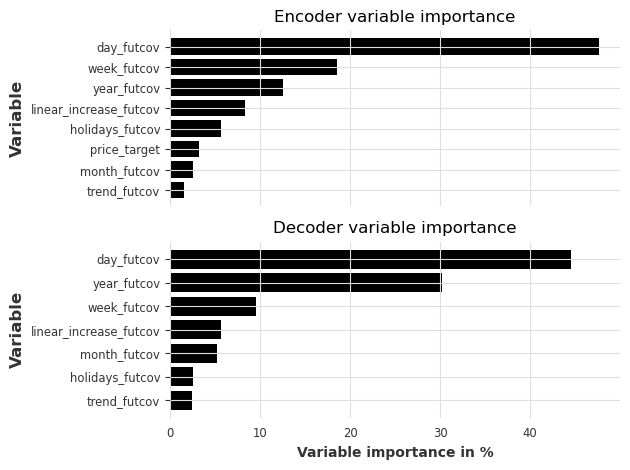

In [280]:
from darts.explainability import TFTExplainer
explainer = TFTExplainer(model)
explainability_result = explainer.explain()
explainer.plot_variable_selection(explainability_result)
# plt.savefig('C:/Users/Razel/Pictures/explainability_plot.png')

In [281]:
# explainTemp1 = explainability_result.get_encoder_importance()
# explainTemp1['type'] = 'encoder'
# explainTemp2 = explainability_result.get_decoder_importance()
# explainTemp2['type'] = 'decoder'
# explainTemp = pd.concat([explainTemp1, explainTemp2])
# explainTemp.set_index('type').to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Table/autoencoderExplained.xlsx")

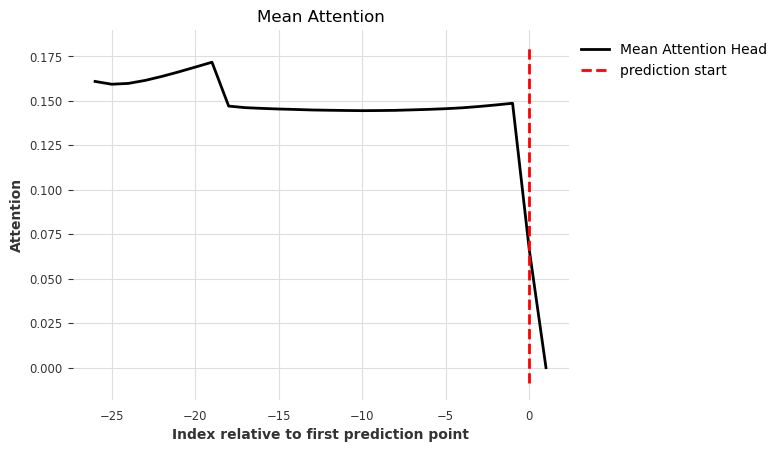

<Axes: title={'center': 'Mean Attention'}, xlabel='Index relative to first prediction point', ylabel='Attention'>

In [282]:
explainer.plot_attention(explainability_result, plot_type="time")

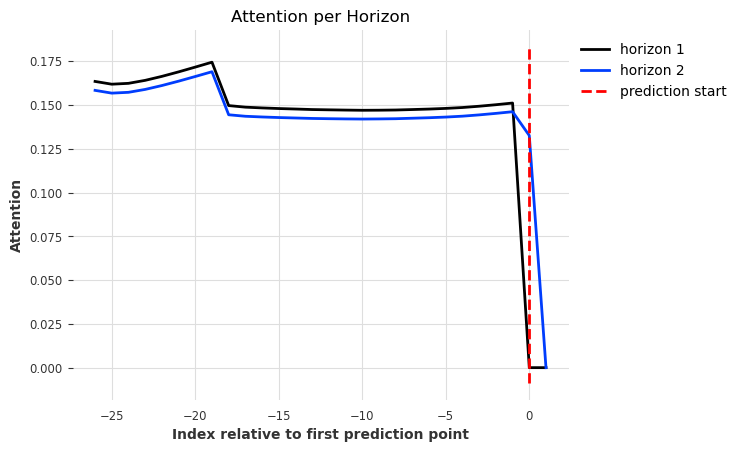

<Axes: title={'center': 'Attention per Horizon'}, xlabel='Index relative to first prediction point', ylabel='Attention'>

In [283]:
explainer.plot_attention(explainability_result, plot_type="all")

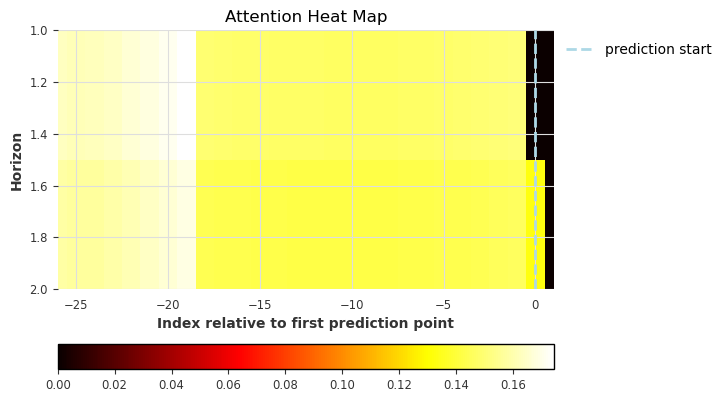

<Axes: title={'center': 'Attention Heat Map'}, xlabel='Index relative to first prediction point', ylabel='Horizon'>

In [284]:
explainer.plot_attention(explainability_result, plot_type="heatmap")

<Axes: xlabel='date'>

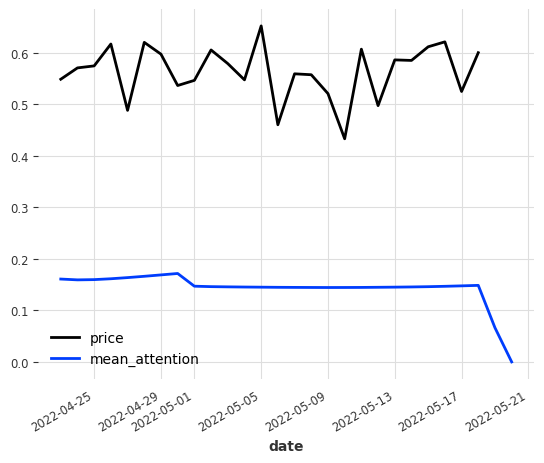

In [285]:
attention = explainability_result.get_attention().mean(axis=1)

time_intersection = ts_ttrain.time_index.intersection(attention.time_index)

ts_ttrain[time_intersection].plot()
attention.plot(label="mean_attention", max_nr_components=12)

# Backtesting

In [124]:
backTest = model.backtest(series = ts_t,
                          future_covariates = cov_t,
                          start = 0.6,
                          forecast_horizon = int(len(ts_t)*0.1),
                          stride = int(len(ts_t)*0.1),
                          verbose = True,
                          retrain = True,
                          metric = [rmse, mae, mape],
                          reduction = None,
                          last_points_only = False,
                          overlap_end = True
                         )

  0%|          | 0/4 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

In [125]:
backTest

[[0.10654169, 0.064793885, 18.195149302482605],
 [0.06454122, 0.045907043, 8.552584797143936],
 [0.033692893, 0.02065931, 3.72067429125309],
 [0.0260754, 0.018381419, 3.0987828969955444]]

In [129]:
testing = [backTest[0][0], backTest[1][0], backTest[2][0], backTest[3][0]]

In [134]:
pd.DataFrame(testing).var()

0    0.001336
dtype: float32

In [146]:
dfResult = pd.DataFrame()
data = ['MA', 'MAnP', 'BP', 'BPnP']
model = ['TFT', 'LSTM', 'TCN', 'GRU']

for x in data:
  for y in model:
    temp = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff2/result{y}_{x}.csv")
    temp.sort_values(by = 'RMSE', inplace = True)
    temp['type'] = y+x
    dfResult = pd.concat([dfResult, temp.iloc[1:5]])

dfResult.set_index('type', inplace = True)

In [147]:
dfResult

,Unnamed: 0,in_len,out_len,hidden_size,lstm_layers,num_attention_heads,dropout,hidden_continuous_size,batch_size,full_attention,...,MAPE,input_chunk_length,training_length,hidden_dim,n_rnn_layers,kernel_size,num_filters,weight_norm,dilation_base,num_layers
type,,,,,,,,,,,,,,,,,,,,,
TFTMA,97,28.0,14.0,30.0,1.0,2.0,0.100824,9.0,256,True,...,3.052722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TFTMA,95,27.0,18.0,27.0,1.0,2.0,0.080196,9.0,256,False,...,3.110798,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TFTMA,98,28.0,13.0,30.0,1.0,2.0,0.126474,9.0,256,True,...,3.044265,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TFTMA,92,26.0,19.0,27.0,1.0,2.0,0.077969,9.0,256,False,...,3.116297,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LSTMMA,77,NaN,NaN,NaN,NaN,NaN,0.020698,NaN,64,NaN,...,3.029953,11.0,15.0,9.0,2.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCNBPnP,63,3.0,1.0,NaN,NaN,NaN,0.209910,NaN,64,NaN,...,7.034457,NaN,NaN,NaN,NaN,1.0,4.0,False,1.0,3.0
GRUBPnP,85,NaN,NaN,NaN,NaN,NaN,0.127193,NaN,256,NaN,...,6.987981,19.0,50.0,10.0,2.0,NaN,NaN,NaN,NaN,NaN
GRUBPnP,99,NaN,NaN,NaN,NaN,NaN,0.292128,NaN,128,NaN,...,7.164492,16.0,40.0,12.0,2.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
# backTestResult = []
i = 0
for index, row in dfResult.iterrows():
    print(f"\nStarting-{i}")
    if i < len(backTestResult):
        print('it is skipped')
        i+=1
        continue
    torch.cuda.empty_cache()
    
    df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])

    if index[-2:] == "MA":
        print("It's MA")
        df2 = replaceOutlierMA(df, 30)
        
        ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

        ts_ttrain = ts_ttrain.astype(np.float32)
        ts_ttest = ts_ttest.astype(np.float32)
        cov_t = cov_t.astype(np.float32)
    elif index[-2:] == "BP":
        print("It's BP")
        df2 = replaceOutlierBP(df)
        
        ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

        ts_ttrain = ts_ttrain.astype(np.float32)
        ts_ttest = ts_ttest.astype(np.float32)
        cov_t = cov_t.astype(np.float32)
    elif index[-4:] == "MAnP":
        print("It's MAnP")
        df2 = replaceOutlierMA(df, 30)
        
        ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

        ts_ttrain = ts_ttrain.astype(np.float32)
        ts_ttest = ts_ttest.astype(np.float32)
        cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)
    elif index[-4:] == "BPnP":
        print("It's BPnP")
        df2 = replaceOutlierBP(df)
        
        ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)

        ts_ttrain = ts_ttrain.astype(np.float32)
        ts_ttest = ts_ttest.astype(np.float32)
        cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)

    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]
    
    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }
    
    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)

    if index[:3] == 'TFT':
        print("TFT")
        # build the TFT model
        model = TFTModel(
            input_chunk_length=int(row['in_len']),
            output_chunk_length=int(row['out_len']),
            hidden_size=int(row['hidden_size']),
            lstm_layers=int(row['lstm_layers']),
            num_attention_heads=int(row['num_attention_heads']),
            dropout=row['dropout'],
            hidden_continuous_size=int(row['hidden_continuous_size']),
            use_static_covariates=True,
            batch_size=int(row['batch_size']),
            optimizer_kwargs={'lr': row['lr']},
            n_epochs=200,
            nr_epochs_val_period=10,
            likelihood=None,
            loss_fn=torch.nn.MSELoss(),
            full_attention=row['full_attention'],
            torch_metrics=MeanAbsolutePercentageError(),
            random_state=42069,
            force_reset=True,
            pl_trainer_kwargs=pl_trainer_kwargs,  # Assuming pl_trainer_kwargs is defined elsewhere
            add_relative_index=False,
        )
        
        # train the model
        model.fit(ts_ttrain,             # Train Price
                  val_series=ts_ttest,          # Val Price
                  future_covariates=cov_t,      # Val Covariate
                  val_future_covariates=cov_t,  # Val Covariate
                  verbose=True)
        
    elif index[:4] == 'LSTM':
        print("LSTM")
        model = RNNModel(
            model = "LSTM",
            hidden_dim = int(row['hidden_dim']),
            n_rnn_layers = int(row['n_rnn_layers']),
            dropout = row['dropout'],
            batch_size = int(row['batch_size']),
            training_length = int(row['training_length']),
            input_chunk_length = int(row["input_chunk_length"]),
            optimizer_kwargs = {"lr": row['lr']},
            n_epochs = 200,
            nr_epochs_val_period = 10,
            torch_metrics = MeanAbsolutePercentageError(),
            log_tensorboard = True,
            random_state = 42069,
            force_reset = True,
            save_checkpoints = False,
            pl_trainer_kwargs = pl_trainer_kwargs
            )

        # when validating during training, we can use a slightly longer validation
        # set which also contains the first input_chunk_length time steps
        # model_val_set = scaler.transform(series[-(VAL_LEN + in_len) :])
    
        # train the model
        model.fit(ts_ttrain,                    # Train Price
                  val_series=ts_ttest,          # Val Price
                  future_covariates=cov_t,      # Val Covariate
                  val_future_covariates=cov_t,  # Val Covariate
                  verbose=True)

    elif index[:3] == 'TCN':
        print("TCN")
        model = TCNModel(
            input_chunk_length = int(row['in_len']),
            output_chunk_length = int(row['out_len']),
            kernel_size = int(row['kernel_size']),
            num_filters = int(row['num_filters']),
            weight_norm = row['weight_norm'],
            dilation_base = int(row['dilation_base']),
            num_layers = int(row['num_layers']),
            dropout = row['dropout'],
            batch_size = int(row['batch_size']),
            optimizer_kwargs = {'lr': row['lr']},
            n_epochs = 200,
            nr_epochs_val_period = 10,
            likelihood = None, 
            loss_fn = torch.nn.MSELoss(),
            torch_metrics = MeanAbsolutePercentageError(),
            random_state = 42069,
            force_reset= True,
            pl_trainer_kwargs = pl_trainer_kwargs,
        )

        # train the model
        model.fit(
            series=ts_ttrain,
            val_series=ts_ttest,
            past_covariates=cov_t,
            val_past_covariates=cov_t,
        )

    else:
        print("GRU")
        model = RNNModel(
            model = "GRU",
            hidden_dim = int(row['hidden_dim']),
            n_rnn_layers = int(row['n_rnn_layers']),
            dropout = row['dropout'],
            batch_size = int(row['batch_size']),
            training_length = int(row['training_length']),
            input_chunk_length = int(row["input_chunk_length"]),
            optimizer_kwargs = {"lr": row['lr']},
            n_epochs = 200,
            nr_epochs_val_period = 10,
            torch_metrics = MeanAbsolutePercentageError(),
            log_tensorboard = True,
            random_state = 42069,
            force_reset = True,
            save_checkpoints = False,
            pl_trainer_kwargs = pl_trainer_kwargs
            )

        # when validating during training, we can use a slightly longer validation
        # set which also contains the first input_chunk_length time steps
        # model_val_set = scaler.transform(series[-(VAL_LEN + in_len) :])
    
        # train the model
        model.fit(ts_ttrain,                    # Train Price
                  val_series=ts_ttest,          # Val Price
                  future_covariates=cov_t,      # Val Covariate
                  val_future_covariates=cov_t,  # Val Covariate
                  verbose=True)

    if index[:3] == 'TCN':
        backTest = model.backtest(series = ts_t,
                                  past_covariates = cov_t,
                                  start = 0.6,
                                  forecast_horizon = int(len(ts_t)*0.1),
                                  stride = int(len(ts_t)*0.1),
                                  verbose = True,
                                  retrain = True,
                                  metric = [rmse, mae],
                                  reduction = None,
                                  last_points_only = False,
                                  overlap_end = True
                                  )
    else:
        backTest = model.backtest(series = ts_t,
                                  future_covariates = cov_t,
                                  start = 0.6,
                                  forecast_horizon = int(len(ts_t)*0.1),
                                  stride = int(len(ts_t)*0.1),
                                  verbose = True,
                                  retrain = True,
                                  metric = [rmse, mae],
                                  reduction = None,
                                  last_points_only = False,
                                  overlap_end = True
                                 )

    backTestResult.append(backTest)
    dfBackTest = pd.DataFrame(backTestResult)
    dfBackTest.to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Backtest Holy/backTest Extra.xlsx")
    i+=1


Starting-0
it is skipped

Starting-1
it is skipped

Starting-2
it is skipped

Starting-3
it is skipped

Starting-4
it is skipped

Starting-5
it is skipped

Starting-6
it is skipped

Starting-7
it is skipped

Starting-8
it is skipped

Starting-9
it is skipped

Starting-10
it is skipped

Starting-11
it is skipped

Starting-12
it is skipped

Starting-13
it is skipped

Starting-14
it is skipped

Starting-15
it is skipped

Starting-16
it is skipped

Starting-17
it is skipped

Starting-18
it is skipped

Starting-19
it is skipped

Starting-20
it is skipped

Starting-21
it is skipped

Starting-22
it is skipped

Starting-23
it is skipped

Starting-24
it is skipped

Starting-25
it is skipped

Starting-26
it is skipped

Starting-27
it is skipped

Starting-28
it is skipped

Starting-29
it is skipped

Starting-30
it is skipped

Starting-31
it is skipped

Starting-32
It's BP
Transforming price
Transforming volume
TFT


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]


Starting-33
It's BP
Transforming price
Transforming volume
TFT


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

In [148]:
backTestResult

[[[0.09466264, 0.062838115, 18.06906759738922],
  [0.06359993, 0.045054976, 8.427778631448746],
  [0.029816974, 0.019023197, 3.4123659133911133],
  [0.023631228, 0.016316945, 2.7751777321100235]],
 [[0.095917135, 0.06297829, 18.35486888885498],
  [0.0647532, 0.04706844, 8.773232251405716],
  [0.028927324, 0.019510191, 3.4431081265211105],
  [0.024293326, 0.017080463, 2.897483855485916]],
 [[0.09655948, 0.063496545, 18.502183258533478],
  [0.061445512, 0.043892883, 8.106819540262222],
  [0.029682338, 0.019562759, 3.5060223191976547],
  [0.023459885, 0.016294777, 2.778112515807152]],
 [[0.09610122, 0.062526844, 18.430933356285095],
  [0.06253948, 0.044569056, 8.294756710529327],
  [0.029287929, 0.019061701, 3.4009791910648346],
  [0.0237877, 0.016808793, 2.857517823576927]],
 [[0.09693333, 0.063538454, 18.81416141986847],
  [0.06247277, 0.044772502, 8.334682136774063],
  [0.029521933, 0.019910375, 3.5475239157676697],
  [0.0249583, 0.01828862, 3.1091075390577316]],
 [[0.09634848, 0.06305

In [102]:
model.fit(ts_ttrain,                    # Train Price
          val_series=ts_ttest,          # Val Price
          future_covariates=cov_t,      # Val Covariate
          val_future_covariates=cov_t,  # Val Covariate
          verbose=True)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

RuntimeError: mat1 and mat2 must have the same dtype, but got Double and Float

In [100]:
backTest = model.backtest(series = ts_t,
                          future_covariates = cov_t,
                          start = 0.6,
                          forecast_horizon = int(len(ts_t)*0.1),
                          stride = int(len(ts_t)*0.1),
                          verbose = True,
                          retrain = True,
                          metric = [rmse, mae, mape],
                          reduction = None,
                          last_points_only = False,
                          overlap_end = True
                         )

  0%|          | 0/4 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

RuntimeError: mat1 and mat2 must have the same dtype, but got Double and Float

In [77]:
backTest

[[0.09637417, 0.06305431, 18.456274271011353],
 [0.061903726, 0.044184733, 8.188183605670929],
 [0.029855112, 0.019741064, 3.547884151339531],
 [0.023337286, 0.016182298, 2.7579687535762787]]

In [62]:
backTest = model.backtest(series = ts_t,
                          future_covariates = cov_t,
                          start = 0.8,
                          forecast_horizon = 102,
                          stride = 102,
                          verbose = True,
                          retrain = True,
                          metric = [rmse, mae, mape],
                          reduction = np.mean,
                          last_points_only = False
                         )

print(backTest)

  0%|          | 0/4 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

[0.02724842 0.01908601 3.31894052]


In [32]:
dfBackTest.index = dfResult.index

In [33]:
dfBackTest

,0,1,2
type,,,
TFTMA,0.026434,0.018139,3.173236
LSTMMA,0.026064,0.017643,3.080051
TCNMA,0.026101,0.017726,3.106940
GRUMA,0.026103,0.017950,3.139866
TFTMAnP,0.026884,0.018900,3.299580
LSTMMAnP,0.025969,0.017443,3.052112
TCNMAnP,0.026577,0.018192,3.188409
GRUMAnP,0.026246,0.017913,3.142016
TFTBP,0.053959,0.036926,7.988825


In [34]:
dfBackTest = pd.DataFrame(backTestResult, index=dfResult.index[:len(backTestResult)], columns = ['RMSE', 'MAE', 'MAPE'])
dfBackTest.to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Backtest Holy/backTest.xlsx")

In [230]:
# model.fit(series=ts_ttrain,             # Train Price
#           val_series=ts_ttest,          # Val Price
#           future_covariates=cov_t,      # Val Covariate
#           val_future_covariates=cov_t,  # Val Covariate

backTest = model.backtest(series = ts_t,
                          future_covariates = cov_t,
                          start = 0.8,
                          forecast_horizon = 102,
                          stride = 102,
                          verbose = True,
                          retrain = True,
                          metric = rmse,
                          reduction = None,
                          last_points_only = False
                         )

  0%|          | 0/4 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

In [235]:
np.mean(backTest)

0.06155755

In [72]:
backTest.pd_dataframe().to_csv("C:/Users/Razel/Documents/backtestTFT.csv")

In [73]:
print(darts.metrics.mape(backTest, ts_ttest))
print(darts.metrics.smape(backTest, ts_ttest))
print(darts.metrics.rmse(backTest, ts_ttest))

3.6161519587039948
3.54800708591938
0.03140582


In [54]:
print(darts.metrics.mape(pred, ts_ttest))
print(darts.metrics.smape(pred, ts_ttest))
print(darts.metrics.rmse(pred, ts_ttest))

3.002534806728363
3.0198760330677032
0.02603064


In [66]:
print(darts.metrics.mape(backTest[0], ts_ttest))
print(darts.metrics.smape(backTest[0], ts_ttest))
print(darts.metrics.rmse(backTest[0], ts_ttest))

1.1417227797210217
1.1352421715855598
0.006641209


# Saved Explainability TFT's Model

## 1st Model

In [113]:
from darts.explainability import TFTExplainer
explainer = TFTExplainer(model)
explainability_result = explainer.explain()
explainer.plot_variable_selection(explainability_result)
# plt.show()
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 Autoencoder Importance.png')

Predicting: |          | 0/? [00:00<?, ?it/s]

In [114]:
explainTemp1 = explainability_result.get_encoder_importance()
explainTemp1['type'] = 'encoder'
explainTemp2 = explainability_result.get_decoder_importance()
explainTemp2['type'] = 'decoder'
explainTemp = pd.concat([explainTemp1, explainTemp2])
explainTemp.set_index('type').to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 autoencoderExplained.xlsx")

In [115]:
explainer.plot_attention(explainability_result, plot_type="time")
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 Mean Attention.png')

## 2nd Model

In [120]:
from darts.explainability import TFTExplainer
explainer = TFTExplainer(model)
explainability_result = explainer.explain()
explainer.plot_variable_selection(explainability_result)
# plt.show()
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 Autoencoder Importance.png')

Predicting: |          | 0/? [00:00<?, ?it/s]

In [121]:
explainTemp1 = explainability_result.get_encoder_importance()
explainTemp1['type'] = 'encoder'
explainTemp2 = explainability_result.get_decoder_importance()
explainTemp2['type'] = 'decoder'
explainTemp = pd.concat([explainTemp1, explainTemp2])
explainTemp.set_index('type').to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 autoencoderExplained.xlsx")

In [122]:
explainer.plot_attention(explainability_result, plot_type="time")
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 Mean Attention.png')

## 3rd Model

In [113]:
from darts.explainability import TFTExplainer
explainer = TFTExplainer(model)
explainability_result = explainer.explain()
explainer.plot_variable_selection(explainability_result)
# plt.show()
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 Autoencoder Importance.png')

Predicting: |          | 0/? [00:00<?, ?it/s]

In [114]:
explainTemp1 = explainability_result.get_encoder_importance()
explainTemp1['type'] = 'encoder'
explainTemp2 = explainability_result.get_decoder_importance()
explainTemp2['type'] = 'decoder'
explainTemp = pd.concat([explainTemp1, explainTemp2])
explainTemp.set_index('type').to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 autoencoderExplained.xlsx")

In [123]:
explainer.plot_attention(explainability_result, plot_type="time")
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 2 Mean Attention.png')

## 4th Model

In [2]:
exRes = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/evalTS Diff4/resultTFT_MAdelVol.csv")

In [3]:
exRes.sort_values(by = "RMSE")

,Unnamed: 0,in_len,out_len,hidden_size,lstm_layers,num_attention_heads,dropout,hidden_continuous_size,batch_size,full_attention,lr,RMSE,MAE,MAPE
38,38,24,31,9,1,3,0.122274,9,256,True,0.003170,0.026282,0.017554,3.071363
83,83,21,15,12,2,4,0.208051,9,256,True,0.002543,0.026345,0.017437,3.041081
61,61,18,16,10,1,5,0.287011,9,256,False,0.002052,0.026358,0.017610,3.073975
80,80,21,18,12,2,4,0.234920,9,256,True,0.002996,0.026394,0.017436,3.041603
55,55,27,18,9,1,2,0.299407,9,256,True,0.002221,0.026418,0.017459,3.054789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,15,11,14,19,2,6,0.099788,9,64,False,0.001071,0.029634,0.020947,3.699268
17,17,5,8,8,2,5,0.131434,6,32,False,0.002650,0.030212,0.020656,3.570452
18,18,23,4,16,2,2,0.290873,9,256,True,0.003459,0.030647,0.022328,3.832021
9,9,3,25,27,3,7,0.245421,7,64,True,0.003015,0.032086,0.020529,3.613076


Predicting: |          | 0/? [00:00<?, ?it/s]

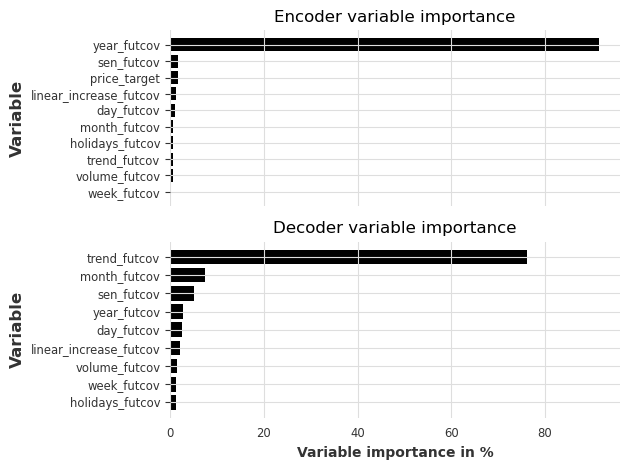

In [100]:
from darts.explainability import TFTExplainer
explainer = TFTExplainer(model)
explainability_result = explainer.explain()
explainer.plot_variable_selection(explainability_result)
plt.show()
# plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 Autoencoder Importance.png')

In [118]:
explainTemp1 = explainability_result.get_encoder_importance()
explainTemp1['type'] = 'encoder'
explainTemp2 = explainability_result.get_decoder_importance()
explainTemp2['type'] = 'decoder'
explainTemp = pd.concat([explainTemp1, explainTemp2])
# explainTemp.set_index('type').to_excel("C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 1 autoencoderExplained.xlsx")

In [119]:
explainTemp = explainTemp.transpose().drop(['year_futcov', 'type'], axis = 0)

In [120]:
explainTemp.columns = ['encoder', 'decoder']

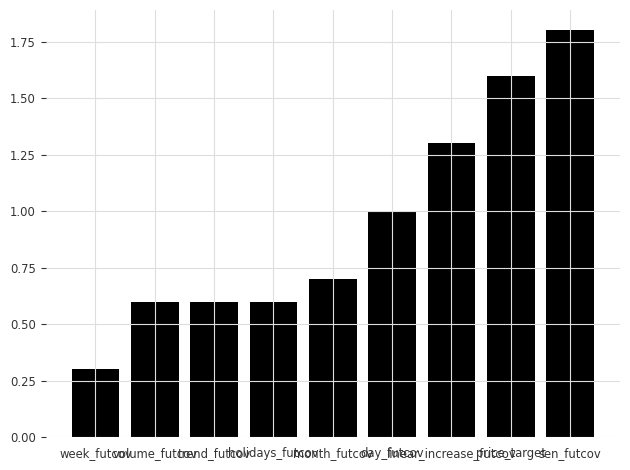

In [128]:
plt.bar(explainTemp.index, height = explainTemp['encoder'])
plt.tight_layout()

In [ ]:
explainer.plot_attention(explainability_result, plot_type="time")
plt.savefig('C:/Users/Razel/Documents/GitHub/Skripsi/Model Explainability/Model 2 Mean Attention.png')

# Calculating Time
#### Should've think about this before hand but ohh well wkwkwk

In [6]:
import time

## TFT

In [132]:
tipe = "TFT"

dfList2 = ['BP', 'MA']
dfList3 = ['', 'nP']

dfResult = pd.DataFrame()

for x in dfList2:
    for y in dfList3:
        temp = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/result{tipe}_{x}{y}.csv")
        temp.sort_values(by = 'RMSE', inplace = True)
        temp['type'] = x+y
        temp.set_index('type', inplace = True)
        dfResult = pd.concat([dfResult, temp.head(1)])

dfResult

,Unnamed: 0,in_len,out_len,hidden_size,lstm_layers,num_attention_heads,dropout,hidden_continuous_size,batch_size,full_attention,lr,RMSE,MAE,MAPE
type,,,,,,,,,,,,,,
BP,34,21,24,26,2,3,0.267877,7,64,False,0.002015,0.046313,0.031195,6.725681
BPnP,89,8,2,8,3,2,0.258685,8,256,True,0.003951,0.047863,0.031632,6.981802
MA,67,25,23,27,1,8,0.049537,9,256,False,0.003397,0.026072,0.017704,3.097297
MAnP,10,31,25,8,1,8,0.223062,8,256,True,0.002241,0.026328,0.017559,3.073656


In [133]:
timeModel = []
for index, row in dfResult.iterrows():
    df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
    
    if index[:2] == "MA":
        df2 = replaceOutlierMA(df, 30)
    else:
        df2 = replaceOutlierBP(df, 'price')
        df2 = replaceOutlierBP(df2, 'volume')

    if adfuller(df2['price'])[1] > 0.05:
        df2['price'] = df2['price'].diff()
    
    if adfuller(df2['volume'])[1] > 0.05:
        df2['volume'] = df2['volume'].diff()
    
    df2 = df2.iloc[1:].copy()
    
    ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
    ts_ttrain = ts_ttrain.astype(np.float32)
    ts_ttest = ts_ttest.astype(np.float32)
    
    if index[2:] == "nP":
        cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)
    else:
        cov_t = cov_t.astype(np.float32)

    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]
    
    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }
    
    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)
    
    # build the TFT model
    model = TFTModel(
        input_chunk_length=row['in_len'],
        output_chunk_length=row['out_len'],
        hidden_size=int(row['hidden_size']),
        lstm_layers=row['lstm_layers'],
        num_attention_heads=row['num_attention_heads'],
        dropout=row['dropout'],
        hidden_continuous_size=row['hidden_continuous_size'],
        use_static_covariates=True,
        batch_size=int(row['batch_size']),
        optimizer_kwargs={'lr': row['lr']},
        n_epochs=500,
        nr_epochs_val_period=10,
        likelihood=None,
        loss_fn=torch.nn.MSELoss(),
        full_attention=row['full_attention'],
        torch_metrics=MeanAbsolutePercentageError(),
        random_state=42069,
        force_reset=True,
        pl_trainer_kwargs=pl_trainer_kwargs,  # Assuming pl_trainer_kwargs is defined elsewhere
        add_relative_index=False,
    )
    
    start = time.time()

    # train the model
    model.fit(ts_ttrain,                    # Train Price
              val_series=ts_ttest,          # Val Price
              future_covariates=cov_t,      # Val Covariate
              val_future_covariates=cov_t,  # Val Covariate
              verbose=True)
    
    trainingTime = time.time() - start

    start = time.time()
    pred = model.predict(len(ts_ttest))
    predictingTime = time.time() - start

    timeModel.append([index, trainingTime, predictingTime])

dfTime = pd.DataFrame(timeModel, columns = ['type', 'Training', 'Prediction'])
dfTime.set_index('type', inplace = True)
dfTime['Total Time'] = dfTime.sum(axis = 1)
dfTime.to_excel(f"C:/Users/Razel/Documents/GitHub/Skripsi/time{tipe}.xlsx")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

## GRU

In [23]:
tipe = "GRU"

dfList2 = ['BP', 'MA']
dfList3 = ['', 'nP']

dfResult = pd.DataFrame()

for x in dfList2:
    for y in dfList3:
        temp = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/result{tipe}_{x}{y}.csv")
        temp.sort_values(by = 'RMSE', inplace = True)
        temp['type'] = x+y
        temp.set_index('type', inplace = True)
        dfResult = pd.concat([dfResult, temp.head(1)])

dfResult

,Unnamed: 0,input_chunk_length,training_length,hidden_dim,n_rnn_layers,dropout,batch_size,lr,RMSE,MAE,MAPE
type,,,,,,,,,,,
BP,43,25,47,18,3,0.199240,256,0.003652,0.047539,0.031575,6.944174
BPnP,96,16,41,12,2,0.135224,128,0.001833,0.047862,0.031803,7.024983
MA,12,15,25,18,3,0.080664,256,0.002912,0.026179,0.017534,3.076381
MAnP,55,21,25,14,3,0.067270,256,0.003925,0.026314,0.017507,3.067821


In [24]:
timeModel = []
for index, row in dfResult.iterrows():
    df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
    
    if index[:2] == "MA":
        df2 = replaceOutlierMA(df, 30)
    else:
        df2 = replaceOutlierBP(df, 'price')
        df2 = replaceOutlierBP(df2, 'volume')

    if adfuller(df2['price'])[1] > 0.05:
        df2['price'] = df2['price'].diff()
    
    if adfuller(df2['volume'])[1] > 0.05:
        df2['volume'] = df2['volume'].diff()
    
    df2 = df2.iloc[1:].copy()
    
    ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
    ts_ttrain = ts_ttrain.astype(np.float32)
    ts_ttest = ts_ttest.astype(np.float32)
    
    if index[2:] == "nP":
        cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)
    else:
        cov_t = cov_t.astype(np.float32)

    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]
    
    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }
    
    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)
    
    # build the GRU model
    model = RNNModel(
        model = "GRU",
        hidden_dim = int(row["hidden_dim"]),
        n_rnn_layers = int(row['n_rnn_layers']),
        dropout = row['dropout'],
        batch_size = int(row['batch_size']),
        training_length = int(row['training_length']),
        input_chunk_length = int(row['input_chunk_length']),
        optimizer_kwargs = {"lr": row['lr']},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        torch_metrics = MeanAbsolutePercentageError(),
        log_tensorboard = True,
        random_state = 42069,
        force_reset = True,
        save_checkpoints = False,
        pl_trainer_kwargs = pl_trainer_kwargs
    )

    start = time.time()

    # train the model
    model.fit(ts_ttrain,                    # Train Price
              val_series=ts_ttest,          # Val Price
              future_covariates=cov_t,      # Val Covariate
              val_future_covariates=cov_t,  # Val Covariate
              verbose=True)
    
    trainingTime = time.time() - start

    start = time.time()
    pred = model.predict(len(ts_ttest))
    predictingTime = time.time() - start

    timeModel.append([index, trainingTime, predictingTime])

dfTime = pd.DataFrame(timeModel, columns = ['type', 'Training', 'Prediction'])
dfTime.set_index('type', inplace = True)
dfTime['Total Time'] = dfTime.sum(axis = 1)
dfTime.to_excel(f"C:/Users/Razel/Documents/GitHub/Skripsi/time{tipe}.xlsx")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

## LSTM

In [18]:
type = "LSTM"

dfList2 = ['BP', 'MA']
dfList3 = ['', 'nP']

dfResult = pd.DataFrame()

for x in dfList2:
    for y in dfList3:
        temp = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/result{type}_{x}{y}.csv")
        temp.sort_values(by = 'RMSE', inplace = True)
        temp['type'] = x+y
        temp.set_index('type', inplace = True)
        dfResult = pd.concat([dfResult, temp.head(1)])

dfResult

,Unnamed: 0,input_chunk_length,training_length,hidden_dim,n_rnn_layers,dropout,batch_size,lr,RMSE,MAE,MAPE
type,,,,,,,,,,,
BP,82,9,20,20,2,0.199006,256,0.001774,0.047694,0.031432,6.930556
BPnP,83,14,48,15,2,0.096764,256,0.001901,0.047921,0.031688,7.006321
MA,42,15,26,20,2,0.054703,256,0.002206,0.026188,0.017440,3.053215
MAnP,32,23,46,8,3,0.064655,64,0.002037,0.026374,0.017407,3.046903


In [19]:
timeModel = []
for index, row in dfResult.iterrows():
    df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
    
    if index[:2] == "MA":
        df2 = replaceOutlierMA(df, 30)
    else:
        df2 = replaceOutlierBP(df, 'price')
        df2 = replaceOutlierBP(df2, 'volume')

    if adfuller(df2['price'])[1] > 0.05:
        df2['price'] = df2['price'].diff()
    
    if adfuller(df2['volume'])[1] > 0.05:
        df2['volume'] = df2['volume'].diff()
    
    df2 = df2.iloc[1:].copy()
    
    ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
    
    if index[2:] == "nP":
        cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)
    else:
        cov_t = cov_t.astype(np.float32)

    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]
    
    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }
    
    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)
    
    # build the TFT model
    model = RNNModel(
        model = "LSTM",
        hidden_dim = int(row["hidden_dim"]),
        n_rnn_layers = int(row['n_rnn_layers']),
        dropout = row['dropout'],
        batch_size = int(row['batch_size']),
        training_length = int(row['training_length']),
        input_chunk_length = int(row['input_chunk_length']),
        optimizer_kwargs = {"lr": row['lr']},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        torch_metrics = MeanAbsolutePercentageError(),
        log_tensorboard = True,
        random_state = 42069,
        force_reset = True,
        save_checkpoints = False,
        pl_trainer_kwargs = pl_trainer_kwargs
    )
    
    start = time.time()

    # train the model
    model.fit(ts_ttrain,                    # Train Price
              val_series=ts_ttest,          # Val Price
              future_covariates=cov_t,      # Val Covariate
              val_future_covariates=cov_t,  # Val Covariate
              verbose=True)
    
    trainingTime = time.time() - start

    start = time.time()
    pred = model.predict(len(ts_ttest))
    predictingTime = time.time() - start

    timeModel.append([index, trainingTime, predictingTime])

dfTime = pd.DataFrame(timeModel, columns = ['type', 'Training', 'Prediction'])
dfTime.set_index('type', inplace = True)
dfTime['Total Time'] = dfTime.sum(axis = 1)
dfTime.to_excel(f"C:/Users/Razel/Documents/GitHub/Skripsi/time{type}.xlsx")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

## TCN

In [20]:
type = "TCN"

dfList2 = ['BP', 'MA']
dfList3 = ['', 'nP']

dfResult = pd.DataFrame()

for x in dfList2:
    for y in dfList3:
        temp = pd.read_csv(f"C:/Users/Razel/Documents/GitHub/Skripsi/result{type}_{x}{y}.csv")
        temp.sort_values(by = 'RMSE', inplace = True)
        temp['type'] = x+y
        temp.set_index('type', inplace = True)
        dfResult = pd.concat([dfResult, temp.head(1)])

dfResult

,Unnamed: 0,in_len,out_len,kernel_size,num_filters,weight_norm,dilation_base,num_layers,dropout,lr,batch_size,RMSE,MAE,MAPE
type,,,,,,,,,,,,,,
BP,89,2,1,1,6,True,4,5,0.230073,0.002877,256,0.047726,0.032158,7.008401
BPnP,99,16,3,2,6,False,4,5,0.291110,0.002999,128,0.047953,0.031774,7.004163
MA,62,7,2,1,2,False,3,2,0.023468,0.003341,128,0.026318,0.017492,3.062652
MAnP,83,24,18,15,2,True,4,1,0.281930,0.004579,64,0.026211,0.017226,3.016585


In [22]:
timeModel = []
for index, row in dfResult.iterrows():
    df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
    
    if index[:2] == "MA":
        df2 = replaceOutlierMA(df, 30)
    else:
        df2 = replaceOutlierBP(df, 'price')
        df2 = replaceOutlierBP(df2, 'volume')

    if adfuller(df2['price'])[1] > 0.05:
        df2['price'] = df2['price'].diff()
    
    if adfuller(df2['volume'])[1] > 0.05:
        df2['volume'] = df2['volume'].diff()
    
    df2 = df2.iloc[1:].copy()
    
    ts_ttrain, ts_ttest, cov_t = createTimeseries(df2)
    
    if index[2:] == "nP":
        cov_t = cov_t[['day', 'week', 'month', 'year', 'linear_increase', 'holidays']].astype(np.float32)
    else:
        cov_t = cov_t.astype(np.float32)

    # throughout training we'll monitor the validation loss for both pruning and early stopping
    my_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=0.01,
        mode='min',)
    
    callbacks = [my_stopper]
    
    pl_trainer_kwargs = {
        "accelerator": "auto",
        "callbacks": callbacks,
    }
    
    # reproducibility
    np.random.seed(42069)
    torch.manual_seed(42069)

    model = TCNModel(
        input_chunk_length = int(row['in_len']),
        output_chunk_length = int(row['out_len']),
        kernel_size = int(row['kernel_size']),
        num_filters = int(row['num_filters']),
        weight_norm = row['weight_norm'],
        dilation_base = int(row['dilation_base']),
        num_layers = int(row['num_layers']),
        dropout = row['dropout'],
        batch_size = int(row['batch_size']),
        optimizer_kwargs = {'lr': row['lr']},
        n_epochs = 500,
        nr_epochs_val_period = 10,
        likelihood = None, 
        loss_fn = torch.nn.MSELoss(),
        torch_metrics = MeanAbsolutePercentageError(),
        random_state = 42069,
        force_reset= True,
        pl_trainer_kwargs = pl_trainer_kwargs,
    )
    
    start = time.time()

    # train the model
    model.fit(
        series=ts_ttrain,
        val_series=ts_ttest,
        past_covariates=cov_t,
        val_past_covariates=cov_t,
    )
    
    trainingTime = time.time() - start

    start = time.time()
    pred = model.predict(len(ts_ttest))
    predictingTime = time.time() - start

    timeModel.append([index, trainingTime, predictingTime])

dfTime = pd.DataFrame(timeModel, columns = ['type', 'Training', 'Prediction'])
dfTime.set_index('type', inplace = True)
dfTime['Total Time'] = dfTime.sum(axis = 1)
dfTime.to_excel(f"C:/Users/Razel/Documents/GitHub/Skripsi/time{type}.xlsx")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

# RANDOM STUFF

In [12]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
df = replaceOutlierMA(df, 30)
print(adfuller(df['price']))
print(adfuller(df['volume']))
print(adfuller(df['sen']))
print(adfuller(df['trend']))

Transforming price
Transforming volume
(-8.106478429732164, 1.2588840680947063e-12, 26, 2007, {'1%': -3.4336124232421144, '5%': -2.8629811656983755, '10%': -2.5675372145497732}, 34202.45182727872)
(-13.07571023831593, 1.91607928302274e-24, 26, 2007, {'1%': -3.4336124232421144, '5%': -2.8629811656983755, '10%': -2.5675372145497732}, 96510.5109909773)
(-6.100646180564664, 9.854574245341239e-08, 13, 2020, {'1%': -3.4335914006772046, '5%': -2.8629718840853307, '10%': -2.5675322725713166}, -824.7875263763112)
(-4.224157718008312, 0.0005995315718949004, 24, 2009, {'1%': -3.4336091712699957, '5%': -2.862979729933645, '10%': -2.567536450078678}, 10234.246077813672)


In [13]:
df = pd.read_csv("C:/Users/Razel/Documents/GitHub/Skripsi/finalData/dataRaw.csv", parse_dates=['date'], index_col = ['date'], usecols = ['date',  'price', 'trend', 'volume', 'sen'])
df = replaceOutlierBP(df)
print(adfuller(df['price']))
print(adfuller(df['volume']))
print(adfuller(df['sen']))
print(adfuller(df['trend']))

Transforming price
Transforming volume
(-7.708434122115849, 1.2829190991764046e-11, 26, 2007, {'1%': -3.4336124232421144, '5%': -2.8629811656983755, '10%': -2.5675372145497732}, 33288.801516692576)
(-13.04456034374451, 2.2054825278372842e-24, 26, 2007, {'1%': -3.4336124232421144, '5%': -2.8629811656983755, '10%': -2.5675372145497732}, 96359.46112448884)
(-6.100646180564664, 9.854574245341239e-08, 13, 2020, {'1%': -3.4335914006772046, '5%': -2.8629718840853307, '10%': -2.5675322725713166}, -824.7875263763112)
(-4.224157718008312, 0.0005995315718949004, 24, 2009, {'1%': -3.4336091712699957, '5%': -2.862979729933645, '10%': -2.567536450078678}, 10234.246077813672)
